# Import libraries

In [1]:
import tensorflow as tf
import numpy as np
import pandas as pd
import os
import sys
import matplotlib.pyplot as plt
import time
import keras
import json 

from shutil import copy
from PIL import Image

sys.path.insert(1, '../../utils')
#from Nutrition5kDataPrep import prepare_data, create_dataset

from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dropout, Dense, GlobalAveragePooling2D, Concatenate
from tensorflow.keras import datasets, layers, models
from keras import regularizers
from tensorflow.keras.applications.inception_v3 import InceptionV3
import sklearn.metrics as sklm

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
def plot(model,history, num_of_labels, data = 'val_', num_of_batches = 22, NotScaledBack = False):
    plt.plot(history.history['loss']) #LOSS
    plt.plot(history.history['val_loss'])
    plt.legend(['train','validation'], bbox_to_anchor=(1.27, 1))
    plt.title(model + ' Loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.xticks(np.arange(1, EPOCHS, 1),fontsize = 8)
        #plt.annotate(round(history.history['loss'][0],1), (1, history.history['loss'][0]), size = 8)
        #plt.annotate(round(history.history['loss'][-1],1), (EPOCHS, history.history['loss'][-1]), size = 8)
        #plt.annotate(round(history.history['val_loss'][0],1), (1, history.history['val_loss'][0]), size = 8)
        #plt.annotate(round(history.history['val_loss'][-1],1), (EPOCHS, history.history['val_loss'][-1]), size = 8)
    plt.show()
    
    if NotScaledBack: # not scaled back before calculating metrics
        for metric in ['NotScaledBack_rmse_','NotScaledBack_mse_', 'NotScaledBack_mae_',
                      'NotScaledBack_non_active_rmse_','NotScaledBack_non_active_mse_','NotScaledBack_non_active_mae_',
                      'NotScaledBack_active_rmse_','NotScaledBack_active_mse_','NotScaledBack_active_mae_']:  # RMSE, MSE, MAE
            for i in range(num_of_labels): 
                plt.plot(np.array(history.history[data + metric + str(i)])/num_of_batches)
            plt.legend(['label_0','label_1','label_2','label_3','label_4','label_5','label_6','label_7','label_8','label_9'], bbox_to_anchor=(1.27, 1))
            if data == '': 
                plt.title(model + ' Training '+ metric[:-1])
            else: 
                plt.title(model + ' Validation '+ metric[:-1])
            plt.ylabel(metric[:-1])
            plt.xlabel('epoch')
            plt.xticks(np.arange(1, EPOCHS, 1),fontsize = 8)
            #plt.annotate(round((np.array(history.history[data + metric + str(i)])/num_of_batches)[0],1), (1, (np.array(history.history[data + metric + str(i)])/num_of_batches)[0]), size = 8)
            #plt.annotate(round((np.array(history.history[data + metric + str(i)])/num_of_batches)[-1],1), (EPOCHS, (np.array(history.history[data + metric + str(i)])/num_of_batches)[-1]), size = 8)
            plt.show()
    else:
        for metric in ['rmse_','mse_', 'mae_',
                      'non_active_rmse_','non_active_mse_','non_active_mae_',
                      'active_rmse_','active_mse_','active_mae_']:  # RMSE, MSE, MAE
            for i in range(num_of_labels): 
                plt.plot(np.array(history.history[data + metric + str(i)])/num_of_batches)
            plt.legend(['label_0','label_1','label_2','label_3','label_4','label_5','label_6','label_7','label_8','label_9'], bbox_to_anchor=(1.27, 1))
            if data == '': 
                plt.title(model + ' Training '+ metric[:-1])
            else: 
                plt.title(model + ' Validation '+ metric[:-1])
            plt.ylabel(metric[:-1])
            plt.xlabel('epoch')
            plt.xticks(np.arange(1, EPOCHS, 1),fontsize = 8)
            #plt.annotate(round((np.array(history.history[data + metric + str(i)])/num_of_batches)[0],1), (1, (np.array(history.history[data + metric + str(i)])/num_of_batches)[0]), size = 8)
            #plt.annotate(round((np.array(history.history[data + metric + str(i)])/num_of_batches)[-1],1), (EPOCHS, (np.array(history.history[data + metric + str(i)])/num_of_batches)[-1]), size = 8)
            plt.show()


# Data Preparation

In [3]:
# Helper method to split dataset into train and test folders
def prepare_data(filepath, src, dest):
    with open(filepath, 'r') as txt:
        paths = [read.strip()+'/rgb.png' for read in txt.readlines()]

    if not os.path.exists(dest):
        os.makedirs(dest)

    for food in paths:
        out = food.split('/')
        dest_name = out[0]+'.png'
        src_path = os.path.join(src,food)
        dest_path = os.path.join(dest,dest_name)

        if (not os.path.exists(dest_path)) and os.path.exists(src_path):
            # print("\nCopying images into ", dest_name)
            copy(os.path.join(src,food), os.path.join(dest,dest_name))

    print("Copying Done!")


def create_dataset(filenames, labels,
                   is_training=True,
                   img_size = 224, channels = 3,
                   batch_size = 256, buffer_size = 1024):
    """Load and parse dataset.
    Args:
        filenames: list of image paths
        labels: numpy array of shape (BATCH_SIZE, N_LABELS)
        is_training: boolean to indicate training mode
    """

    # Create a first dataset of file paths and labels
    dataset = tf.data.Dataset.from_tensor_slices((filenames, labels))
    AUTOTUNE = tf.data.experimental.AUTOTUNE # Adapt preprocessing and prefetching dynamically
    # Parse and preprocess observations in parallel
    dataset = dataset.map(lambda x, y: parse_function(x, y, img_size=img_size, channels=channels),
                          num_parallel_calls=AUTOTUNE)

    if is_training == True:
        # This is a small dataset, only load it once, and keep it in memory.
        dataset = dataset.cache()
        # Shuffle the data each buffer size
        dataset = dataset.shuffle(buffer_size=buffer_size)

    # Batch the data for multiple steps
    dataset = dataset.batch(batch_size=batch_size)
    # Fetch batches in the background while the model is training.
    dataset = dataset.prefetch(buffer_size=AUTOTUNE)

    return dataset
    
def parse_function(filename, label, img_size = 224, channels = 3):
    """Function that returns a tuple of normalized image array and labels array.
    Args:
        filename: string representing path to image
        label: 0/1 one-dimensional array of size N_LABELS
    """
    # Read an image from a file
    image_string = tf.io.read_file(filename)
    # Decode it into a dense vector
    image_decoded = tf.io.decode_png(image_string, channels=channels)
    # Resize it to fixed shape
    image_resized = tf.image.resize(image_decoded, [img_size, img_size])
    # Normalize it from [0, 255] to [0.0, 1.0]
    image_normalized = image_resized / 255.0
    return image_normalized, label

In [4]:
import os
os.chdir("./drive/MyDrive/Nutrition5k")

In [56]:
# Prepare train dataset
print("Creating train data...")
filepath = './data/Nutrition5k/dish_ids/splits/rgb_train_ids.txt' # directory to rgb_train_ids.txt
src = './data/Nutrition5k/realsense_overhead'                     # directory to images 
dest = './data/Nutrition5k/train_rgb'                             # directory to train_rgb folder
prepare_data(filepath, src, dest)

# Prepare test dataset
print("Creating test data...")
filepath = './data/Nutrition5k/dish_ids/splits/rgb_test_ids.txt' # directory to rgb_test_ids.txt
src = './data/Nutrition5k/realsense_overhead'                    # directory to images 
dest = './data/Nutrition5k/test_rgb'                             # directory to test_rgb folder
prepare_data(filepath, src, dest)

# read specified labels
labels = pd.read_csv('./data/Nutrition5k/nutrition5k_10_visible_ingr_calorie.csv')#.iloc[: , 1:]
labels['dish_id'] = labels['dish_id'] + '.png'
ingred = labels.iloc[: , 1:].columns

Creating train data...
Copying Done!
Creating test data...
Copying Done!


In [21]:
labels

,dish_id,garlic,spinach (raw),cheese pizza,olives,cilantro,roasted potatoes,corn on the cob,sausage,tofu,chicken breast
0,dish_1561662216.png,3.164916,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,dish_1561662054.png,4.480668,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,dish_1562008979.png,2.300097,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,dish_1560455030.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,dish_1558372433.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
3257,dish_1563295334.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3258,dish_1566329234.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3259,dish_1562691737.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3260,dish_1558458496.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [15]:
labels.describe()

,garlic,spinach (raw),cheese pizza,olives,cilantro,roasted potatoes,corn on the cob,sausage,tofu,chicken breast
count,3262.000000,3262.000000,3262.000000,3262.000000,3262.000000,3262.000000,3262.000000,3262.000000,3262.000000,3262.000000
mean,0.535473,0.634597,14.591079,3.109303,0.013088,4.634586,3.277651,7.877628,1.331769,2.083745
std,1.403449,2.531019,55.114343,15.564319,0.066145,23.307076,17.885589,49.067047,9.791277,18.736765
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.402388,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,14.746660,27.213214,606.252000,148.350000,0.762687,227.010000,207.956000,454.872000,185.420000,295.799579


Shape of features array: (64, 224, 224, 3)
Shape of labels array: (64, 10)


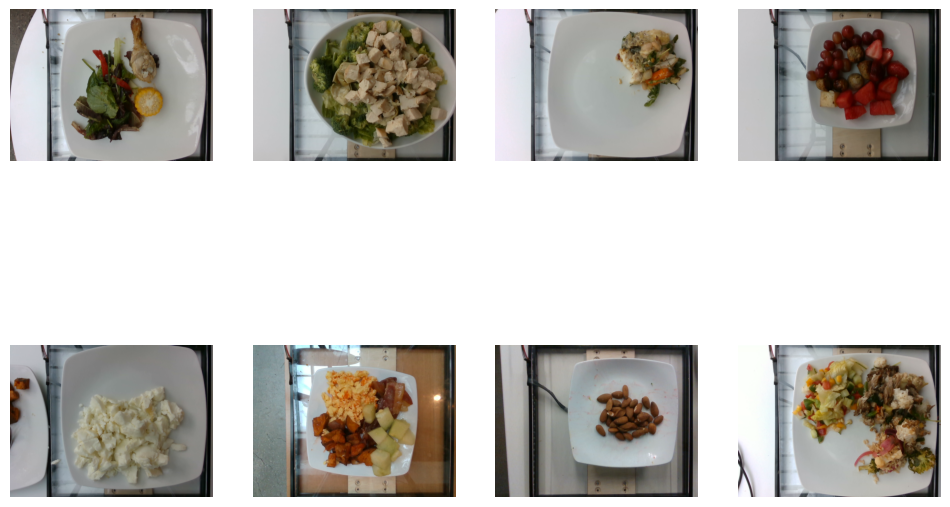

In [57]:
# split dataset into train and val
train_dest = './data/Nutrition5k/train_rgb'
test_dest = './data/Nutrition5k/test_rgb'

X_train = [os.path.join(train_dest, img) for img in os.listdir(train_dest)]
X_val = [os.path.join(test_dest, img) for img in os.listdir(test_dest)]

y_train = labels.loc[labels.dish_id.isin(os.listdir(train_dest))]\
                .set_index('dish_id').reindex(os.listdir(train_dest))\
                .to_numpy().tolist()

y_val = labels.loc[labels.dish_id.isin(os.listdir(test_dest))]\
                .set_index('dish_id').reindex(os.listdir(test_dest))\
                .to_numpy().tolist()
arr_y_val = np.array(y_val)

nobs = 8 # Maximum number of images to display
ncols = 4 # Number of columns in display
nrows = nobs//ncols # Number of rows in display

plt.figure(figsize=(12,4*nrows))
for i in range(nrows*ncols):
    ax = plt.subplot(nrows, ncols, i+1)
    plt.imshow(Image.open(X_train[i]))
    plt.title(' & '.join(np.array(ingred)[(np.array(y_train[i])==1)]))
    plt.axis('off')

# define some params
IMG_SIZE = 224 # Specify height and width of image to match the input format of the model
CHANNELS = 3 # Keep RGB color channels to match the input format of the model
BATCH_SIZE = 64
AUTOTUNE = tf.data.experimental.AUTOTUNE # Adapt preprocessing and prefetching dynamically
SHUFFLE_BUFFER_SIZE = 1024 # Shuffle the training data by a chunck of 1024 observations

# create datasets
train_ds = create_dataset(X_train, y_train, is_training=True,
                          img_size = IMG_SIZE, channels = CHANNELS,
                          batch_size = BATCH_SIZE, buffer_size = SHUFFLE_BUFFER_SIZE)

val_ds = create_dataset(X_val, y_val,
                        img_size = IMG_SIZE, channels = CHANNELS,
                        batch_size = BATCH_SIZE, buffer_size = SHUFFLE_BUFFER_SIZE)

for f, l in train_ds.take(1):
    print("Shape of features array:", f.numpy().shape)
    print("Shape of labels array:", l.numpy().shape)

# Scale

In [17]:
pd.DataFrame(y_train).describe()

,0,1,2,3,4,5,6,7,8,9
count,2755.000000,2755.000000,2755.000000,2755.000000,2755.000000,2755.000000,2755.00000,2755.000000,2755.000000,2755.000000
mean,0.550192,0.633083,14.732115,3.429623,0.014063,4.775575,3.14911,8.449267,1.386073,2.022744
std,1.447911,2.598044,54.287872,16.436805,0.068854,23.322968,17.69698,50.985420,9.847303,18.302030
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
75%,0.463058,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
max,14.746660,27.213214,465.325000,148.350000,0.762687,227.010000,207.95600,454.872000,185.420000,295.799579


In [18]:
# min-max normalization
max_by_label = pd.DataFrame(y_train).describe().iloc[-1]
print(max_by_label)
min_by_label = pd.DataFrame(y_train).describe().iloc[3]
print(min_by_label)
for idx,i in enumerate(labels.columns[1:]):
    labels[i] = labels[i].apply(lambda x: (x - min_by_label[idx]) / (max_by_label[idx] - min_by_label[idx]))

0     14.746660
1     27.213214
2    465.325000
3    148.350000
4      0.762687
5    227.010000
6    207.956000
7    454.872000
8    185.420000
9    295.799579
Name: max, dtype: float64
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
5    0.0
6    0.0
7    0.0
8    0.0
9    0.0
Name: min, dtype: float64


In [ ]:
labels

OR

In [26]:
# scale labels by std and mean of training ingredients
std_by_label = pd.DataFrame(y_train).describe().iloc[2]
print(std_by_label)
mean_by_label = pd.DataFrame(y_train).describe().iloc[1]
print(mean_by_label)
for idx,i in enumerate(labels.columns[1:]):
    labels[i] = labels[i].apply(lambda x: (x - mean_by_label[idx]) / std_by_label[idx])

0     1.447911
1     2.598044
2    54.287872
3    16.436805
4     0.068854
5    23.322968
6    17.696980
7    50.985420
8     9.847303
9    18.302030
Name: std, dtype: float64
0     0.550192
1     0.633083
2    14.732115
3     3.429623
4     0.014063
5     4.775575
6     3.149110
7     8.449267
8     1.386073
9     2.022744
Name: mean, dtype: float64


In [27]:
labels

,dish_id,garlic,spinach (raw),cheese pizza,olives,cilantro,roasted potatoes,corn on the cob,sausage,tofu,chicken breast
0,dish_1561662216.png,1.805860,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052
1,dish_1561662054.png,2.714584,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052
2,dish_1562008979.png,1.208572,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052
3,dish_1560455030.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052
4,dish_1558372433.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052
...,...,...,...,...,...,...,...,...,...,...,...
3257,dish_1563295334.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052
3258,dish_1566329234.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052
3259,dish_1562691737.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052
3260,dish_1558458496.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052


In [ ]:
labels.describe()

Shape of features array: (128, 224, 224, 3)
Shape of labels array: (128, 10)


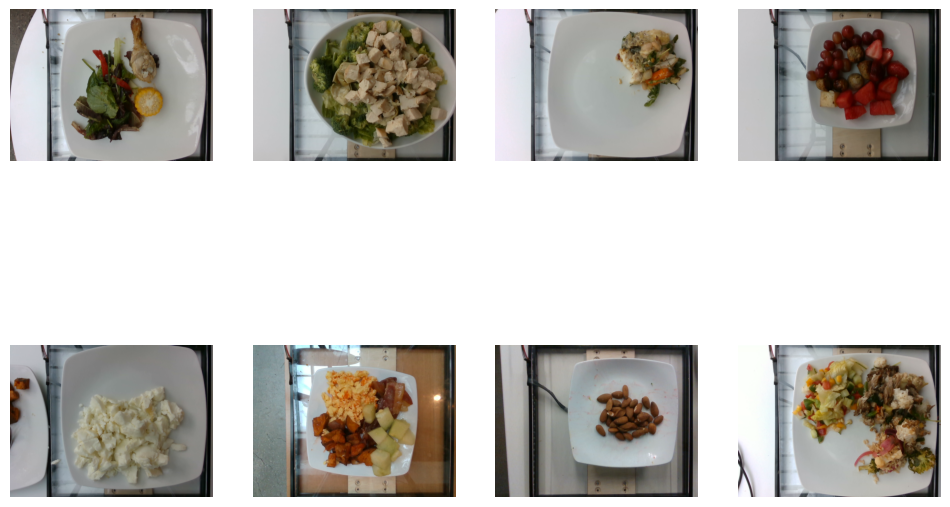

In [30]:
# split scaled dataset into train and val
train_dest = './data/Nutrition5k/train_rgb'
test_dest = './data/Nutrition5k/test_rgb'

X_train = [os.path.join(train_dest, img) for img in os.listdir(train_dest)]
X_val = [os.path.join(test_dest, img) for img in os.listdir(test_dest)]

y_train = labels.loc[labels.dish_id.isin(os.listdir(train_dest))]\
                .set_index('dish_id').reindex(os.listdir(train_dest))\
                .to_numpy().tolist()

y_val = labels.loc[labels.dish_id.isin(os.listdir(test_dest))]\
                .set_index('dish_id').reindex(os.listdir(test_dest))\
                .to_numpy().tolist()

nobs = 8 # Maximum number of images to display
ncols = 4 # Number of columns in display
nrows = nobs//ncols # Number of rows in display

plt.figure(figsize=(12,4*nrows))
for i in range(nrows*ncols):
    ax = plt.subplot(nrows, ncols, i+1)
    plt.imshow(Image.open(X_train[i]))
    plt.title(' & '.join(np.array(ingred)[(np.array(y_train[i])==1)]))
    plt.axis('off')

# define some params
IMG_SIZE = 224 # Specify height and width of image to match the input format of the model
CHANNELS = 3 # Keep RGB color channels to match the input format of the model
BATCH_SIZE = 128
AUTOTUNE = tf.data.experimental.AUTOTUNE # Adapt preprocessing and prefetching dynamically
SHUFFLE_BUFFER_SIZE = 1024 # Shuffle the training data by a chunck of 1024 observations

# create datasets
train_ds = create_dataset(X_train, y_train, is_training=True,
                          img_size = IMG_SIZE, channels = CHANNELS,
                          batch_size = BATCH_SIZE, buffer_size = SHUFFLE_BUFFER_SIZE)

val_ds = create_dataset(X_val, y_val,
                        img_size = IMG_SIZE, channels = CHANNELS,
                        batch_size = BATCH_SIZE, buffer_size = SHUFFLE_BUFFER_SIZE)

for f, l in train_ds.take(1):
    print("Shape of features array:", f.numpy().shape)
    print("Shape of labels array:", l.numpy().shape)

In [31]:
labels

,dish_id,garlic,spinach (raw),cheese pizza,olives,cilantro,roasted potatoes,corn on the cob,sausage,tofu,chicken breast
0,dish_1561662216.png,1.805860,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052
1,dish_1561662054.png,2.714584,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052
2,dish_1562008979.png,1.208572,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052
3,dish_1560455030.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052
4,dish_1558372433.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052
...,...,...,...,...,...,...,...,...,...,...,...
3257,dish_1563295334.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052
3258,dish_1566329234.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052
3259,dish_1562691737.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052
3260,dish_1558458496.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,-0.11052


In [55]:
y_train

[[-0.16420152424338408,
  -0.2436769625855038,
  -0.27137027384895496,
  -0.20865506338494022,
  -0.20424210392188175,
  -0.2047584692588242,
  2.4600180672092318,
  -0.16571927523215726,
  -0.14075657603758443,
  -0.11052021653309702],
 [-0.3799900432763781,
  -0.2436769625855038,
  -0.27137027384895496,
  -0.20865506338494022,
  -0.20424210392188175,
  -0.2047584692588242,
  -0.17794615974071712,
  -0.16571927523215726,
  -0.14075657603758443,
  -0.11052021653309702],
 [0.24571155793145552,
  -0.2436769625855038,
  -0.27137027384895496,
  -0.20865506338494022,
  -0.20424210392188175,
  -0.2047584692588242,
  -0.17794615974071712,
  -0.16571927523215726,
  -0.14075657603758443,
  -0.11052021653309702],
 [-0.3799900432763781,
  -0.2436769625855038,
  -0.27137027384895496,
  -0.20865506338494022,
  -0.20424210392188175,
  0.8229837778462052,
  -0.17794615974071712,
  -0.16571927523215726,
  -0.14075657603758443,
  -0.11052021653309702],
 [-0.3799900432763781,
  -0.2436769625855038,
  -0

# Reshape IMAGE_SIZE

In [48]:
train_ds = train_ds.map(lambda x,y: (tf.image.resize(x, (75,75)),y))
val_ds = val_ds.map(lambda x,y: (tf.image.resize(x, (75,75)),y))

# Metrics

In [33]:
std_by_label.reset_index(drop=True,inplace=True)
mean_by_label.reset_index(drop=True,inplace=True)

In [34]:
std_by_label

0     1.447911
1     2.598044
2    54.287872
3    16.436805
4     0.068854
5    23.322968
6    17.696980
7    50.985420
8     9.847303
9    18.302030
Name: std, dtype: float64

In [35]:
mean_by_label

0     0.550192
1     0.633083
2    14.732115
3     3.429623
4     0.014063
5     4.775575
6     3.149110
7     8.449267
8     1.386073
9     2.022744
Name: mean, dtype: float64

In [36]:
class self_RMSE(tf.keras.metrics.Metric):
    """
    Calculates total RMSE for a label.
    NOTE: we needs to calculate average later separately
          by dividing total RMSE for a label by the number of batches

    """
    def __init__(self, class_id, std_by_label, mean_by_label, value, scale = True, name='rmse'):
        super(self_RMSE, self).__init__(name=name)
        self.class_id = class_id
        self.std_by_label = std_by_label
        self.mean_by_label = mean_by_label
        self.scale = scale
        self.value = value
        self.rmse = self.add_weight(name='rmse', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        if self.scale: # rescale y_true and y_pred back by "y * std + mean"
            y_true = tf.cast(y_true[:,self.class_id], tf.float32)*self.std_by_label[self.class_id]+self.mean_by_label[self.class_id]
            y_pred = y_pred[:,self.class_id] * self.std_by_label[self.class_id]+self.mean_by_label[self.class_id]
        else:
            y_true = tf.cast(y_true[:,self.class_id], tf.float32)
            y_pred = y_pred[:,self.class_id]
        # filter y_true and y_pred based on parameter "value": value == any; value == 'positive'; value == 'zero'        
        if self.value == 'zero':
            zero_indices = tf.where(y_true == 0)
            if len(zero_indices) != 0:
                y_true = tf.gather(y_true, zero_indices)
                y_pred = tf.gather(y_pred, zero_indices)
                y_true = tf.reshape(y_true, [len(zero_indices)])
                y_pred = tf.reshape(y_pred, [len(zero_indices)])
                self.rmse.assign_add((tf.keras.metrics.mean_squared_error(y_true,y_pred))**0.5)
                  
        elif self.value == 'positive':
            positive_indices = tf.where(y_true > 0)
            if len(positive_indices) != 0:
                y_true = tf.gather(y_true, positive_indices)
                y_pred = tf.gather(y_pred, positive_indices)
                y_true = tf.reshape(y_true, [len(positive_indices)])
                y_pred = tf.reshape(y_pred, [len(positive_indices)])
                self.rmse.assign_add((tf.keras.metrics.mean_squared_error(y_true,y_pred))**0.5)  

        else:
            self.rmse.assign_add((tf.keras.metrics.mean_squared_error(y_true,y_pred))**0.5)

    def result(self):
        return self.rmse

    def reset_state(self):
        self.rmse.assign(0.)

In [37]:
class self_MSE(tf.keras.metrics.Metric):
    """
    Calculates total MSE for a label.
    NOTE: we needs to calculate average later separately
          by dividing total MSE for a label by the number of batches

    """
    def __init__(self, class_id, std_by_label, mean_by_label, value, scale = True, name='mse'):
        super(self_MSE, self).__init__(name=name)
        self.class_id = class_id
        self.std_by_label = std_by_label
        self.mean_by_label = mean_by_label
        self.scale = scale
        self.value = value
        self.mse = self.add_weight(name='mse', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        # scale y_true and y_pred back by * std of the corresponding class_id
        if self.scale:
            y_true = tf.cast(y_true[:,self.class_id], tf.float32) * self.std_by_label[self.class_id]+self.mean_by_label[self.class_id]
            y_pred = y_pred[:,self.class_id] * self.std_by_label[self.class_id]+self.mean_by_label[self.class_id]
        else:
            y_true = tf.cast(y_true[:,self.class_id], tf.float32)
            y_pred = y_pred[:,self.class_id]
            
        # filter y_true and y_pred based on parameter "value": value == any; value == 'positive'; value == 'zero'
        if self.value == 'zero':
            zero_indices = tf.where(y_true == 0)
            if len(zero_indices) != 0:
                y_true = tf.gather(y_true, zero_indices)
                y_pred = tf.gather(y_pred, zero_indices)
                y_true = tf.reshape(y_true, [len(zero_indices)])
                y_pred = tf.reshape(y_pred, [len(zero_indices)])
                self.mse.assign_add(tf.keras.metrics.mean_squared_error(y_true,y_pred))     
        elif self.value == 'positive':
            positive_indices = tf.where(y_true > 0)
            if len(positive_indices) != 0:
                y_true = tf.gather(y_true, positive_indices)
                y_pred = tf.gather(y_pred, positive_indices)
                y_true = tf.reshape(y_true, [len(positive_indices)])
                y_pred = tf.reshape(y_pred, [len(positive_indices)])
                self.mse.assign_add(tf.keras.metrics.mean_squared_error(y_true,y_pred))    
        else:
            self.mse.assign_add(tf.keras.metrics.mean_squared_error(y_true, y_pred))


    def result(self):
        return self.mse

    def reset_state(self):
        self.mse.assign(0.)

In [38]:
class self_MAE(tf.keras.metrics.Metric):
    """
    Calculates total MAE for a label.
    NOTE: we needs to calculate average later separately
          by dividing total MAE for a label by the number of batches
    """
    def __init__(self, class_id, std_by_label, mean_by_label, value, scale = True, name='mae'):
        super(self_MAE, self).__init__(name=name)
        self.class_id = class_id
        self.std_by_label = std_by_label
        self.mean_by_label = mean_by_label
        self.scale = scale
        self.value = value
        self.mae = self.add_weight(name='mae', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        # scale y_true and y_pred back by * std of the corresponding class_id
        if self.scale:
            y_true = tf.cast(y_true[:,self.class_id], tf.float32) * self.std_by_label[self.class_id]+self.mean_by_label[self.class_id]
            y_pred = y_pred[:,self.class_id] * self.std_by_label[self.class_id]+self.mean_by_label[self.class_id]
        else:
            y_true = tf.cast(y_true[:,self.class_id], tf.float32)
            y_pred = y_pred[:,self.class_id]
            
        # filter y_true and y_pred based on parameter "value": value == any; value == 'positive'; value == 'zero'
        if self.value == 'zero':
            zero_indices = tf.where(y_true == 0)
            if len(zero_indices) != 0:
                y_true = tf.gather(y_true, zero_indices)
                y_pred = tf.gather(y_pred, zero_indices)
                y_true = tf.reshape(y_true, [len(zero_indices)])
                y_pred = tf.reshape(y_pred, [len(zero_indices)])
                self.mae.assign_add(tf.keras.metrics.mean_absolute_error(y_true,y_pred))
                  
        elif self.value == 'positive':
            positive_indices = tf.where(y_true != 0)
            if len(positive_indices) != 0:
                y_true = tf.gather(y_true, positive_indices)
                y_pred = tf.gather(y_pred, positive_indices)
                y_true = tf.reshape(y_true, [len(positive_indices)])
                y_pred = tf.reshape(y_pred, [len(positive_indices)])
                self.mae.assign_add(tf.keras.metrics.mean_absolute_error(y_true,y_pred))
        else:
            self.mae.assign_add(tf.keras.metrics.mean_absolute_error(y_true,y_pred))

    def result(self):
        return self.mae

    def reset_state(self):
        self.mae.assign(0.)

In [39]:
class self_RSquare(tf.keras.metrics.Metric):
    """
    Calculates R^2 for a label.
    """
    def __init__(self, class_id, std_by_label, mean_by_label, value,scale = True, name='R^2'):
        super(self_RSquare, self).__init__(name=name)
        self.class_id = class_id
        self.std_by_label = std_by_label
        self.mean_by_label = mean_by_label
        self.scale = scale
        self.value = value
        self.unexplained_error = self.add_weight(name='unexplained_error', initializer='zeros')
        self.total_error = self.add_weight(name='total_error', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        # scale y_true and y_pred back by * std of the corresponding class_id
        if self.scale:
            y_true = tf.cast(y_true[:,self.class_id], tf.float32) * self.std_by_label[self.class_id]+self.mean_by_label[self.class_id]
            y_pred = y_pred[:,self.class_id] * self.std_by_label[self.class_id]+self.mean_by_label[self.class_id]
        # filter y_true and y_pred based on parameter "value": value == any; value == 'positive'; value == 'zero'
        if self.value == 'zero':
            zero_indices = tf.where(y_true == 0)
            if len(zero_indices) != 0:
                y_true = tf.gather(y_true, zero_indices)
                y_pred = tf.gather(y_pred, zero_indices)
                y_true = tf.reshape(y_true, [len(zero_indices)])
                y_pred = tf.reshape(y_pred, [len(zero_indices)])
                total = tf.reduce_sum(tf.square(tf.subtract(y_true, tf.reduce_mean(y_true))))
                self.unexplained_error.assign_add(unexplained)
                self.total_error.assign_add(total)

        elif self.value == 'positive':
            positive_indices = tf.where(y_true > 0)
            if len(positive_indices) != 0:
                y_true = tf.gather(y_true, positive_indices)
                y_pred = tf.gather(y_pred, positive_indices)
                y_true = tf.reshape(y_true, [len(positive_indices)])
                y_pred = tf.reshape(y_pred, [len(positive_indices)])
                total = tf.reduce_sum(tf.square(tf.subtract(y_true, tf.reduce_mean(y_true))))
                self.unexplained_error.assign_add(unexplained)
                self.total_error.assign_add(total)
        
        else:
            total = tf.reduce_sum(tf.square(tf.subtract(y_true, tf.reduce_mean(y_true))))
            self.unexplained_error.assign_add(unexplained)
            self.total_error.assign_add(total)

    def result(self):
        self.unexplained_error = tf.cast(self.unexplained_error, tf.float32)
        self.total_error = tf.cast(self.total_error, tf.float32)
        return tf.subtract(1.0, tf.divide(self.unexplained_error, self.total_error))

    def reset_state(self):
        self.unexplained_error.assign(0.)
        self.total_error.assign(0.)

# Inception V3
input shape = (224, 224, 3)
batch size =64

In [40]:
input_shape = (224, 224, 3)

### standarized data

**MAE**

**MSE**

### Min-max

**MAE**

In [ ]:
# cosine decay learning rate
lr_decayed_fn = tf.keras.experimental.CosineDecay(initial_learning_rate=0.0001, decay_steps=1000)
optimizer_adam_cos_decay = tf.keras.optimizers.Adam(learning_rate=lr_decayed_fn)

tf.keras.backend.clear_session()
    
model5 = tf.keras.models.Sequential([
            InceptionV3(input_shape = input_shape, include_top=False, weights='imagenet',  pooling = "avg"),
            tf.keras.layers.Dense(num_of_preds, activation = 'relu')
        ])    

model5.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 2048)              21802784  
                                                                 
 dense (Dense)               (None, 10)                20490     
                                                                 
Total params: 21,823,274
Trainable params: 21,788,842
Non-trainable params: 34,432
_________________________________________________________________


In [ ]:
model5.compile(
            loss = tf.keras.losses.MeanAbsoluteError(tf.keras.losses.Reduction.SUM_OVER_BATCH_SIZE), #mean mae per sample
            optimizer = optimizer_adam_cos_decay,
            metrics = [[self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all',name = 'rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', name = 'mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', name = 'mae_' + str(i)) for i in range(10)],                
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_mae_' + str(i)) for i in range(10)],
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_mae_' + str(i)) for i in range(10)], 
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False,name = 'NotScaledBack_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False, name = 'NotScaledBack_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False, name = 'NotScaledBack_mae_' + str(i)) for i in range(10)],                
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_mae_' + str(i)) for i in range(10)],
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_mae_' + str(i)) for i in range(10)]], 
            run_eagerly=True)

start_time = time.time()
history5= model5.fit(train_ds, validation_data = val_ds, epochs=EPOCHS)
end_time = time.time()
print('Time takes to train:'.format(EPOCHS), end_time - start_time)

Epoch 1/30
 2/22 [=>............................] - ETA: 14:34 - loss: 0.3241 - rmse_0: 21.7044 - rmse_1: 10.5163 - rmse_2: 319.6725 - rmse_3: 148.3252 - rmse_4: 0.2154 - rmse_5: 116.9500 - rmse_6: 423.9614 - rmse_7: 143.1878 - rmse_8: 122.1880 - rmse_9: 444.7397 - mse_0: 235.9662 - mse_1: 55.4896 - mse_2: 51620.2656 - mse_3: 11068.1914 - mse_4: 0.0232 - mse_5: 6917.3413 - mse_6: 90020.5781 - mse_7: 10254.8652 - mse_8: 7573.9917 - mse_9: 99430.9609 - mae_0: 17.9345 - mae_1: 4.9759 - mae_2: 198.5728 - mae_3: 109.5291 - mae_4: 0.0733 - mae_5: 53.8351 - mae_6: 379.5403 - mae_7: 42.6270 - mae_8: 76.1843 - mae_9: 371.0006 - non_active_rmse_0: 22.9138 - non_active_rmse_1: 9.2265 - non_active_rmse_2: 317.3950 - non_active_rmse_3: 149.0340 - non_active_rmse_4: 0.1712 - non_active_rmse_5: 113.9792 - non_active_rmse_6: 427.3240 - non_active_rmse_7: 94.9263 - non_active_rmse_8: 119.5898 - non_active_rmse_9: 448.0075 - non_active_mse_0: 262.6129 - non_active_mse_1: 42.6699 - non_active_mse_2: 5072

KeyboardInterrupt: 

In [ ]:
plot('InceptionV3', history5, num_of_preds, data = '', num_of_batches = len(train_ds))

In [ ]:
plot('InceptionV3', history5, num_of_preds, data = 'val_', num_of_batches = len(val_ds)) 

In [ ]:
plot('InceptionV3', history5, num_of_preds, data = '', num_of_batches = len(train_ds), NotScaledBack = True)

In [ ]:
plot('InceptionV3', history5, num_of_preds, data = 'val_', num_of_batches = len(val_ds), NotScaledBack = True)

**MSE**

In [ ]:
# cosine decay learning rate
lr_decayed_fn = tf.keras.experimental.CosineDecay(initial_learning_rate=0.0001, decay_steps=1000)
optimizer_adam_cos_decay = tf.keras.optimizers.Adam(learning_rate=lr_decayed_fn)

tf.keras.backend.clear_session()
    
model6 = tf.keras.models.Sequential([
            InceptionV3(input_shape = input_shape, include_top=False, weights='imagenet',  pooling = "avg"),
            tf.keras.layers.Dense(num_of_preds, activation = 'relu')
        ])    

model6.summary()

In [ ]:
model6.compile(
            loss = tf.keras.losses.MeanSquaredError(tf.keras.losses.Reduction.SUM_OVER_BATCH_SIZE), #mean mse per sample
            optimizer = optimizer_adam_cos_decay,
            metrics = [[self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all',name = 'rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', name = 'mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', name = 'mae_' + str(i)) for i in range(10)],                
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_mae_' + str(i)) for i in range(10)],
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_mae_' + str(i)) for i in range(10)], 
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False,name = 'NotScaledBack_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False, name = 'NotScaledBack_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False, name = 'NotScaledBack_mae_' + str(i)) for i in range(10)],                
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_mae_' + str(i)) for i in range(10)],
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_mae_' + str(i)) for i in range(10)]], 
            run_eagerly=True)

start_time = time.time()
history6= model6.fit(train_ds, validation_data = val_ds, epochs=EPOCHS)
end_time = time.time()
print('Time takes to train:'.format(EPOCHS), end_time - start_time)

# Inception V3
input shape = (75, 75, 3)
batch size = 128

In [41]:
num_of_preds = 10
EPOCHS = 30
input_shape = (75, 75, 3)

### standarized data

**MAE**

In [49]:
# cosine decay learning rate
lr_decayed_fn = tf.keras.experimental.CosineDecay(initial_learning_rate=0.0001, decay_steps=1000)
optimizer_adam_cos_decay = tf.keras.optimizers.Adam(learning_rate=lr_decayed_fn)

In [50]:
tf.keras.backend.clear_session()
    
model = tf.keras.models.Sequential([
            InceptionV3(input_shape = input_shape, include_top=False, weights='imagenet',  pooling = "avg"),
            tf.keras.layers.Dense(num_of_preds)
        ])    

In [51]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 2048)              21802784  
                                                                 
 dense (Dense)               (None, 10)                20490     
                                                                 
Total params: 21,823,274
Trainable params: 21,788,842
Non-trainable params: 34,432
_________________________________________________________________


In [52]:
#callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

In [53]:
model.compile(
            loss = tf.keras.losses.MeanAbsoluteError(tf.keras.losses.Reduction.SUM_OVER_BATCH_SIZE), #mean mae per sample
            optimizer = optimizer_adam_cos_decay,
            metrics = [[self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all',name = 'rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', name = 'mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', name = 'mae_' + str(i)) for i in range(10)],                
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_mae_' + str(i)) for i in range(10)],
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_mae_' + str(i)) for i in range(10)], 
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False,name = 'NotScaledBack_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False, name = 'NotScaledBack_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False, name = 'NotScaledBack_mae_' + str(i)) for i in range(10)],                
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_mae_' + str(i)) for i in range(10)],
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_mae_' + str(i)) for i in range(10)]], 
            run_eagerly=True)

In [54]:
start_time = time.time()
history = model.fit(train_ds, validation_data = val_ds, epochs=EPOCHS)
end_time = time.time()
print('Time takes to train:'.format(EPOCHS), end_time - start_time)

Epoch 1/30
22/22 [==============================] - 56s 2s/step - loss: 0.3788 - rmse_0: 32.6965 - rmse_1: 56.9513 - rmse_2: 1233.2915 - rmse_3: 351.1123 - rmse_4: 1.5424 - rmse_5: 531.3421 - rmse_6: 389.6222 - rmse_7: 1155.5366 - rmse_8: 213.8874 - rmse_9: 362.2510 - mse_0: 50.7208 - mse_1: 161.1647 - mse_2: 71662.9922 - mse_3: 6566.5493 - mse_4: 0.1129 - mse_5: 13490.1270 - mse_6: 7492.7837 - mse_7: 65772.1094 - mse_8: 2385.5137 - mse_9: 7734.4312 - mae_0: 17.7466 - mae_1: 23.8697 - mae_2: 494.5715 - mae_3: 137.0433 - mae_4: 0.5259 - mae_5: 182.9927 - mae_6: 125.3793 - mae_7: 478.7828 - mae_8: 62.2083 - mae_9: 101.6136 - non_active_rmse_0: 14.3992 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.4380 - non_active_rmse_5: 166.9180 - non_active_rmse_6: 103.4193 - non_active_rmse_7: 494.4124 - non_active_rmse_8: 59.0336 - non_active_rmse_9: 104.9622 - non_active_mse_0: 10.6714 - non_active_mse_1: 0.0000e+00 - non_acti

KeyboardInterrupt: ignored

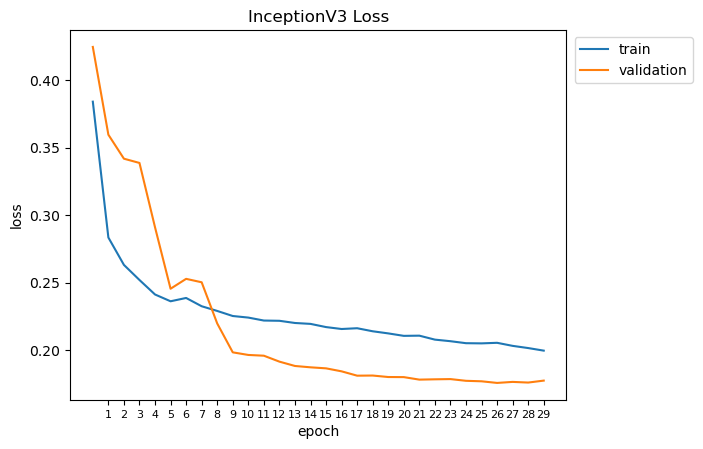

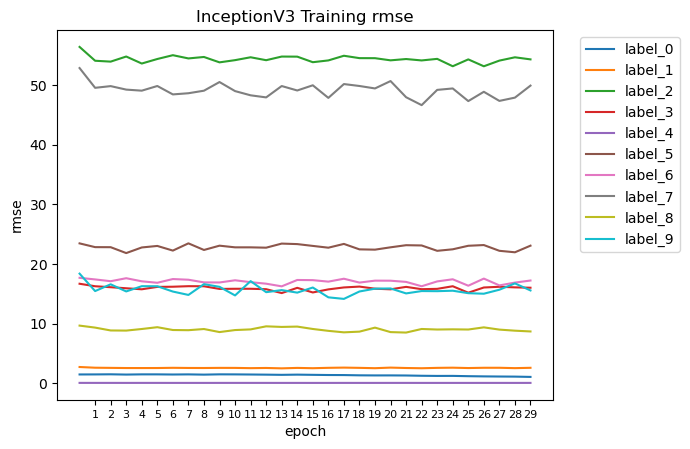

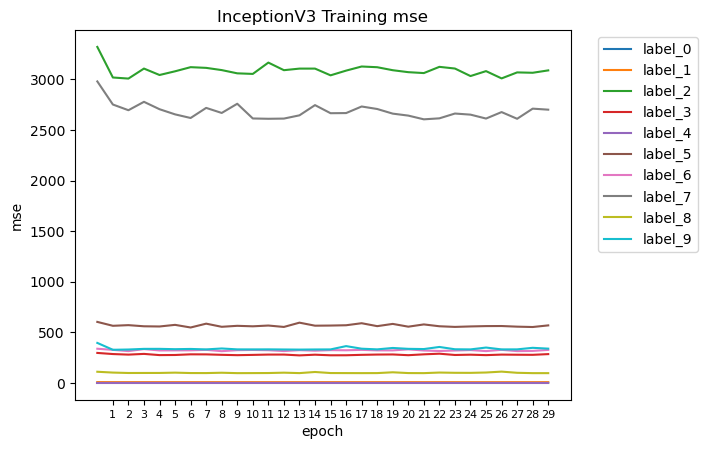

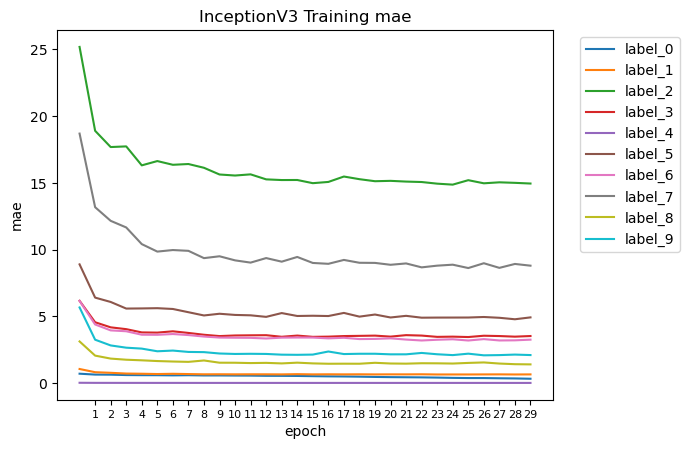

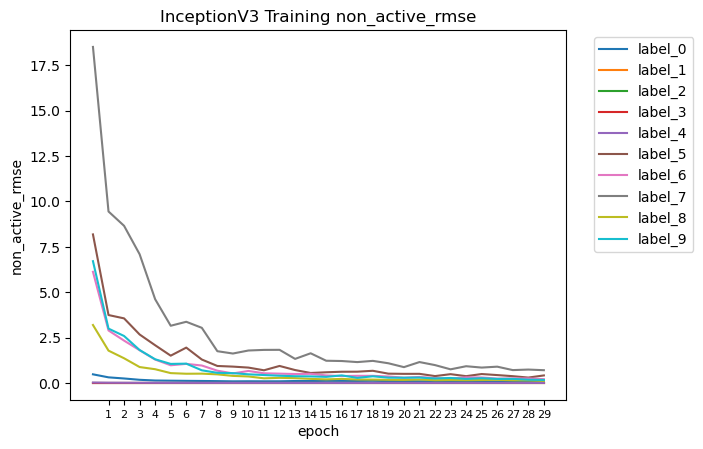

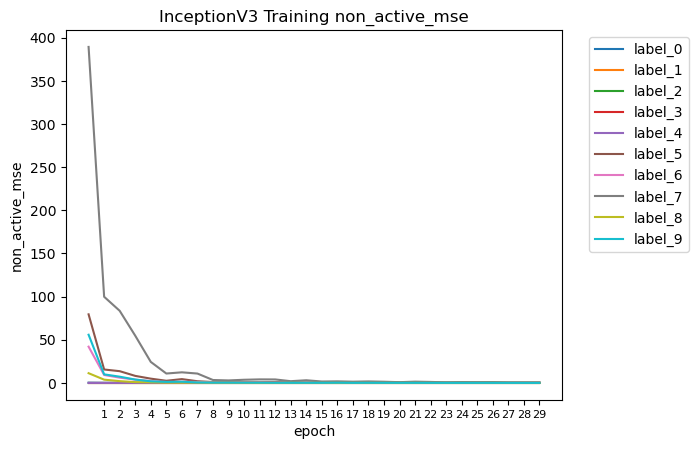

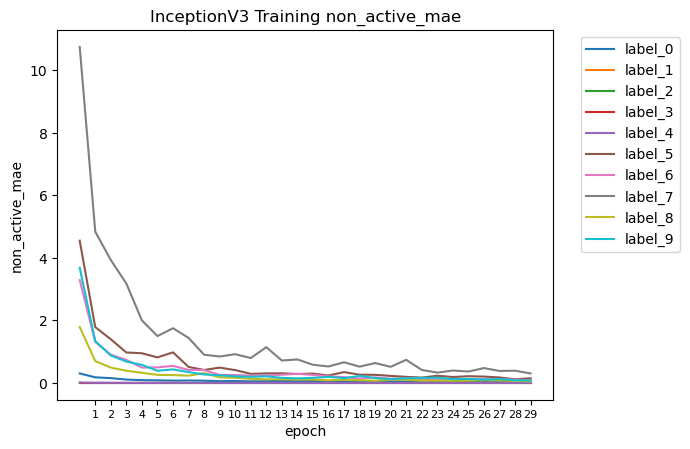

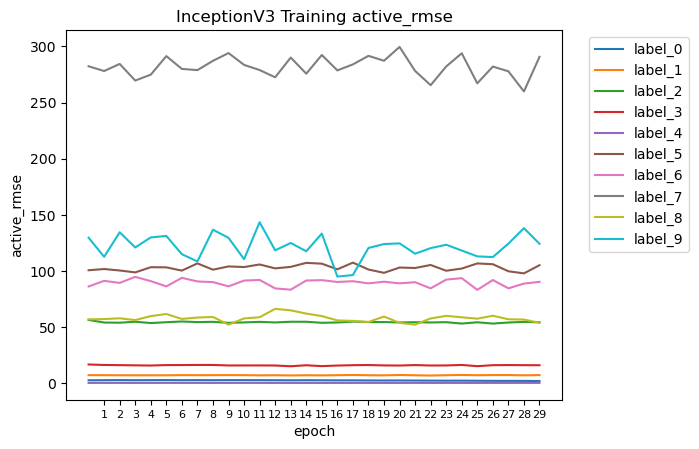

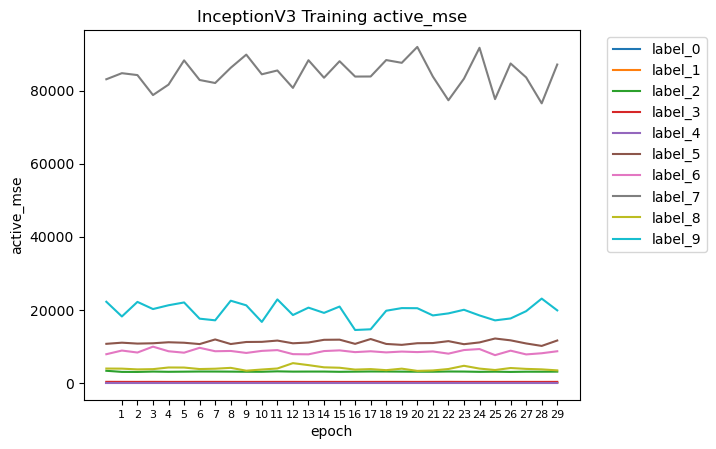

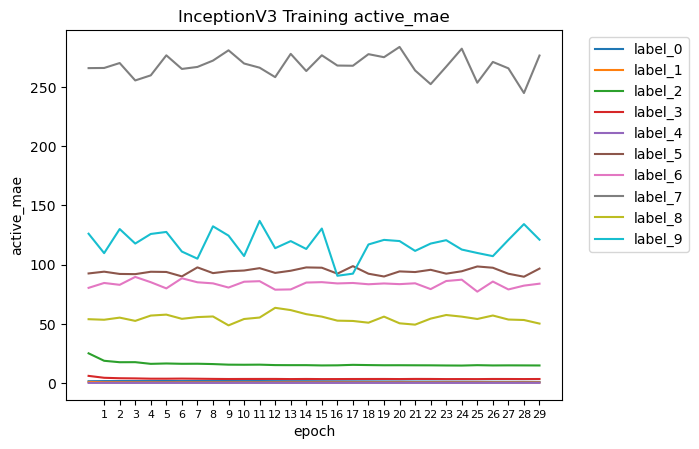

In [ ]:
plot('InceptionV3', history, num_of_preds, data = '', num_of_batches = len(train_ds))

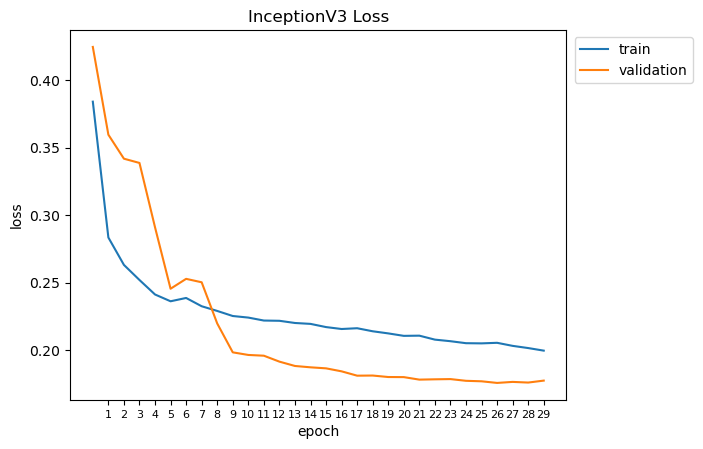

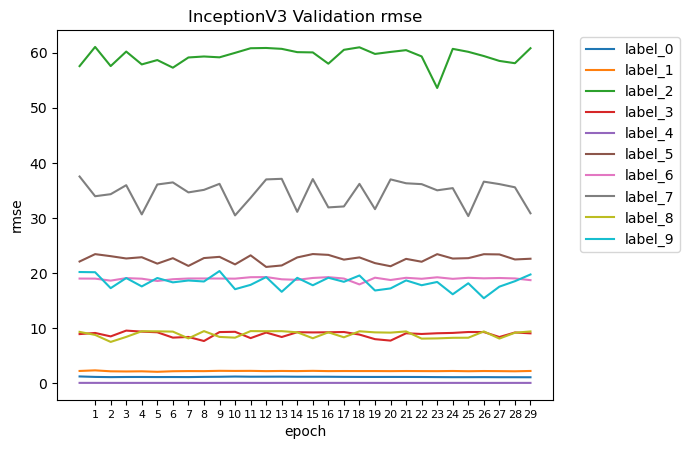

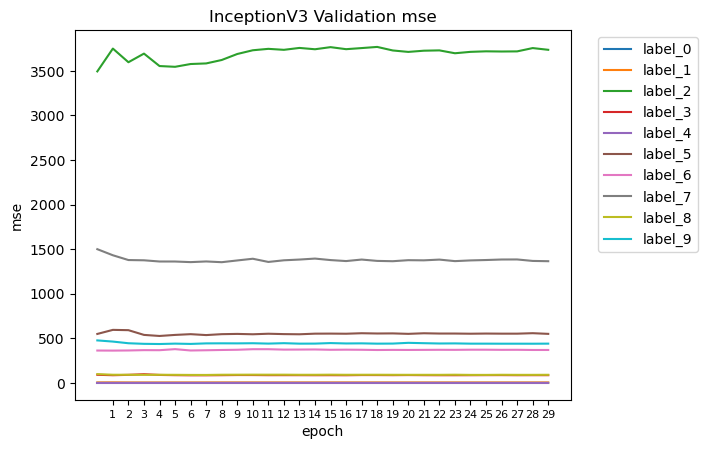

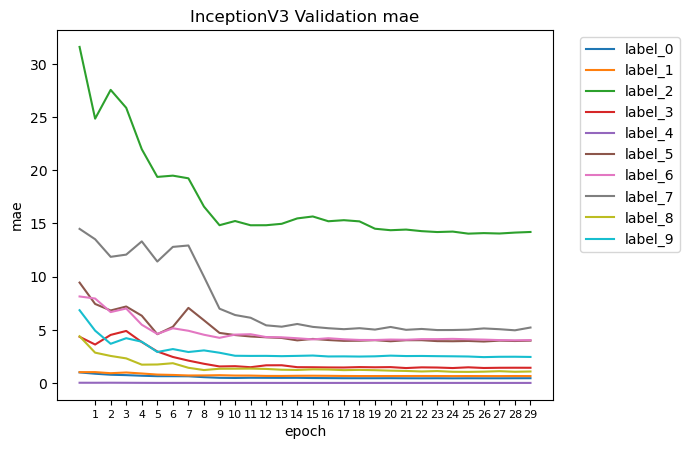

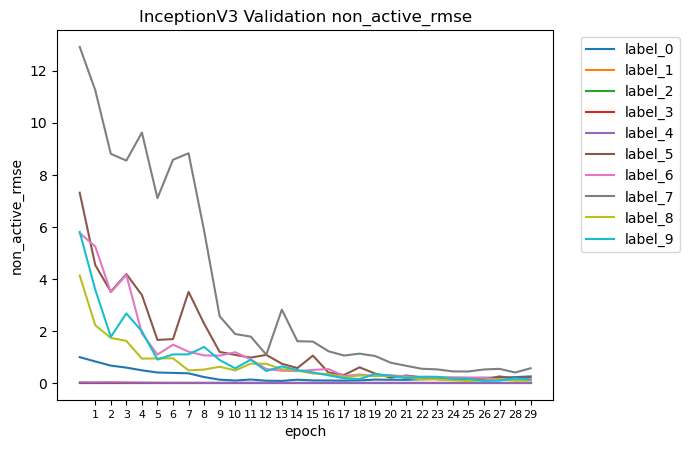

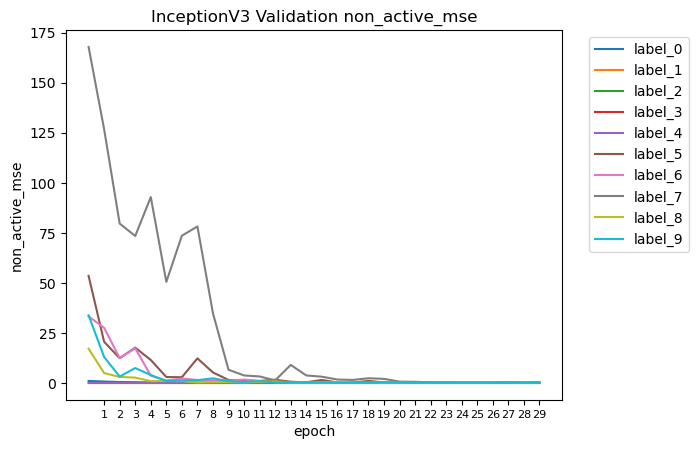

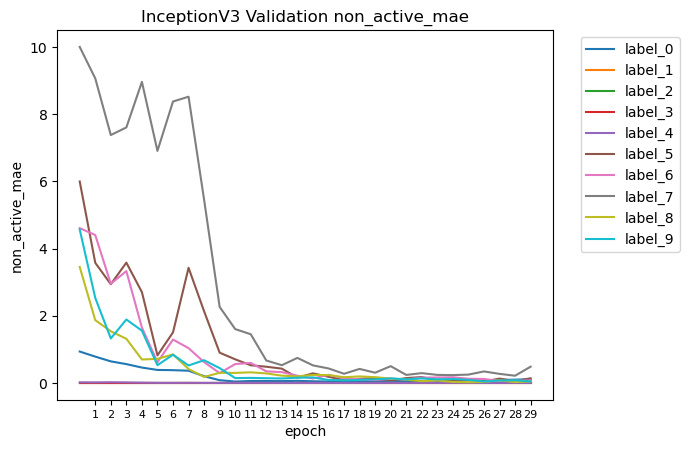

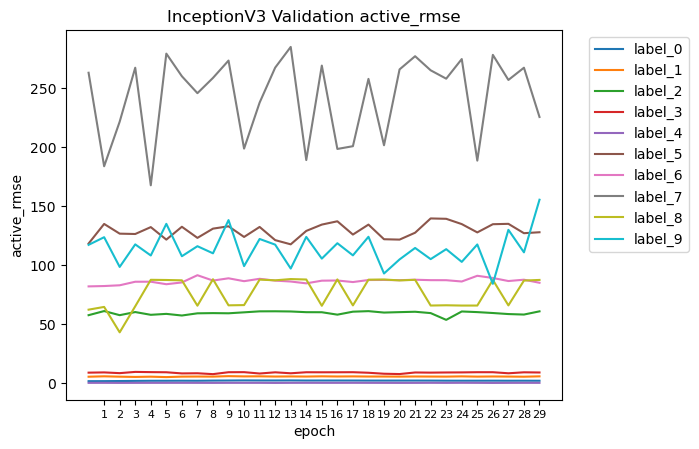

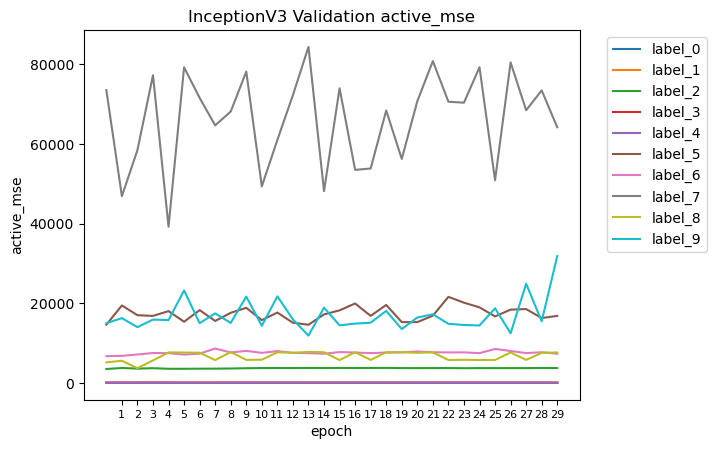

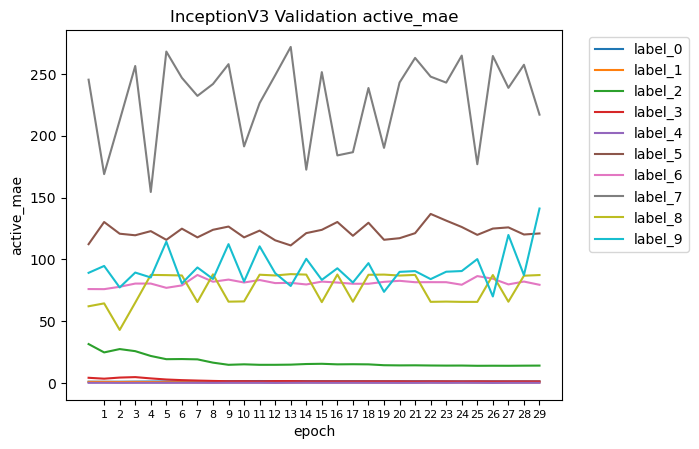

In [ ]:
plot('InceptionV3', history, num_of_preds, data = 'val_', num_of_batches = len(val_ds))

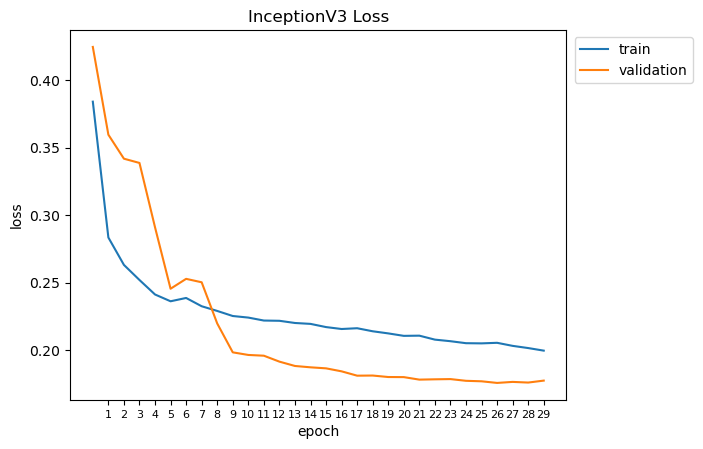

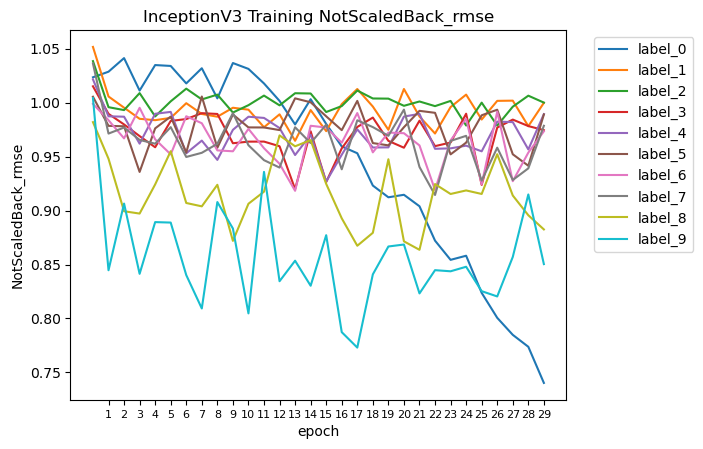

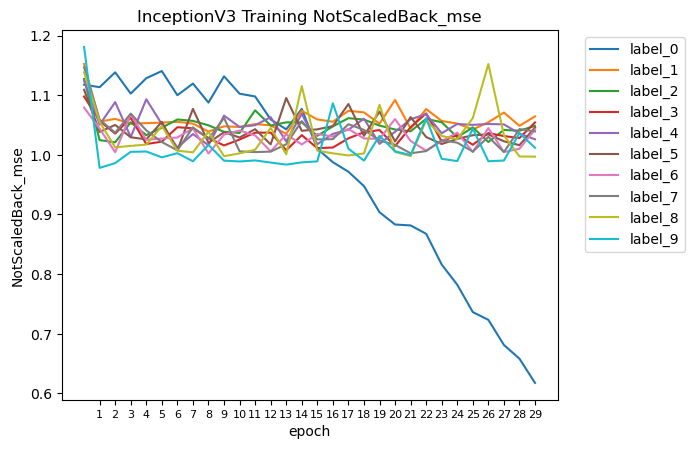

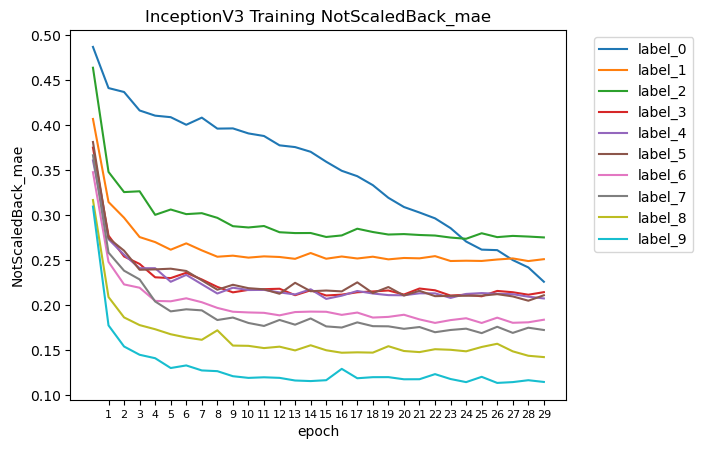

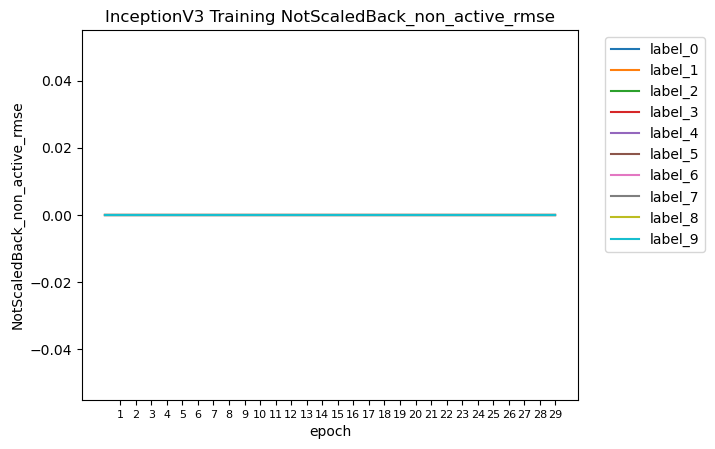

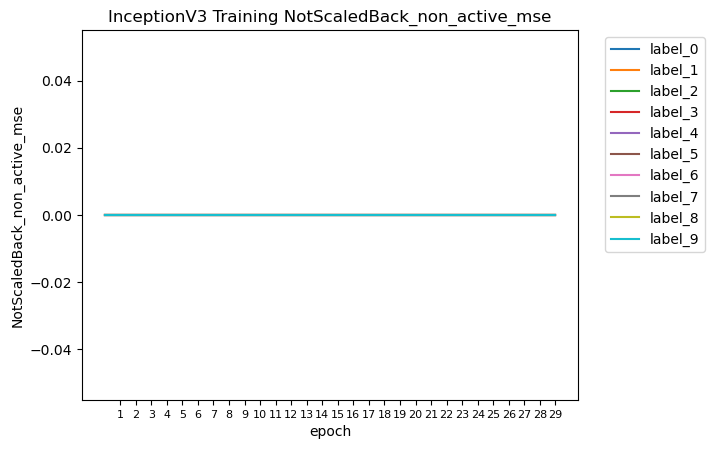

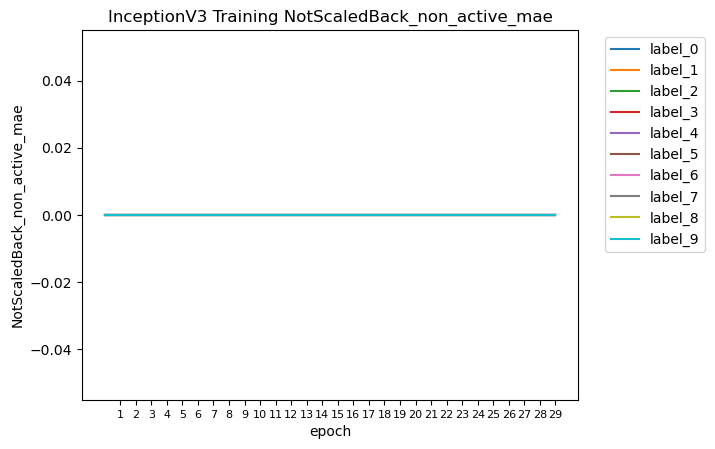

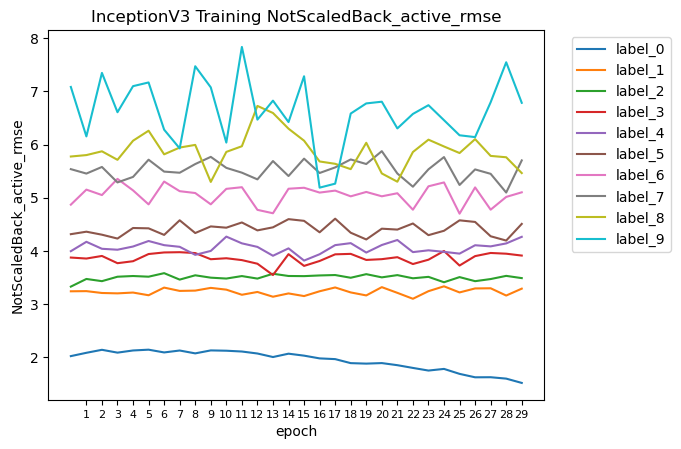

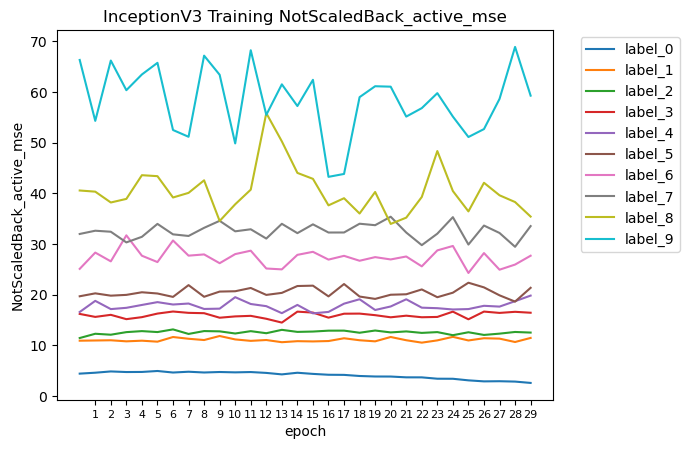

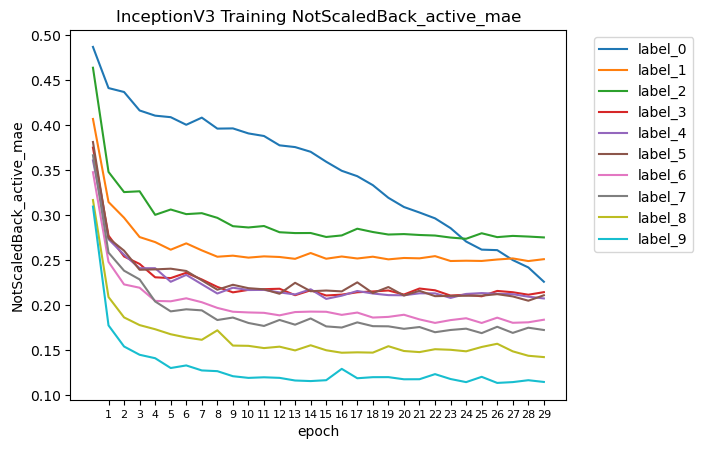

In [ ]:
plot('InceptionV3', history, num_of_preds, data = '', num_of_batches = len(train_ds), NotScaledBack = True)

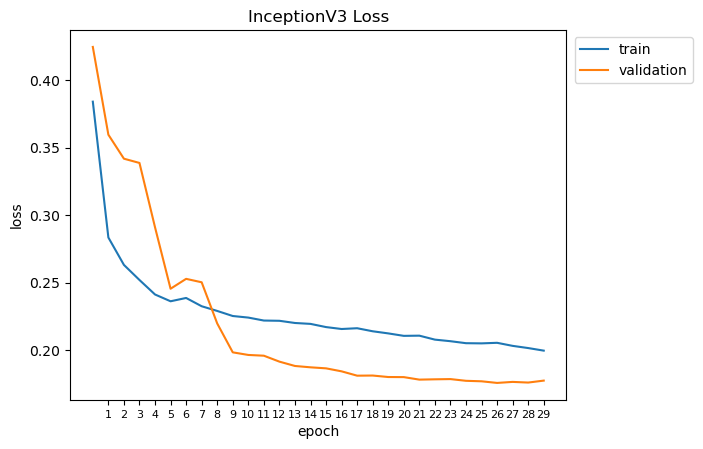

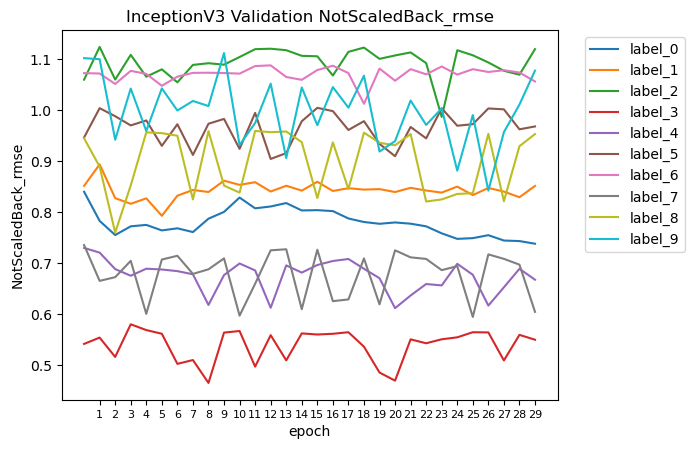

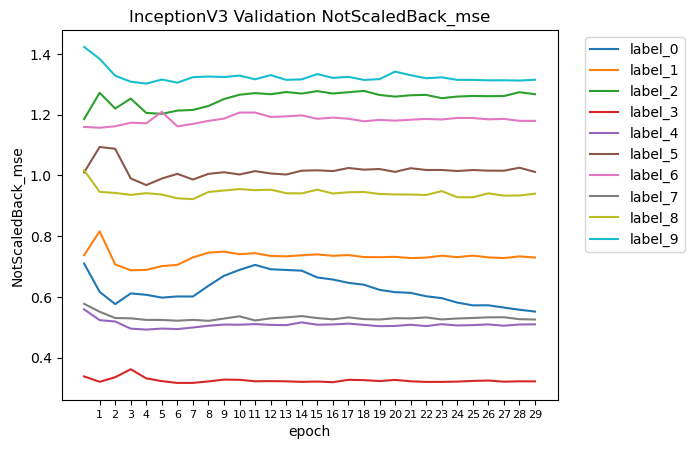

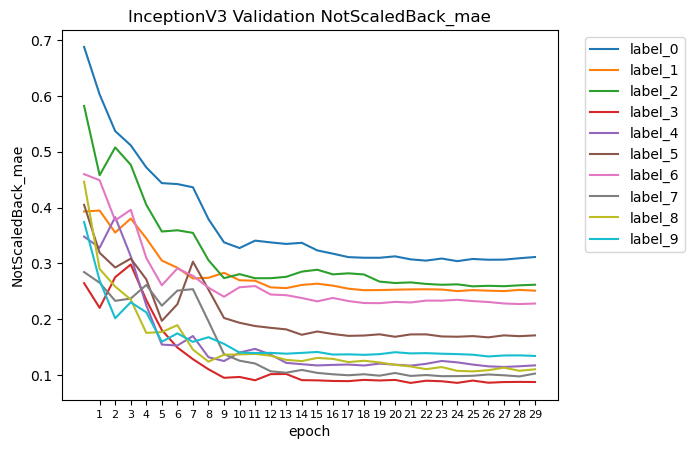

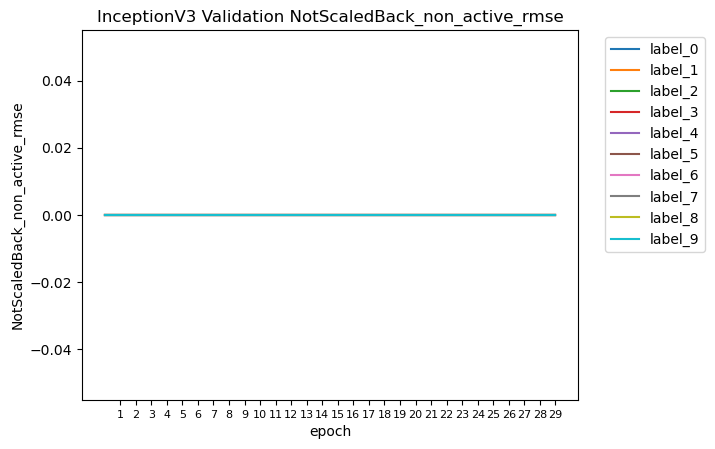

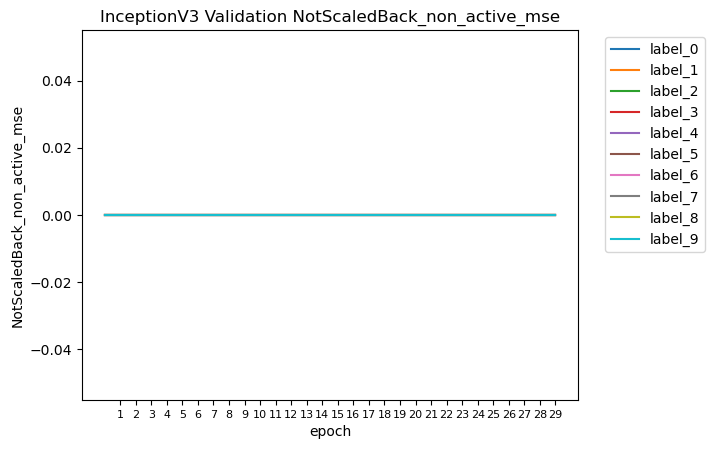

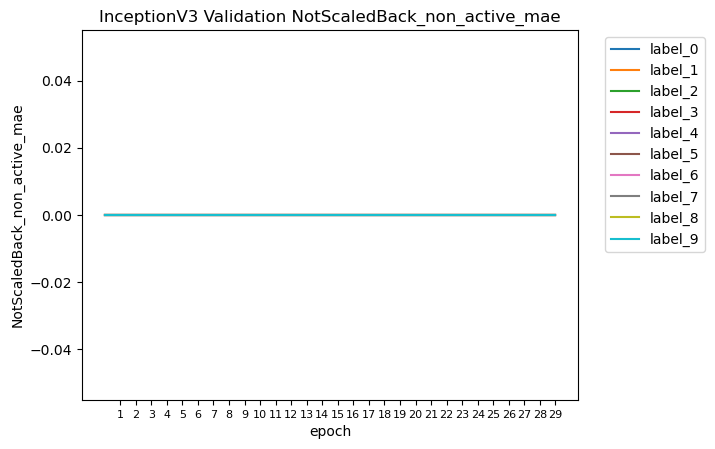

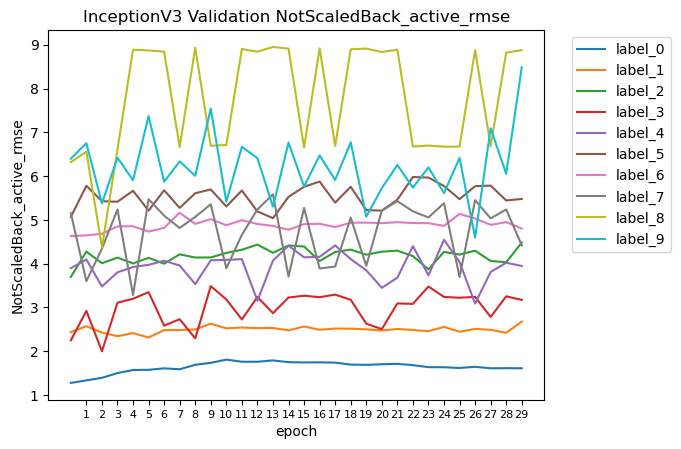

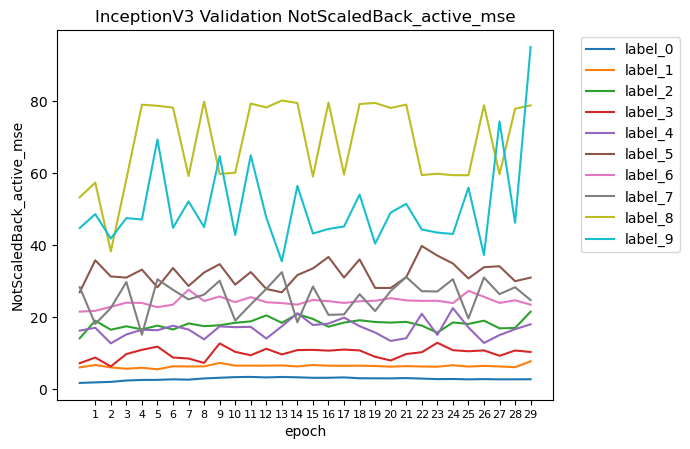

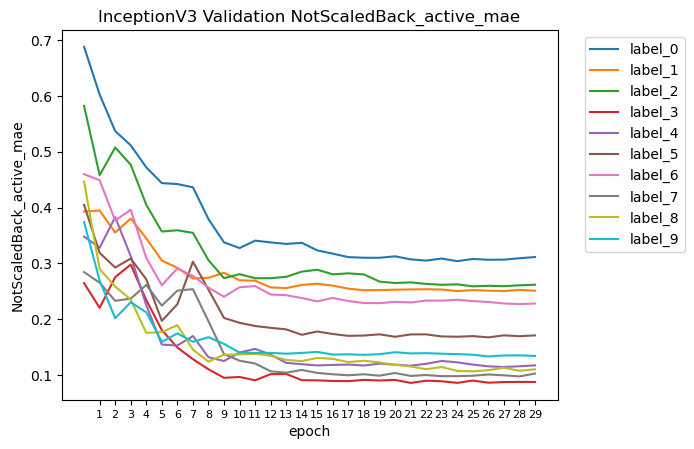

In [ ]:
plot('InceptionV3', history, num_of_preds, data = 'val_', num_of_batches = len(val_ds), NotScaledBack = True)

In [ ]:
history.history

{'loss': [0.3840101659297943,
  0.2834252715110779,
  0.26314547657966614,
  0.25197863578796387,
  0.24124424159526825,
  0.2362125664949417,
  0.23867003619670868,
  0.23253825306892395,
  0.2290612906217575,
  0.22530728578567505,
  0.22414347529411316,
  0.2219497710466385,
  0.22176752984523773,
  0.2201409786939621,
  0.21947523951530457,
  0.21710820496082306,
  0.2156880795955658,
  0.216258704662323,
  0.21400286257266998,
  0.21243329346179962,
  0.2106121927499771,
  0.21075662970542908,
  0.2078205794095993,
  0.20665478706359863,
  0.2051808089017868,
  0.20504848659038544,
  0.20546546578407288,
  0.20320358872413635,
  0.2015787810087204,
  0.19967103004455566],
 'rmse_0': [32.60466384887695,
  32.7699089050293,
  33.17162322998047,
  32.212501525878906,
  32.9659423828125,
  32.939693450927734,
  32.42433547973633,
  32.87214660644531,
  31.98211097717285,
  33.02569580078125,
  32.85260772705078,
  32.422515869140625,
  31.90731430053711,
  31.212982177734375,
  31.956

**MSE**

In [ ]:
# cosine decay learning rate
lr_decayed_fn = tf.keras.experimental.CosineDecay(initial_learning_rate=0.0001, decay_steps=1000)
optimizer_adam_cos_decay = tf.keras.optimizers.Adam(learning_rate=lr_decayed_fn)

tf.keras.backend.clear_session()
    
model3 = tf.keras.models.Sequential([
            InceptionV3(input_shape = input_shape, include_top=False, weights='imagenet',  pooling = "avg"),
            tf.keras.layers.Dense(num_of_preds)
        ])    

model3.compile(
            loss = tf.keras.losses.MeanSquaredError(tf.keras.losses.Reduction.SUM_OVER_BATCH_SIZE), #mean mse per sample
            optimizer = optimizer_adam_cos_decay,
            metrics = [[self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all',name = 'rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', name = 'mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', name = 'mae_' + str(i)) for i in range(10)],                
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_mae_' + str(i)) for i in range(10)],
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_mae_' + str(i)) for i in range(10)], 
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False,name = 'NotScaledBack_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False, name = 'NotScaledBack_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False, name = 'NotScaledBack_mae_' + str(i)) for i in range(10)],                
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_mae_' + str(i)) for i in range(10)],
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_mae_' + str(i)) for i in range(10)]], 
            run_eagerly=True)

start_time = time.time()
history3 = model3.fit(train_ds, validation_data = val_ds, epochs=EPOCHS)
end_time = time.time()
print('Time takes to train:'.format(EPOCHS), end_time - start_time)

Epoch 1/30
22/22 [==============================] - 62s 3s/step - loss: 1.0908 - rmse_0: 31.6574 - rmse_1: 57.3003 - rmse_2: 1197.2657 - rmse_3: 359.2288 - rmse_4: 1.5469 - rmse_5: 525.1763 - rmse_6: 387.2206 - rmse_7: 1091.1876 - rmse_8: 208.8504 - rmse_9: 367.1626 - mse_0: 48.5302 - mse_1: 157.3680 - mse_2: 69825.8906 - mse_3: 6433.7988 - mse_4: 0.1180 - mse_5: 13211.4619 - mse_6: 7458.9717 - mse_7: 61615.3164 - mse_8: 2317.8320 - mse_9: 7924.4014 - mae_0: 18.0776 - mae_1: 27.0252 - mae_2: 637.9972 - mae_3: 160.5700 - mae_4: 0.8010 - mae_5: 258.4651 - mae_6: 177.5429 - mae_7: 404.1841 - mae_8: 79.0002 - mae_9: 124.4244 - non_active_rmse_0: 14.8591 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.6824 - non_active_rmse_5: 213.5608 - non_active_rmse_6: 161.3295 - non_active_rmse_7: 345.9287 - non_active_rmse_8: 73.0399 - non_active_rmse_9: 121.0496 - non_active_mse_0: 10.0973 - non_active_mse_1: 0.0000e+00 - non_acti

Epoch 2/30
22/22 [==============================] - 63s 3s/step - loss: 0.9844 - rmse_0: 30.5558 - rmse_1: 55.1154 - rmse_2: 1148.0436 - rmse_3: 333.6195 - rmse_4: 1.4883 - rmse_5: 495.0706 - rmse_6: 357.8776 - rmse_7: 1033.2373 - rmse_8: 194.3421 - rmse_9: 361.6118 - mse_0: 44.5213 - mse_1: 146.7560 - mse_2: 61788.0430 - mse_3: 5471.6611 - mse_4: 0.1063 - mse_5: 11928.8701 - mse_6: 6342.5298 - mse_7: 53903.6172 - mse_8: 2161.5056 - mse_9: 7450.4648 - mae_0: 16.9957 - mae_1: 25.8964 - mae_2: 586.9814 - mae_3: 146.9547 - mae_4: 0.6579 - mae_5: 218.1256 - mae_6: 145.0044 - mae_7: 396.5213 - mae_8: 73.8043 - mae_9: 115.0184 - non_active_rmse_0: 14.2501 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.5321 - non_active_rmse_5: 166.8066 - non_active_rmse_6: 128.1473 - non_active_rmse_7: 319.9231 - non_active_rmse_8: 62.6631 - non_active_rmse_9: 126.0066 - non_active_mse_0: 9.3950 - non_active_mse_1: 0.0000e+00 - non_activ

Epoch 3/30
22/22 [==============================] - 63s 3s/step - loss: 0.8754 - rmse_0: 29.8856 - rmse_1: 51.5232 - rmse_2: 1106.3658 - rmse_3: 298.5808 - rmse_4: 1.4211 - rmse_5: 490.4210 - rmse_6: 328.4641 - rmse_7: 1000.0706 - rmse_8: 196.2652 - rmse_9: 340.3474 - mse_0: 41.9780 - mse_1: 127.8336 - mse_2: 57092.1836 - mse_3: 4395.9204 - mse_4: 0.0998 - mse_5: 11639.9668 - mse_6: 5119.8760 - mse_7: 47914.2109 - mse_8: 2055.0591 - mse_9: 6421.3022 - mae_0: 16.8537 - mae_1: 25.6956 - mae_2: 589.7833 - mae_3: 141.4724 - mae_4: 0.6650 - mae_5: 227.1639 - mae_6: 131.5197 - mae_7: 380.9564 - mae_8: 73.2330 - mae_9: 110.7971 - non_active_rmse_0: 14.1630 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.5035 - non_active_rmse_5: 182.9674 - non_active_rmse_6: 117.2642 - non_active_rmse_7: 343.1464 - non_active_rmse_8: 63.2353 - non_active_rmse_9: 107.7759 - non_active_mse_0: 9.1997 - non_active_mse_1: 0.0000e+00 - non_activ

Epoch 4/30
22/22 [==============================] - 63s 3s/step - loss: 0.7185 - rmse_0: 26.8872 - rmse_1: 47.9195 - rmse_2: 980.9276 - rmse_3: 245.6358 - rmse_4: 1.3483 - rmse_5: 458.1418 - rmse_6: 275.5008 - rmse_7: 885.6943 - rmse_8: 191.3642 - rmse_9: 291.9209 - mse_0: 34.2059 - mse_1: 111.1451 - mse_2: 44343.2109 - mse_3: 2856.7742 - mse_4: 0.0888 - mse_5: 10414.3057 - mse_6: 3766.8892 - mse_7: 38924.2930 - mse_8: 1934.5735 - mse_9: 4546.1494 - mae_0: 15.6952 - mae_1: 24.1727 - mae_2: 515.9312 - mae_3: 124.0188 - mae_4: 0.6243 - mae_5: 218.7340 - mae_6: 125.0565 - mae_7: 388.3715 - mae_8: 80.3607 - mae_9: 121.5967 - non_active_rmse_0: 13.7841 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.5566 - non_active_rmse_5: 185.8856 - non_active_rmse_6: 126.2084 - non_active_rmse_7: 392.1018 - non_active_rmse_8: 76.8872 - non_active_rmse_9: 147.4404 - non_active_mse_0: 8.7019 - non_active_mse_1: 0.0000e+00 - non_active_

Epoch 5/30
22/22 [==============================] - 64s 3s/step - loss: 0.5580 - rmse_0: 24.0773 - rmse_1: 42.9266 - rmse_2: 837.2537 - rmse_3: 212.1688 - rmse_4: 1.2564 - rmse_5: 421.1218 - rmse_6: 236.9120 - rmse_7: 743.0892 - rmse_8: 174.9914 - rmse_9: 228.1901 - mse_0: 27.2626 - mse_1: 88.5409 - mse_2: 33229.6445 - mse_3: 2131.2615 - mse_4: 0.0766 - mse_5: 8829.0312 - mse_6: 2648.8289 - mse_7: 28164.7812 - mse_8: 1670.5835 - mse_9: 2766.3625 - mae_0: 14.4606 - mae_1: 22.3735 - mae_2: 457.2462 - mae_3: 111.6147 - mae_4: 0.6222 - mae_5: 202.1211 - mae_6: 116.5417 - mae_7: 350.7897 - mae_8: 72.1544 - mae_9: 117.2122 - non_active_rmse_0: 13.4179 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.6156 - non_active_rmse_5: 186.3113 - non_active_rmse_6: 124.7694 - non_active_rmse_7: 360.6767 - non_active_rmse_8: 68.3918 - non_active_rmse_9: 144.7417 - non_active_mse_0: 8.3763 - non_active_mse_1: 0.0000e+00 - non_active_ms

Epoch 6/30
22/22 [==============================] - 63s 3s/step - loss: 0.4367 - rmse_0: 21.4742 - rmse_1: 38.8524 - rmse_2: 737.1892 - rmse_3: 186.8662 - rmse_4: 1.1103 - rmse_5: 383.4546 - rmse_6: 196.9439 - rmse_7: 668.8892 - rmse_8: 159.2949 - rmse_9: 198.6158 - mse_0: 21.8504 - mse_1: 71.8012 - mse_2: 25511.0117 - mse_3: 1638.0751 - mse_4: 0.0590 - mse_5: 7152.6538 - mse_6: 1829.9177 - mse_7: 22074.8887 - mse_8: 1318.0527 - mse_9: 2047.7643 - mae_0: 13.0516 - mae_1: 20.8432 - mae_2: 415.2610 - mae_3: 105.1108 - mae_4: 0.5566 - mae_5: 184.3431 - mae_6: 107.2432 - mae_7: 340.8178 - mae_8: 67.3030 - mae_9: 103.2171 - non_active_rmse_0: 12.2079 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.5713 - non_active_rmse_5: 173.6392 - non_active_rmse_6: 124.6470 - non_active_rmse_7: 369.6784 - non_active_rmse_8: 70.1098 - non_active_rmse_9: 128.7918 - non_active_mse_0: 6.9953 - non_active_mse_1: 0.0000e+00 - non_active_ms

Epoch 7/30
22/22 [==============================] - 64s 3s/step - loss: 0.3302 - rmse_0: 17.8609 - rmse_1: 32.7910 - rmse_2: 667.0164 - rmse_3: 168.9469 - rmse_4: 0.9262 - rmse_5: 342.1895 - rmse_6: 182.5080 - rmse_7: 637.3591 - rmse_8: 132.0171 - rmse_9: 178.1571 - mse_0: 14.7091 - mse_1: 51.5955 - mse_2: 20910.3203 - mse_3: 1334.4612 - mse_4: 0.0417 - mse_5: 5697.5024 - mse_6: 1578.2629 - mse_7: 20219.1270 - mse_8: 934.0204 - mse_9: 1572.8951 - mae_0: 11.3094 - mae_1: 18.5281 - mae_2: 383.8628 - mae_3: 97.9861 - mae_4: 0.4968 - mae_5: 176.9867 - mae_6: 105.3693 - mae_7: 331.0335 - mae_8: 63.7799 - mae_9: 98.2979 - non_active_rmse_0: 10.8868 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.5563 - non_active_rmse_5: 181.3480 - non_active_rmse_6: 119.0937 - non_active_rmse_7: 351.2248 - non_active_rmse_8: 72.0488 - non_active_rmse_9: 124.1324 - non_active_mse_0: 5.4646 - non_active_mse_1: 0.0000e+00 - non_active_mse_2

Epoch 8/30
22/22 [==============================] - 65s 3s/step - loss: 0.2505 - rmse_0: 15.7294 - rmse_1: 28.8908 - rmse_2: 577.8022 - rmse_3: 158.4902 - rmse_4: 0.7874 - rmse_5: 298.0001 - rmse_6: 154.9447 - rmse_7: 502.0983 - rmse_8: 123.8480 - rmse_9: 156.3451 - mse_0: 11.5097 - mse_1: 40.0908 - mse_2: 15865.4434 - mse_3: 1192.8525 - mse_4: 0.0297 - mse_5: 4315.0054 - mse_6: 1123.6672 - mse_7: 12008.1875 - mse_8: 769.9257 - mse_9: 1216.7795 - mae_0: 10.2625 - mae_1: 16.9501 - mae_2: 334.8429 - mae_3: 94.0026 - mae_4: 0.4477 - mae_5: 163.6615 - mae_6: 94.6936 - mae_7: 294.0432 - mae_8: 60.0373 - mae_9: 91.0184 - non_active_rmse_0: 10.1256 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.5117 - non_active_rmse_5: 178.3282 - non_active_rmse_6: 109.2815 - non_active_rmse_7: 356.3742 - non_active_rmse_8: 73.0783 - non_active_rmse_9: 116.6428 - non_active_mse_0: 4.7270 - non_active_mse_1: 0.0000e+00 - non_active_mse_2:

Epoch 9/30
22/22 [==============================] - 64s 3s/step - loss: 0.1988 - rmse_0: 15.6360 - rmse_1: 24.5196 - rmse_2: 525.5722 - rmse_3: 154.6371 - rmse_4: 0.6931 - rmse_5: 246.3578 - rmse_6: 144.0325 - rmse_7: 456.8412 - rmse_8: 100.2803 - rmse_9: 145.9167 - mse_0: 11.2510 - mse_1: 28.2366 - mse_2: 13128.0283 - mse_3: 1143.9165 - mse_4: 0.0231 - mse_5: 2949.4165 - mse_6: 975.6540 - mse_7: 10103.6602 - mse_8: 502.8734 - mse_9: 1001.9902 - mae_0: 9.8008 - mae_1: 14.9988 - mae_2: 315.4508 - mae_3: 87.3823 - mae_4: 0.4038 - mae_5: 142.3943 - mae_6: 84.2884 - mae_7: 267.8805 - mae_8: 53.9442 - mae_9: 86.2682 - non_active_rmse_0: 9.6503 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.4623 - non_active_rmse_5: 161.5126 - non_active_rmse_6: 93.5007 - non_active_rmse_7: 317.6884 - non_active_rmse_8: 64.8844 - non_active_rmse_9: 117.6639 - non_active_mse_0: 4.4751 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0

Epoch 10/30
22/22 [==============================] - 64s 3s/step - loss: 0.1578 - rmse_0: 13.7367 - rmse_1: 22.2536 - rmse_2: 492.9012 - rmse_3: 132.8856 - rmse_4: 0.6593 - rmse_5: 215.1566 - rmse_6: 131.1371 - rmse_7: 414.5768 - rmse_8: 89.8665 - rmse_9: 121.0755 - mse_0: 8.8086 - mse_1: 23.4645 - mse_2: 11260.5654 - mse_3: 835.4566 - mse_4: 0.0206 - mse_5: 2166.4143 - mse_6: 817.2459 - mse_7: 8254.0459 - mse_8: 387.9876 - mse_9: 699.5205 - mae_0: 8.9704 - mae_1: 13.8004 - mae_2: 286.5935 - mae_3: 78.8267 - mae_4: 0.3732 - mae_5: 130.3346 - mae_6: 78.8585 - mae_7: 243.5018 - mae_8: 50.2483 - mae_9: 76.5548 - non_active_rmse_0: 9.0002 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.4272 - non_active_rmse_5: 147.4602 - non_active_rmse_6: 94.7462 - non_active_rmse_7: 294.5218 - non_active_rmse_8: 63.0378 - non_active_rmse_9: 100.8690 - non_active_mse_0: 3.7624 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e

Epoch 11/30
22/22 [==============================] - 64s 3s/step - loss: 0.1375 - rmse_0: 12.5773 - rmse_1: 21.1438 - rmse_2: 475.7555 - rmse_3: 123.1013 - rmse_4: 0.5787 - rmse_5: 194.4079 - rmse_6: 126.3249 - rmse_7: 375.0912 - rmse_8: 78.3597 - rmse_9: 136.6602 - mse_0: 7.3095 - mse_1: 21.1619 - mse_2: 10660.6152 - mse_3: 716.4525 - mse_4: 0.0158 - mse_5: 1756.9709 - mse_6: 784.9523 - mse_7: 6788.5420 - mse_8: 297.3548 - mse_9: 943.3386 - mae_0: 8.2049 - mae_1: 13.4471 - mae_2: 281.3054 - mae_3: 75.1555 - mae_4: 0.3430 - mae_5: 123.9662 - mae_6: 79.6527 - mae_7: 227.7337 - mae_8: 45.8550 - mae_9: 78.9701 - non_active_rmse_0: 8.3438 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.4050 - non_active_rmse_5: 146.4060 - non_active_rmse_6: 92.7817 - non_active_rmse_7: 273.0486 - non_active_rmse_8: 55.5535 - non_active_rmse_9: 102.0131 - non_active_mse_0: 3.2578 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e

Epoch 12/30
22/22 [==============================] - 62s 3s/step - loss: 0.1160 - rmse_0: 11.9115 - rmse_1: 19.6836 - rmse_2: 438.0131 - rmse_3: 110.6875 - rmse_4: 0.5662 - rmse_5: 176.3316 - rmse_6: 109.4432 - rmse_7: 355.9570 - rmse_8: 64.3617 - rmse_9: 122.6396 - mse_0: 6.7995 - mse_1: 18.2453 - mse_2: 9165.4023 - mse_3: 577.9727 - mse_4: 0.0158 - mse_5: 1460.4631 - mse_6: 561.1824 - mse_7: 6104.0249 - mse_8: 207.1783 - mse_9: 716.2607 - mae_0: 7.8225 - mae_1: 12.4326 - mae_2: 255.7165 - mae_3: 68.3144 - mae_4: 0.3318 - mae_5: 109.4239 - mae_6: 70.1309 - mae_7: 221.7582 - mae_8: 40.6756 - mae_9: 73.1565 - non_active_rmse_0: 7.7451 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.3756 - non_active_rmse_5: 128.9373 - non_active_rmse_6: 84.6202 - non_active_rmse_7: 269.6450 - non_active_rmse_8: 51.7742 - non_active_rmse_9: 94.8508 - non_active_mse_0: 2.8207 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+0

Epoch 13/30
22/22 [==============================] - 62s 3s/step - loss: 0.1024 - rmse_0: 10.6370 - rmse_1: 17.5155 - rmse_2: 396.5056 - rmse_3: 105.9399 - rmse_4: 0.4797 - rmse_5: 165.9709 - rmse_6: 102.4612 - rmse_7: 343.6975 - rmse_8: 69.5245 - rmse_9: 126.3974 - mse_0: 5.2364 - mse_1: 14.3439 - mse_2: 7522.9531 - mse_3: 539.3872 - mse_4: 0.0109 - mse_5: 1331.7095 - mse_6: 500.2340 - mse_7: 5802.1821 - mse_8: 242.0466 - mse_9: 804.8488 - mae_0: 7.1390 - mae_1: 11.3659 - mae_2: 241.9711 - mae_3: 66.4683 - mae_4: 0.2990 - mae_5: 106.2377 - mae_6: 67.3331 - mae_7: 209.1592 - mae_8: 41.8369 - mae_9: 72.0852 - non_active_rmse_0: 7.3889 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.3511 - non_active_rmse_5: 127.9662 - non_active_rmse_6: 78.3393 - non_active_rmse_7: 246.4376 - non_active_rmse_8: 54.2828 - non_active_rmse_9: 93.0047 - non_active_mse_0: 2.5826 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+0

Epoch 14/30
22/22 [==============================] - 63s 3s/step - loss: 0.0936 - rmse_0: 10.5002 - rmse_1: 16.1615 - rmse_2: 389.0470 - rmse_3: 95.9673 - rmse_4: 0.4541 - rmse_5: 163.1880 - rmse_6: 110.3795 - rmse_7: 304.2389 - rmse_8: 66.8996 - rmse_9: 114.1120 - mse_0: 5.1318 - mse_1: 12.0966 - mse_2: 7155.0493 - mse_3: 428.7500 - mse_4: 0.0097 - mse_5: 1271.3503 - mse_6: 625.1257 - mse_7: 4530.4775 - mse_8: 232.6263 - mse_9: 661.2928 - mae_0: 7.0264 - mae_1: 10.4797 - mae_2: 231.8159 - mae_3: 61.4095 - mae_4: 0.2772 - mae_5: 102.4447 - mae_6: 70.5936 - mae_7: 194.2247 - mae_8: 41.0730 - mae_9: 66.3206 - non_active_rmse_0: 7.4254 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.3240 - non_active_rmse_5: 120.5453 - non_active_rmse_6: 81.1651 - non_active_rmse_7: 237.4335 - non_active_rmse_8: 51.5093 - non_active_rmse_9: 84.1263 - non_active_mse_0: 2.5868 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00

Epoch 15/30
22/22 [==============================] - 64s 3s/step - loss: 0.0911 - rmse_0: 9.8909 - rmse_1: 15.6065 - rmse_2: 353.8028 - rmse_3: 96.4839 - rmse_4: 0.4591 - rmse_5: 153.2039 - rmse_6: 100.0847 - rmse_7: 294.8795 - rmse_8: 67.8978 - rmse_9: 111.2736 - mse_0: 4.5574 - mse_1: 11.4674 - mse_2: 5884.2539 - mse_3: 448.2589 - mse_4: 0.0100 - mse_5: 1097.9501 - mse_6: 475.3356 - mse_7: 4108.9683 - mse_8: 331.7215 - mse_9: 673.6476 - mae_0: 6.7159 - mae_1: 10.0994 - mae_2: 215.5665 - mae_3: 61.8650 - mae_4: 0.2791 - mae_5: 97.4584 - mae_6: 63.0145 - mae_7: 187.3610 - mae_8: 38.1141 - mae_9: 64.8561 - non_active_rmse_0: 6.9630 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.3260 - non_active_rmse_5: 121.7329 - non_active_rmse_6: 74.5283 - non_active_rmse_7: 224.4128 - non_active_rmse_8: 47.0650 - non_active_rmse_9: 81.5203 - non_active_mse_0: 2.3001 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00 -

Epoch 16/30
22/22 [==============================] - 65s 3s/step - loss: 0.0750 - rmse_0: 9.4279 - rmse_1: 15.5240 - rmse_2: 360.7568 - rmse_3: 97.0365 - rmse_4: 0.4161 - rmse_5: 140.4496 - rmse_6: 91.8465 - rmse_7: 299.7171 - rmse_8: 52.3829 - rmse_9: 95.0918 - mse_0: 4.1454 - mse_1: 11.5529 - mse_2: 6200.9170 - mse_3: 443.5682 - mse_4: 0.0082 - mse_5: 927.5027 - mse_6: 409.2692 - mse_7: 4312.3521 - mse_8: 135.3402 - mse_9: 450.3927 - mae_0: 6.2722 - mae_1: 9.9216 - mae_2: 213.9588 - mae_3: 60.8304 - mae_4: 0.2579 - mae_5: 92.1466 - mae_6: 60.2122 - mae_7: 182.6967 - mae_8: 33.5865 - mae_9: 61.3408 - non_active_rmse_0: 6.3044 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.3009 - non_active_rmse_5: 111.2134 - non_active_rmse_6: 71.4185 - non_active_rmse_7: 217.0188 - non_active_rmse_8: 42.4899 - non_active_rmse_9: 79.4560 - non_active_mse_0: 1.8451 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00 - non

Epoch 17/30
22/22 [==============================] - 64s 3s/step - loss: 0.0682 - rmse_0: 8.8528 - rmse_1: 14.6762 - rmse_2: 332.1380 - rmse_3: 84.4183 - rmse_4: 0.4035 - rmse_5: 141.3432 - rmse_6: 88.6382 - rmse_7: 269.2495 - rmse_8: 49.9486 - rmse_9: 102.7504 - mse_0: 3.6202 - mse_1: 10.2941 - mse_2: 5258.6265 - mse_3: 341.8011 - mse_4: 0.0077 - mse_5: 937.4693 - mse_6: 376.4814 - mse_7: 3546.6797 - mse_8: 116.8539 - mse_9: 582.6532 - mae_0: 5.9985 - mae_1: 9.4131 - mae_2: 205.0510 - mae_3: 54.3900 - mae_4: 0.2518 - mae_5: 89.8754 - mae_6: 60.8342 - mae_7: 172.8186 - mae_8: 31.2525 - mae_9: 62.0152 - non_active_rmse_0: 5.9710 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.3024 - non_active_rmse_5: 111.8577 - non_active_rmse_6: 73.8748 - non_active_rmse_7: 210.4342 - non_active_rmse_8: 39.6503 - non_active_rmse_9: 80.1734 - non_active_mse_0: 1.6623 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00 - no

Epoch 18/30
22/22 [==============================] - 64s 3s/step - loss: 0.0660 - rmse_0: 8.7372 - rmse_1: 14.5089 - rmse_2: 331.8884 - rmse_3: 83.5073 - rmse_4: 0.3798 - rmse_5: 143.4536 - rmse_6: 89.7353 - rmse_7: 267.5717 - rmse_8: 49.6131 - rmse_9: 88.5787 - mse_0: 3.6791 - mse_1: 9.9090 - mse_2: 5374.2446 - mse_3: 348.2174 - mse_4: 0.0068 - mse_5: 1029.1411 - mse_6: 385.4694 - mse_7: 3550.4722 - mse_8: 118.6744 - mse_9: 370.2273 - mae_0: 6.0561 - mae_1: 9.3642 - mae_2: 193.7673 - mae_3: 53.5861 - mae_4: 0.2440 - mae_5: 87.1234 - mae_6: 58.4176 - mae_7: 172.6166 - mae_8: 31.5500 - mae_9: 57.4450 - non_active_rmse_0: 6.0808 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.2911 - non_active_rmse_5: 102.0920 - non_active_rmse_6: 69.7124 - non_active_rmse_7: 205.7480 - non_active_rmse_8: 39.8234 - non_active_rmse_9: 74.7899 - non_active_mse_0: 1.7181 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00 - non

Epoch 19/30
22/22 [==============================] - 64s 3s/step - loss: 0.0624 - rmse_0: 8.3400 - rmse_1: 14.7022 - rmse_2: 331.1920 - rmse_3: 77.1248 - rmse_4: 0.3726 - rmse_5: 127.6524 - rmse_6: 85.0598 - rmse_7: 267.5362 - rmse_8: 50.0152 - rmse_9: 93.5488 - mse_0: 3.2516 - mse_1: 10.1651 - mse_2: 5225.0049 - mse_3: 278.6830 - mse_4: 0.0065 - mse_5: 765.9642 - mse_6: 349.0859 - mse_7: 3628.9619 - mse_8: 126.3704 - mse_9: 436.5403 - mae_0: 5.6440 - mae_1: 9.5830 - mae_2: 206.2711 - mae_3: 50.2999 - mae_4: 0.2386 - mae_5: 81.1278 - mae_6: 56.4941 - mae_7: 170.3022 - mae_8: 31.5746 - mae_9: 58.0559 - non_active_rmse_0: 6.0909 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.2911 - non_active_rmse_5: 98.7922 - non_active_rmse_6: 66.7540 - non_active_rmse_7: 205.4134 - non_active_rmse_8: 39.2293 - non_active_rmse_9: 76.4510 - non_active_mse_0: 1.7499 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00 - non_

Epoch 20/30
22/22 [==============================] - 65s 3s/step - loss: 0.0589 - rmse_0: 8.5775 - rmse_1: 13.8278 - rmse_2: 311.7805 - rmse_3: 82.8128 - rmse_4: 0.3739 - rmse_5: 122.3970 - rmse_6: 75.3723 - rmse_7: 254.3018 - rmse_8: 48.1249 - rmse_9: 91.3197 - mse_0: 3.4767 - mse_1: 8.9538 - mse_2: 4598.2305 - mse_3: 331.0344 - mse_4: 0.0068 - mse_5: 697.8694 - mse_6: 263.5316 - mse_7: 3205.5122 - mse_8: 118.3936 - mse_9: 415.6753 - mae_0: 5.7842 - mae_1: 9.1887 - mae_2: 191.2335 - mae_3: 52.1065 - mae_4: 0.2367 - mae_5: 79.3298 - mae_6: 51.2530 - mae_7: 156.3258 - mae_8: 31.6007 - mae_9: 57.2904 - non_active_rmse_0: 5.9273 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.2800 - non_active_rmse_5: 95.7787 - non_active_rmse_6: 59.9012 - non_active_rmse_7: 184.6529 - non_active_rmse_8: 40.0523 - non_active_rmse_9: 75.5978 - non_active_mse_0: 1.6751 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00 - non_a

Epoch 21/30
22/22 [==============================] - 64s 3s/step - loss: 0.0545 - rmse_0: 8.3118 - rmse_1: 12.5823 - rmse_2: 316.2925 - rmse_3: 89.8042 - rmse_4: 0.3311 - rmse_5: 117.5483 - rmse_6: 83.9145 - rmse_7: 225.8360 - rmse_8: 46.0150 - rmse_9: 85.4421 - mse_0: 3.2387 - mse_1: 7.6305 - mse_2: 4709.8501 - mse_3: 418.9895 - mse_4: 0.0053 - mse_5: 651.3342 - mse_6: 348.2468 - mse_7: 2380.6404 - mse_8: 102.1517 - mse_9: 361.8429 - mae_0: 5.6718 - mae_1: 8.2127 - mae_2: 188.2302 - mae_3: 56.8741 - mae_4: 0.2163 - mae_5: 77.6187 - mae_6: 54.4571 - mae_7: 151.4126 - mae_8: 29.2645 - mae_9: 53.0645 - non_active_rmse_0: 5.7512 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.2568 - non_active_rmse_5: 92.4735 - non_active_rmse_6: 63.4745 - non_active_rmse_7: 188.5732 - non_active_rmse_8: 37.5349 - non_active_rmse_9: 67.7865 - non_active_mse_0: 1.6252 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00 - non_a

Epoch 22/30
22/22 [==============================] - 63s 3s/step - loss: 0.0521 - rmse_0: 7.6528 - rmse_1: 13.7748 - rmse_2: 265.0944 - rmse_3: 84.0985 - rmse_4: 0.3675 - rmse_5: 120.1551 - rmse_6: 74.1890 - rmse_7: 224.3523 - rmse_8: 47.8535 - rmse_9: 76.2110 - mse_0: 2.7952 - mse_1: 9.2023 - mse_2: 3346.8696 - mse_3: 341.6365 - mse_4: 0.0068 - mse_5: 676.9230 - mse_6: 266.0980 - mse_7: 2460.2168 - mse_8: 127.0299 - mse_9: 273.3982 - mae_0: 5.1365 - mae_1: 8.9707 - mae_2: 169.5017 - mae_3: 52.9352 - mae_4: 0.2155 - mae_5: 78.8101 - mae_6: 48.1045 - mae_7: 145.4149 - mae_8: 31.1360 - mae_9: 51.5161 - non_active_rmse_0: 5.0965 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.2538 - non_active_rmse_5: 99.9983 - non_active_rmse_6: 56.6532 - non_active_rmse_7: 173.4147 - non_active_rmse_8: 39.4810 - non_active_rmse_9: 66.4457 - non_active_mse_0: 1.1993 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00 - non_a

Epoch 23/30
22/22 [==============================] - 65s 3s/step - loss: 0.0471 - rmse_0: 7.3886 - rmse_1: 12.5830 - rmse_2: 282.0697 - rmse_3: 72.6902 - rmse_4: 0.3423 - rmse_5: 115.4679 - rmse_6: 69.9861 - rmse_7: 229.0862 - rmse_8: 41.7749 - rmse_9: 75.3586 - mse_0: 2.5834 - mse_1: 7.7287 - mse_2: 3933.4468 - mse_3: 251.3036 - mse_4: 0.0056 - mse_5: 657.9692 - mse_6: 229.1774 - mse_7: 2512.0786 - mse_8: 81.5605 - mse_9: 270.5736 - mae_0: 5.0516 - mae_1: 8.2112 - mae_2: 170.5496 - mae_3: 46.7952 - mae_4: 0.2155 - mae_5: 75.9601 - mae_6: 46.2650 - mae_7: 150.0086 - mae_8: 26.3666 - mae_9: 49.1194 - non_active_rmse_0: 4.9857 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.2586 - non_active_rmse_5: 92.0814 - non_active_rmse_6: 55.7730 - non_active_rmse_7: 186.7935 - non_active_rmse_8: 33.7427 - non_active_rmse_9: 65.7254 - non_active_mse_0: 1.1957 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00 - non_ac

Epoch 24/30
22/22 [==============================] - 65s 3s/step - loss: 0.0490 - rmse_0: 7.5277 - rmse_1: 12.1622 - rmse_2: 299.2483 - rmse_3: 75.3223 - rmse_4: 0.3445 - rmse_5: 102.8035 - rmse_6: 77.3038 - rmse_7: 236.5991 - rmse_8: 43.3907 - rmse_9: 83.8412 - mse_0: 2.6807 - mse_1: 6.8843 - mse_2: 4237.7910 - mse_3: 273.5714 - mse_4: 0.0058 - mse_5: 488.5221 - mse_6: 328.2247 - mse_7: 2640.0188 - mse_8: 89.9879 - mse_9: 371.2209 - mae_0: 5.1155 - mae_1: 8.1051 - mae_2: 179.2069 - mae_3: 49.0892 - mae_4: 0.2228 - mae_5: 70.0779 - mae_6: 48.3060 - mae_7: 151.3284 - mae_8: 28.5767 - mae_9: 54.5671 - non_active_rmse_0: 5.1829 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.2683 - non_active_rmse_5: 86.9804 - non_active_rmse_6: 55.1032 - non_active_rmse_7: 182.0469 - non_active_rmse_8: 37.1728 - non_active_rmse_9: 69.5184 - non_active_mse_0: 1.2604 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00 - non_ac

Epoch 25/30
22/22 [==============================] - 65s 3s/step - loss: 0.0420 - rmse_0: 7.3881 - rmse_1: 11.9513 - rmse_2: 275.8865 - rmse_3: 75.1310 - rmse_4: 0.3063 - rmse_5: 100.1543 - rmse_6: 69.7327 - rmse_7: 206.9409 - rmse_8: 40.0587 - rmse_9: 73.4550 - mse_0: 2.5679 - mse_1: 6.7372 - mse_2: 3653.2402 - mse_3: 270.6174 - mse_4: 0.0045 - mse_5: 473.7212 - mse_6: 233.0011 - mse_7: 2004.4210 - mse_8: 76.8044 - mse_9: 255.1428 - mae_0: 5.0260 - mae_1: 7.8604 - mae_2: 167.2420 - mae_3: 47.0377 - mae_4: 0.1992 - mae_5: 69.1154 - mae_6: 46.2018 - mae_7: 135.7836 - mae_8: 26.8764 - mae_9: 49.6955 - non_active_rmse_0: 5.1510 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.2429 - non_active_rmse_5: 83.6049 - non_active_rmse_6: 54.9643 - non_active_rmse_7: 167.9712 - non_active_rmse_8: 34.3199 - non_active_rmse_9: 65.1833 - non_active_mse_0: 1.2453 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00 - non_ac

Epoch 26/30
22/22 [==============================] - 62s 3s/step - loss: 0.0410 - rmse_0: 7.0525 - rmse_1: 11.6010 - rmse_2: 254.8735 - rmse_3: 66.0365 - rmse_4: 0.3068 - rmse_5: 106.9860 - rmse_6: 67.7680 - rmse_7: 220.7610 - rmse_8: 42.9313 - rmse_9: 72.0204 - mse_0: 2.3858 - mse_1: 6.3080 - mse_2: 3129.7639 - mse_3: 204.5928 - mse_4: 0.0046 - mse_5: 566.5966 - mse_6: 219.6862 - mse_7: 2447.6804 - mse_8: 90.0465 - mse_9: 249.6509 - mae_0: 4.8590 - mae_1: 7.6860 - mae_2: 156.5746 - mae_3: 44.0311 - mae_4: 0.2009 - mae_5: 68.7365 - mae_6: 44.4068 - mae_7: 145.5276 - mae_8: 28.2324 - mae_9: 48.0539 - non_active_rmse_0: 4.8764 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.2393 - non_active_rmse_5: 84.4323 - non_active_rmse_6: 52.0194 - non_active_rmse_7: 174.6926 - non_active_rmse_8: 35.2717 - non_active_rmse_9: 62.8269 - non_active_mse_0: 1.1311 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00 - non_ac

Epoch 27/30
22/22 [==============================] - 61s 3s/step - loss: 0.0426 - rmse_0: 7.0468 - rmse_1: 11.6029 - rmse_2: 269.0739 - rmse_3: 75.8253 - rmse_4: 0.2973 - rmse_5: 109.7734 - rmse_6: 68.3940 - rmse_7: 208.8601 - rmse_8: 39.5894 - rmse_9: 72.8358 - mse_0: 2.3060 - mse_1: 6.3114 - mse_2: 3660.9468 - mse_3: 285.5804 - mse_4: 0.0041 - mse_5: 582.1650 - mse_6: 233.5720 - mse_7: 2063.4929 - mse_8: 73.3563 - mse_9: 282.5027 - mae_0: 4.7890 - mae_1: 7.7488 - mae_2: 173.0091 - mae_3: 48.9202 - mae_4: 0.1930 - mae_5: 74.4007 - mae_6: 45.5371 - mae_7: 138.2888 - mae_8: 25.7360 - mae_9: 49.4032 - non_active_rmse_0: 4.9318 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.2338 - non_active_rmse_5: 90.7237 - non_active_rmse_6: 54.2502 - non_active_rmse_7: 163.7848 - non_active_rmse_8: 32.4875 - non_active_rmse_9: 62.4666 - non_active_mse_0: 1.1552 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00 - non_ac

Epoch 28/30
22/22 [==============================] - 60s 3s/step - loss: 0.0393 - rmse_0: 6.7566 - rmse_1: 11.1511 - rmse_2: 265.5076 - rmse_3: 71.4232 - rmse_4: 0.2955 - rmse_5: 100.0349 - rmse_6: 71.4164 - rmse_7: 194.5317 - rmse_8: 39.4277 - rmse_9: 72.5015 - mse_0: 2.1415 - mse_1: 5.8412 - mse_2: 3520.6694 - mse_3: 244.7159 - mse_4: 0.0041 - mse_5: 462.9782 - mse_6: 247.7395 - mse_7: 1748.2036 - mse_8: 74.7660 - mse_9: 275.5802 - mae_0: 4.6888 - mae_1: 7.2794 - mae_2: 159.8438 - mae_3: 45.1855 - mae_4: 0.1964 - mae_5: 66.9463 - mae_6: 47.5780 - mae_7: 128.2457 - mae_8: 26.8595 - mae_9: 46.4884 - non_active_rmse_0: 4.7152 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.2371 - non_active_rmse_5: 83.3955 - non_active_rmse_6: 56.1203 - non_active_rmse_7: 156.8266 - non_active_rmse_8: 34.2703 - non_active_rmse_9: 59.4185 - non_active_mse_0: 1.0415 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00 - non_ac

Epoch 29/30
22/22 [==============================] - 60s 3s/step - loss: 0.0374 - rmse_0: 6.6188 - rmse_1: 12.0414 - rmse_2: 250.0386 - rmse_3: 67.4234 - rmse_4: 0.2921 - rmse_5: 98.9248 - rmse_6: 64.5694 - rmse_7: 194.4081 - rmse_8: 39.2843 - rmse_9: 67.4244 - mse_0: 2.0574 - mse_1: 7.1537 - mse_2: 3046.4158 - mse_3: 241.7026 - mse_4: 0.0044 - mse_5: 488.2703 - mse_6: 197.0325 - mse_7: 1797.1619 - mse_8: 75.8499 - mse_9: 227.8656 - mae_0: 4.6383 - mae_1: 7.8529 - mae_2: 152.5700 - mae_3: 43.4974 - mae_4: 0.1870 - mae_5: 64.6940 - mae_6: 41.4953 - mae_7: 126.2391 - mae_8: 25.9203 - mae_9: 43.5800 - non_active_rmse_0: 4.6072 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.2184 - non_active_rmse_5: 81.0097 - non_active_rmse_6: 48.8050 - non_active_rmse_7: 153.9659 - non_active_rmse_8: 32.1586 - non_active_rmse_9: 56.7538 - non_active_mse_0: 1.0089 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00 - non_act

Epoch 30/30
22/22 [==============================] - 59s 3s/step - loss: 0.0386 - rmse_0: 7.0537 - rmse_1: 11.5177 - rmse_2: 248.2490 - rmse_3: 69.1050 - rmse_4: 0.3238 - rmse_5: 98.0846 - rmse_6: 68.9530 - rmse_7: 197.2797 - rmse_8: 33.1011 - rmse_9: 70.8409 - mse_0: 2.3423 - mse_1: 6.5313 - mse_2: 2926.8157 - mse_3: 223.5224 - mse_4: 0.0050 - mse_5: 480.6349 - mse_6: 224.3365 - mse_7: 1861.2942 - mse_8: 50.8316 - mse_9: 243.3889 - mae_0: 4.8329 - mae_1: 7.4106 - mae_2: 153.8096 - mae_3: 45.8256 - mae_4: 0.1973 - mae_5: 64.7271 - mae_6: 46.8209 - mae_7: 134.6514 - mae_8: 22.4999 - mae_9: 46.8425 - non_active_rmse_0: 4.9055 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 0.0000e+00 - non_active_rmse_3: 0.0000e+00 - non_active_rmse_4: 0.2360 - non_active_rmse_5: 75.9508 - non_active_rmse_6: 55.4621 - non_active_rmse_7: 162.8295 - non_active_rmse_8: 29.0949 - non_active_rmse_9: 59.8252 - non_active_mse_0: 1.1392 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 0.0000e+00 - non_act

Time takes to train: 1896.8853418827057


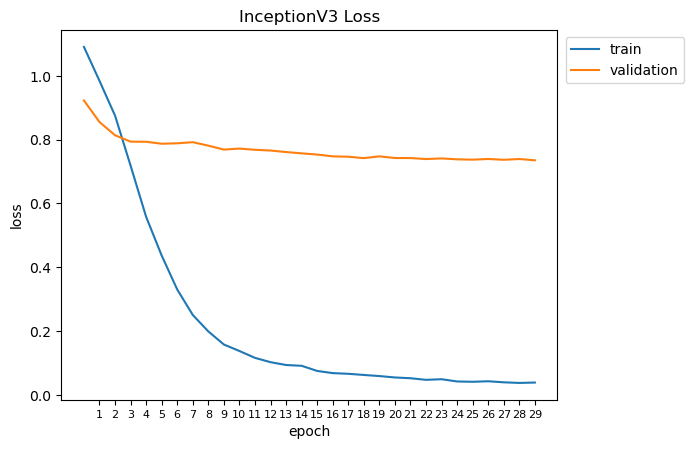

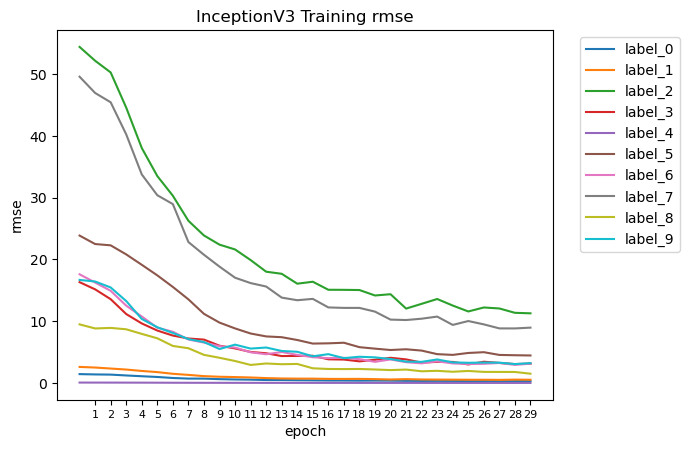

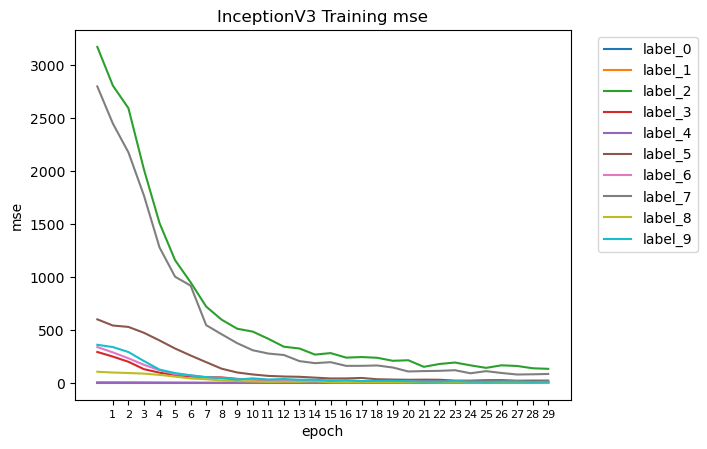

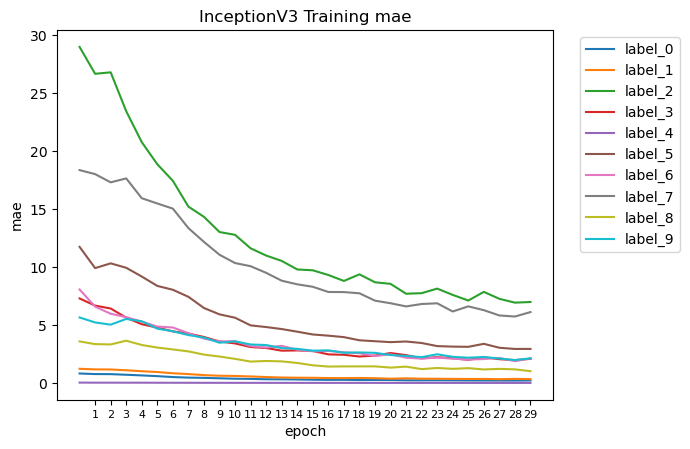

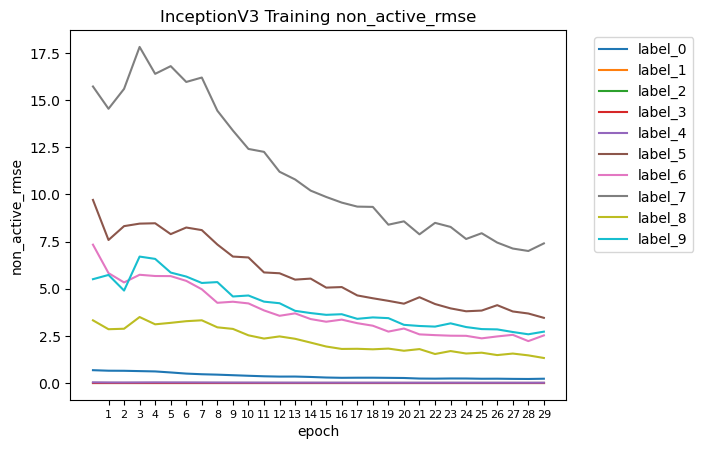

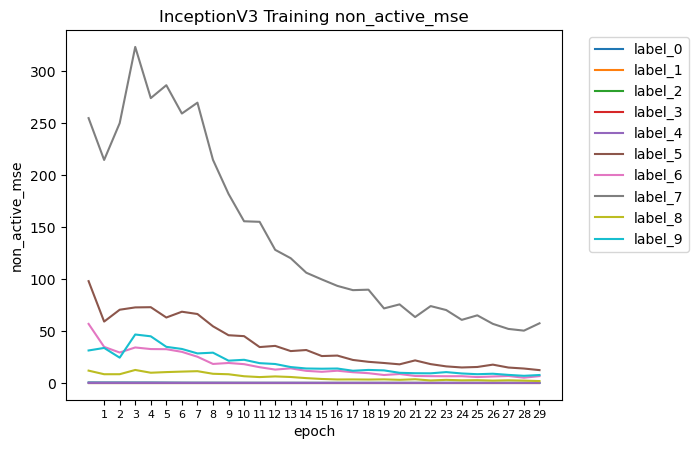

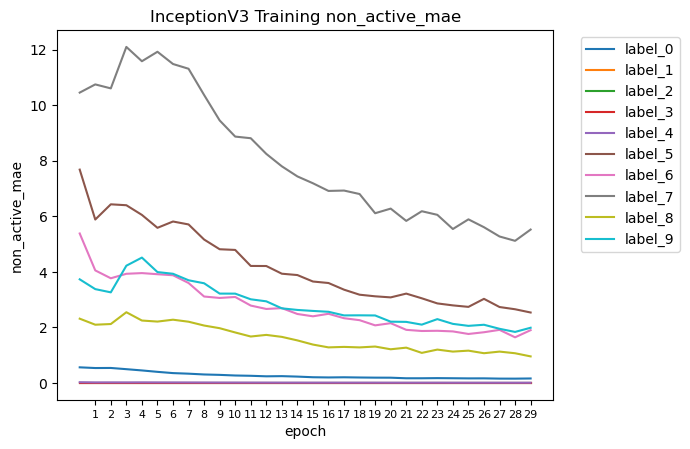

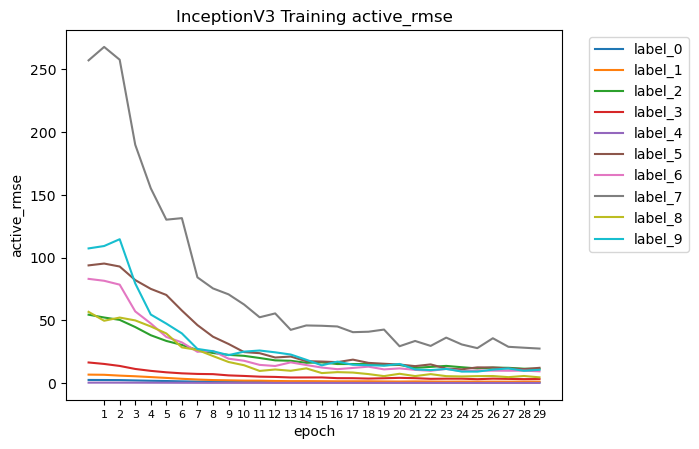

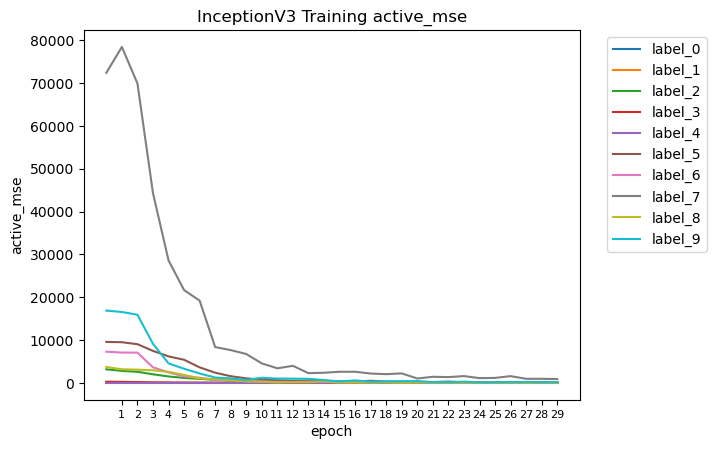

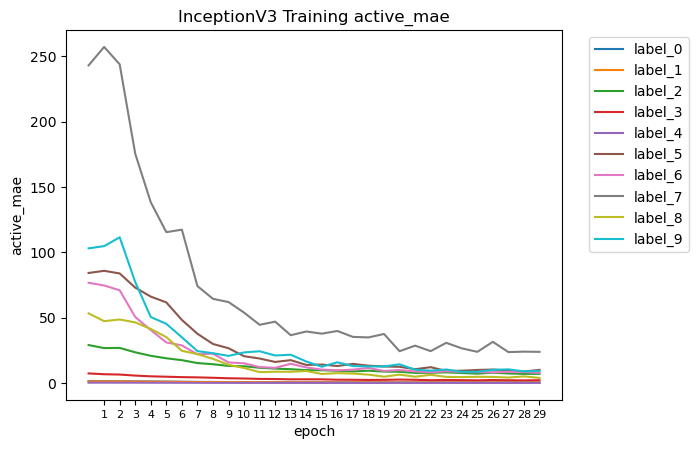

In [ ]:
plot('InceptionV3', history3, num_of_preds, data = '', num_of_batches = len(train_ds))

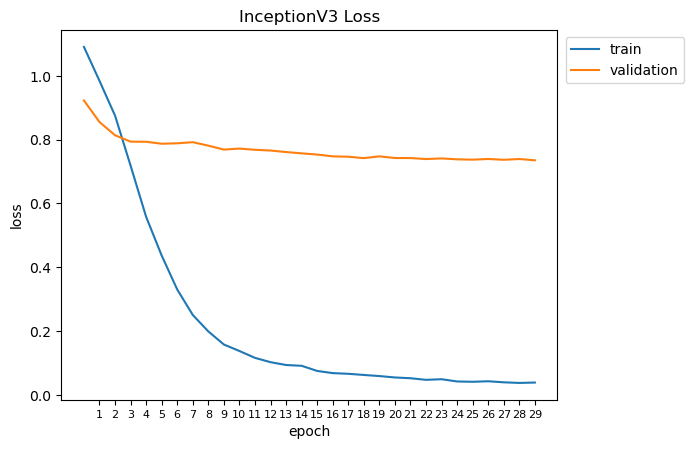

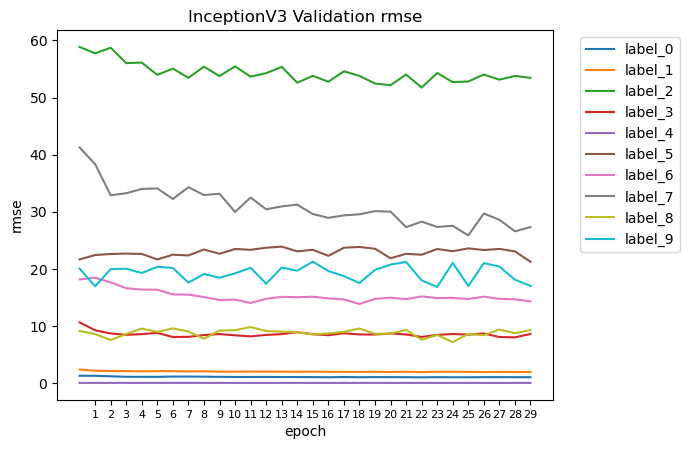

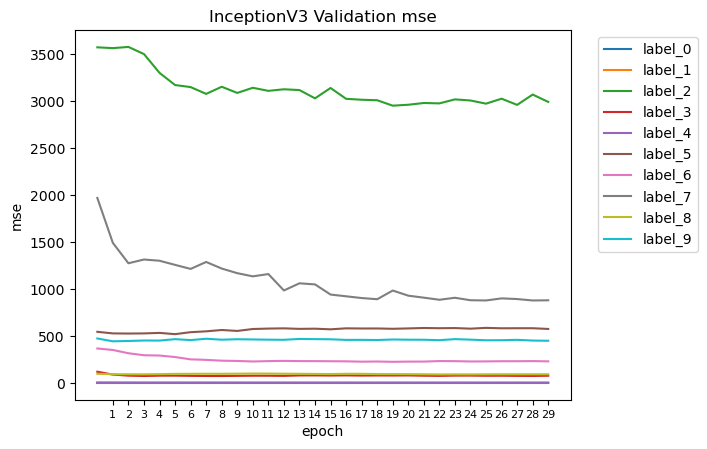

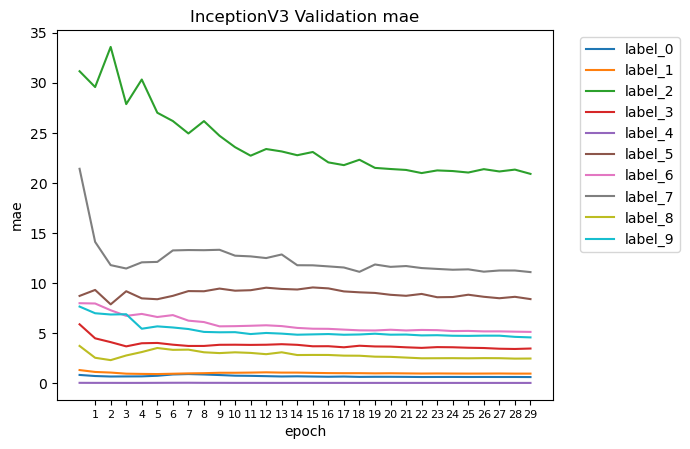

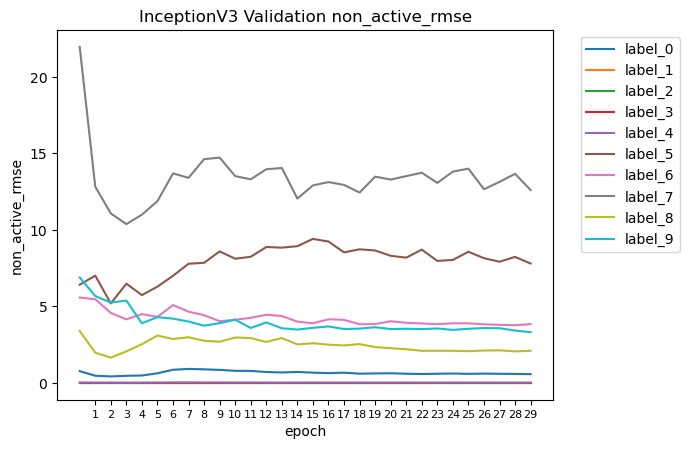

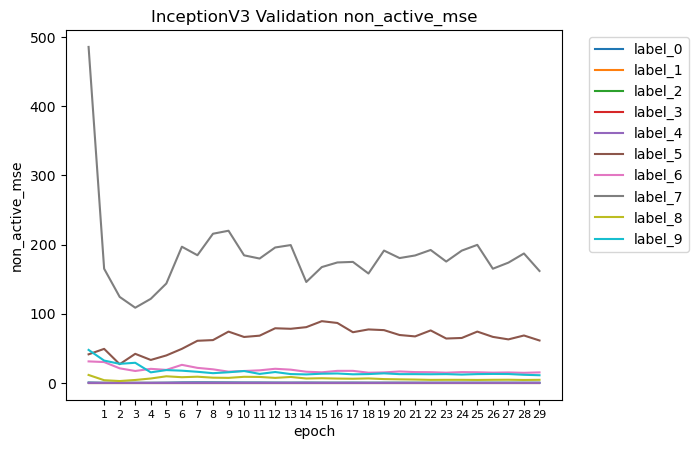

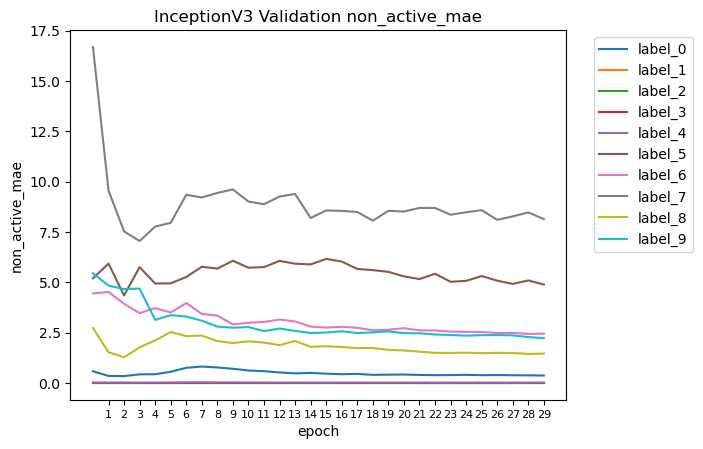

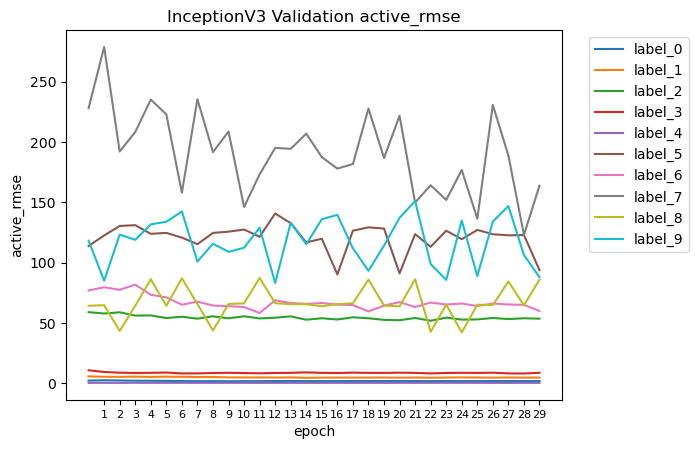

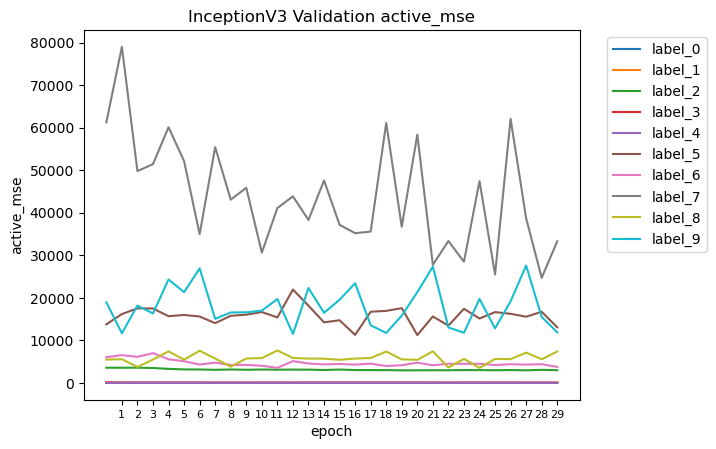

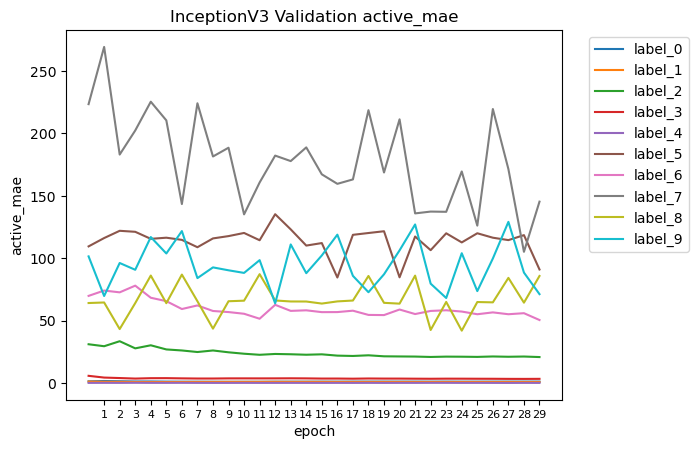

In [ ]:
plot('InceptionV3', history3, num_of_preds, data = 'val_', num_of_batches = len(val_ds))

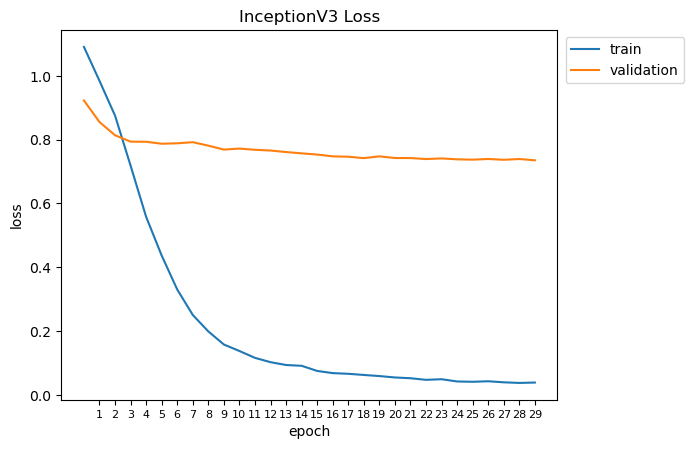

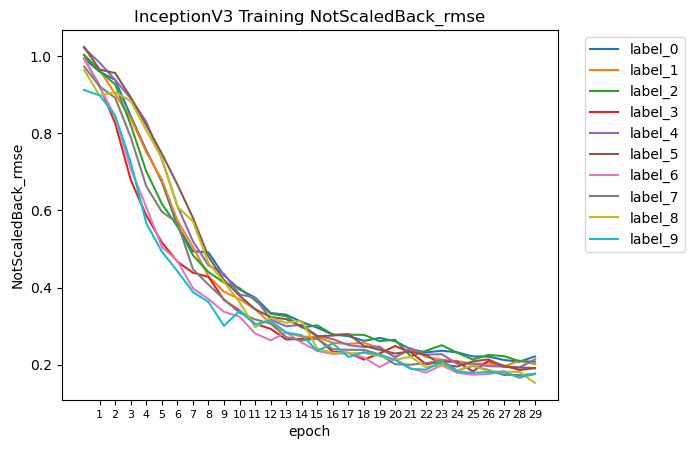

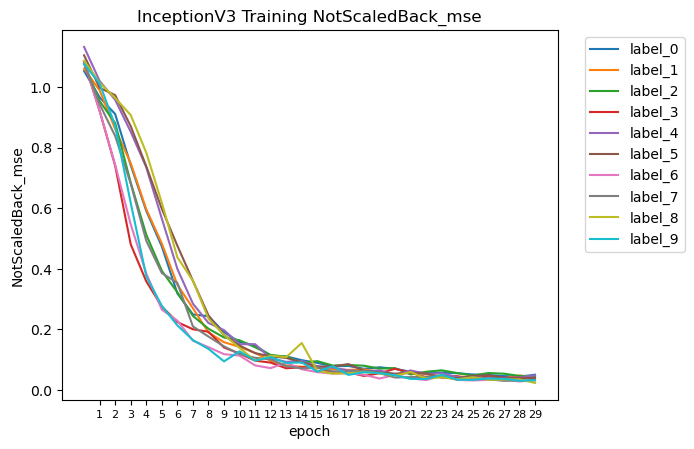

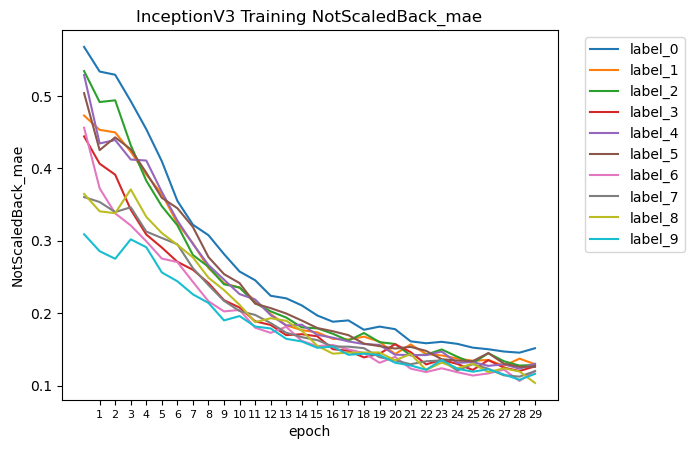

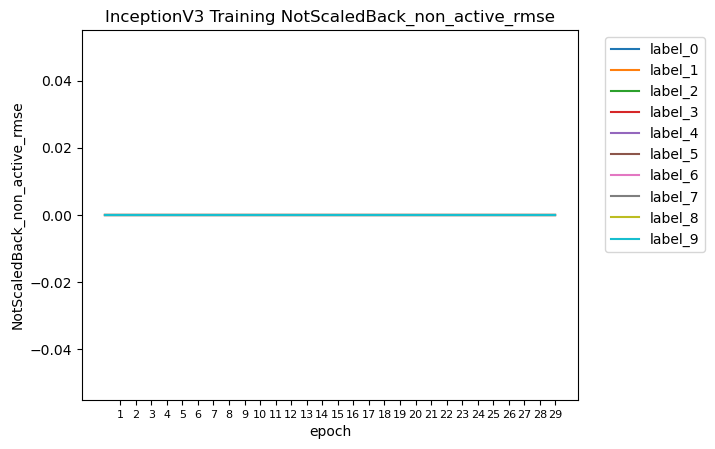

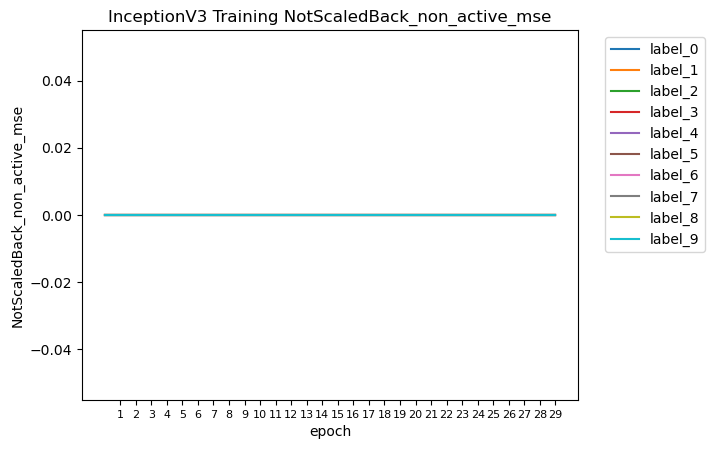

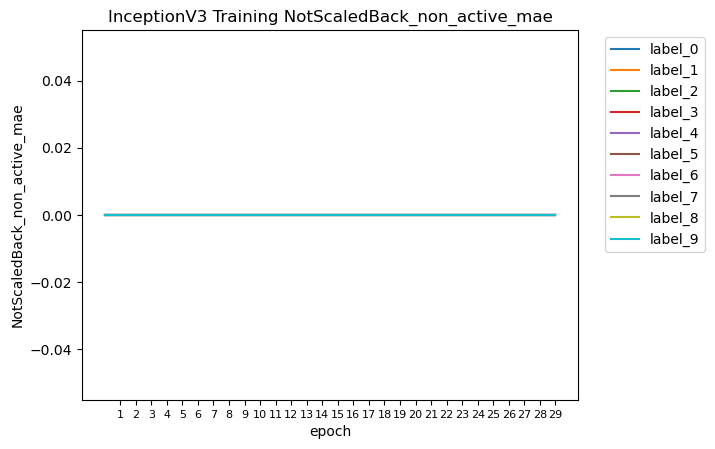

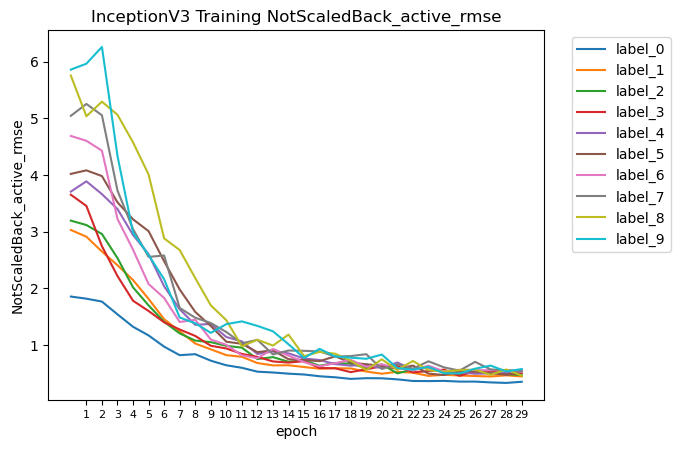

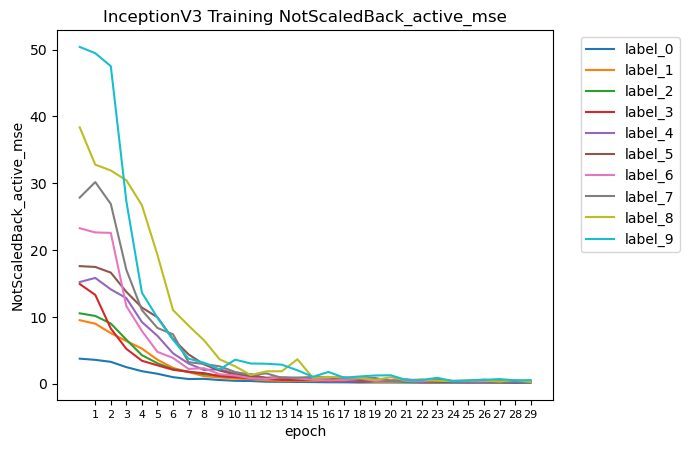

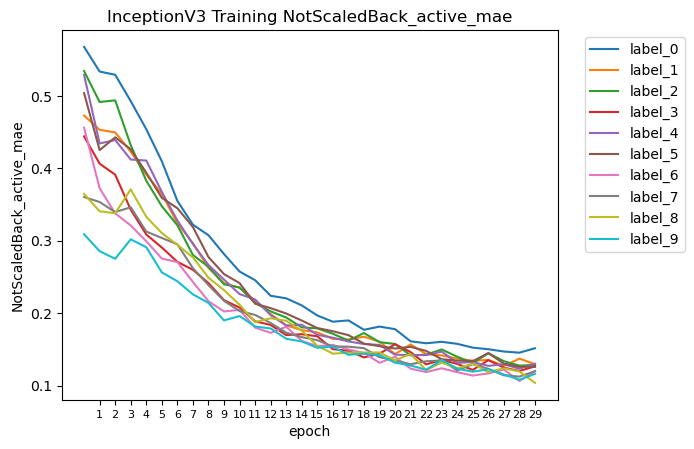

In [ ]:
plot('InceptionV3', history3, num_of_preds, data = '', num_of_batches = len(train_ds), NotScaledBack = True)

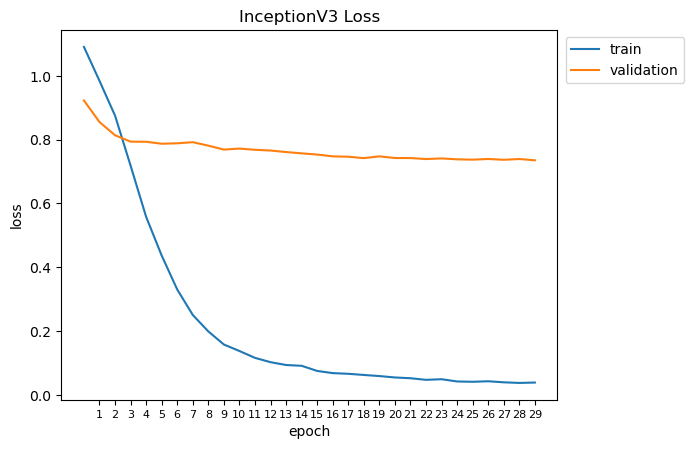

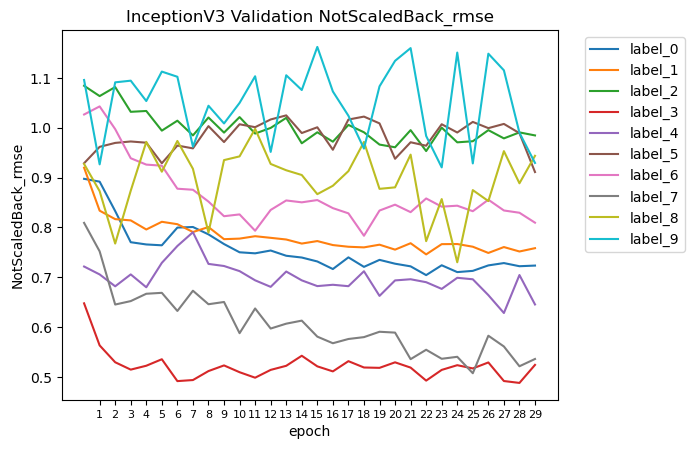

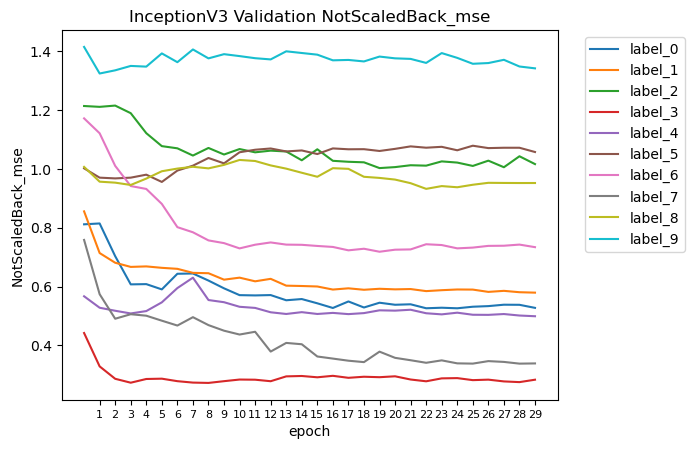

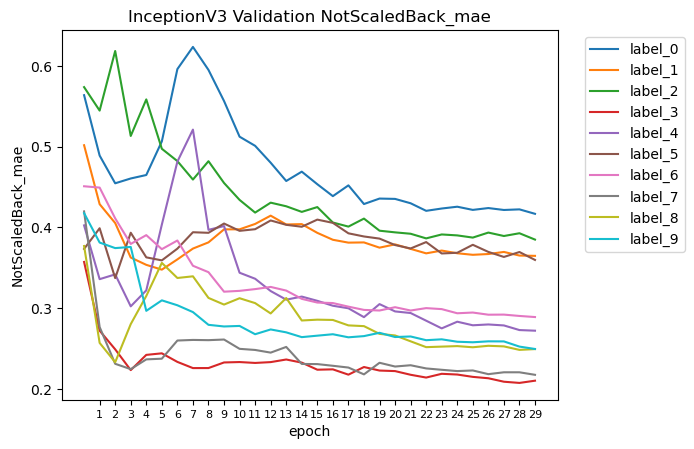

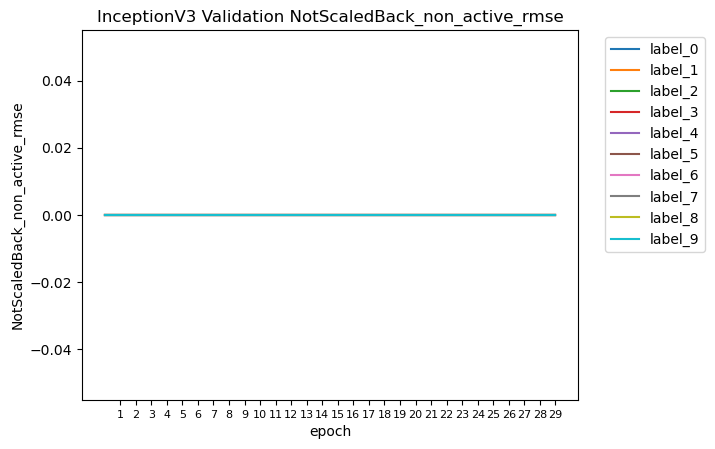

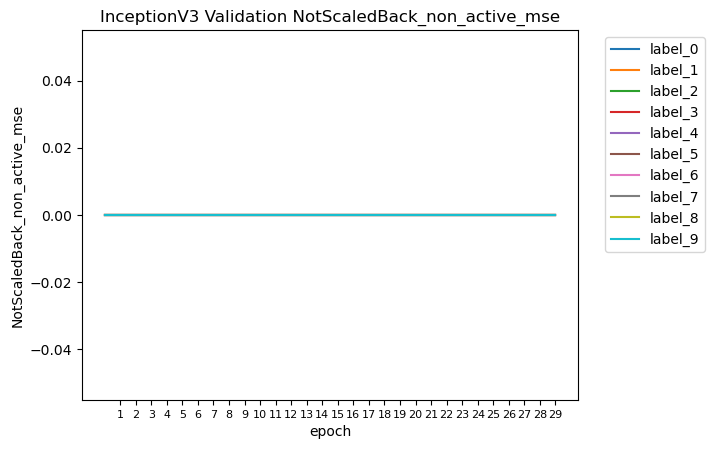

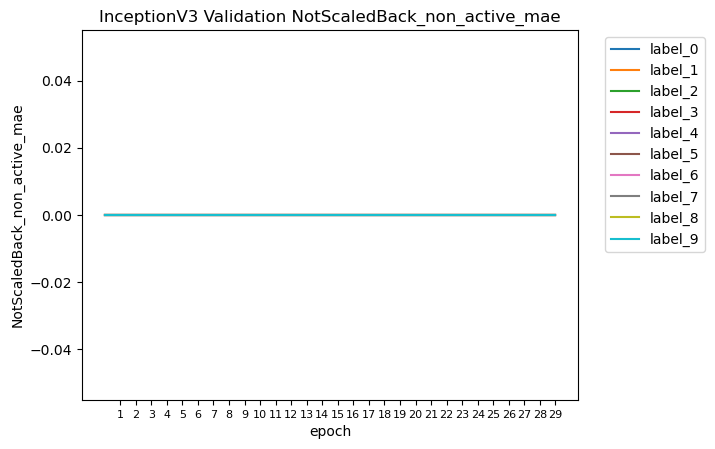

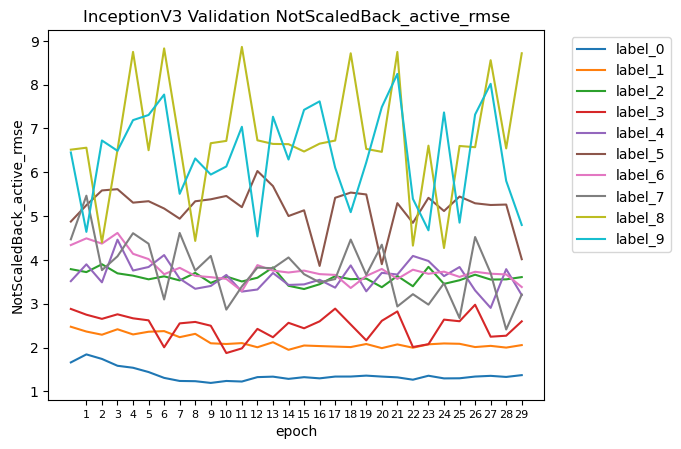

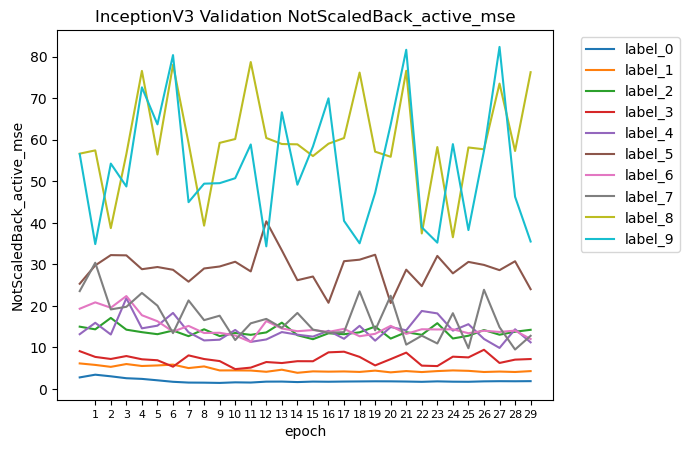

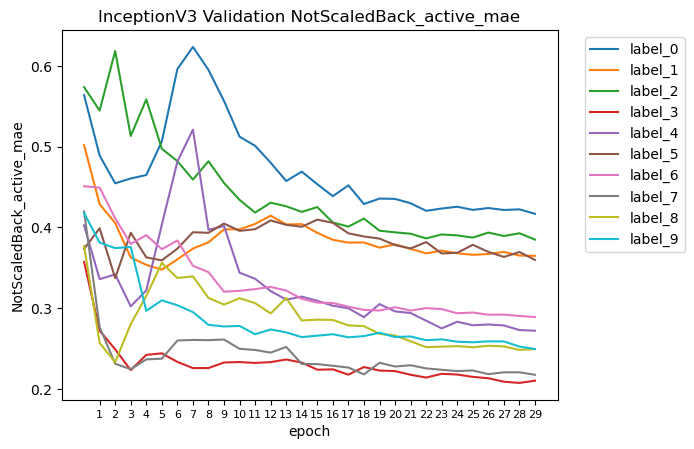

In [ ]:
plot('InceptionV3', history3, num_of_preds, data = 'val_', num_of_batches = len(val_ds), NotScaledBack = True)

predict something

In [ ]:
test_ds = create_dataset(X_val, y_val, is_training=False,
                          img_size = IMG_SIZE, channels = CHANNELS,
                          batch_size = BATCH_SIZE, buffer_size = SHUFFLE_BUFFER_SIZE)

In [ ]:
test_ds = test_ds.map(lambda x,y: (tf.image.resize(x, (75,75)),y))

In [ ]:
y_val

[[-0.542634369735395,
  -0.24367696258550614,
  -0.2713702738489545,
  -0.20865506338494352,
  -0.20424210392188577,
  -0.20475846925882488,
  -0.1779461597407127,
  6.052372138586014,
  -0.14075657603758035,
  -0.1105202165330962],
 [-0.542634369735395,
  -0.24367696258550614,
  -0.2713702738489545,
  -0.20865506338494352,
  -0.20424210392188577,
  -0.20475846925882488,
  -0.1779461597407127,
  -0.16571927523215385,
  -0.14075657603758035,
  -0.1105202165330962],
 [1.2687570307184124,
  -0.24367696258550614,
  -0.2713702738489545,
  -0.20865506338494352,
  -0.20424210392188577,
  -0.20475846925882488,
  5.0979822941590545,
  -0.16571927523215385,
  -0.14075657603758035,
  -0.1105202165330962],
 [-0.542634369735395,
  -0.24367696258550614,
  -0.2713702738489545,
  -0.20865506338494352,
  -0.20424210392188577,
  -0.20475846925882488,
  -0.1779461597407127,
  -0.16571927523215385,
  -0.14075657603758035,
  -0.1105202165330962],
 [-0.542634369735395,
  -0.24367696258550614,
  -0.271370273

In [ ]:
pred = model.predict(test_ds)

In [ ]:
pred

array([[-0.33707657, -0.27625325, -0.42067903, ...,  3.9539971 ,
        -0.1757608 , -0.15346965],
       [-0.42356336, -0.30384997, -0.34537426, ..., -0.14751108,
        -0.02955824, -0.2081621 ],
       [ 0.71082824, -0.31251767,  0.2602802 , ...,  0.15625241,
         0.33361268,  0.19397536],
       ...,
       [-0.4749224 , -0.27008298, -0.22169407, ..., -0.20986696,
        -0.17331009, -0.07836518],
       [ 0.39144477,  0.13557608, -0.25893143, ...,  0.15704755,
        -0.3245537 , -0.13157946],
       [ 1.1100401 , -0.48255768, -0.43554002, ..., -0.08665919,
        -0.04772978,  0.09485073]], dtype=float32)

In [ ]:
# rescale predictions
for p in range(len(pred)):
    for i in range(10):
        pred[p][i] = pred[p][i]*std_by_label[i] + mean_by_label[i]

In [ ]:
arr_y_val[0]

array([  0.   ,   0.   ,   0.   ,   0.   ,   0.   ,   0.   ,   0.   ,
       317.032,   0.   ,   0.   ])

### min-max normalized data

**MAE**

In [ ]:
# cosine decay learning rate
lr_decayed_fn = tf.keras.experimental.CosineDecay(initial_learning_rate=0.0001, decay_steps=1000)
optimizer_adam_cos_decay = tf.keras.optimizers.Adam(learning_rate=lr_decayed_fn)

In [ ]:
tf.keras.backend.clear_session()
    
model2 = tf.keras.models.Sequential([
            InceptionV3(input_shape = input_shape, include_top=False, weights='imagenet',  pooling = "avg"),
            tf.keras.layers.Dense(num_of_preds, activation = 'relu')
        ])    

In [ ]:
model2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 2048)              21802784  
                                                                 
 dense (Dense)               (None, 10)                20490     
                                                                 
Total params: 21,823,274
Trainable params: 21,788,842
Non-trainable params: 34,432
_________________________________________________________________


In [ ]:
#callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

In [ ]:
model2.compile(
            loss = tf.keras.losses.MeanAbsoluteError(tf.keras.losses.Reduction.SUM_OVER_BATCH_SIZE), #mean mae per sample
            optimizer = optimizer_adam_cos_decay,
            metrics = [[self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all',name = 'rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', name = 'mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', name = 'mae_' + str(i)) for i in range(10)],                
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_mae_' + str(i)) for i in range(10)],
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_mae_' + str(i)) for i in range(10)], 
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False,name = 'NotScaledBack_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False, name = 'NotScaledBack_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False, name = 'NotScaledBack_mae_' + str(i)) for i in range(10)],                
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_mae_' + str(i)) for i in range(10)],
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_mae_' + str(i)) for i in range(10)]], 
            run_eagerly=True)

In [ ]:
start_time = time.time()
history2= model2.fit(train_ds, validation_data = val_ds, epochs=EPOCHS)
end_time = time.time()
print('Time takes to train:'.format(EPOCHS), end_time - start_time)

Epoch 1/30
22/22 [==============================] - 64s 3s/step - loss: 0.0438 - rmse_0: 43.5912 - rmse_1: 62.6453 - rmse_2: 1563.2517 - rmse_3: 410.6047 - rmse_4: 2.2410 - rmse_5: 562.8423 - rmse_6: 579.6755 - rmse_7: 1593.5718 - rmse_8: 592.7418 - rmse_9: 440.8010 - mse_0: 109.1430 - mse_1: 198.8695 - mse_2: 131670.8750 - mse_3: 8241.0840 - mse_4: 0.2756 - mse_5: 16152.0625 - mse_6: 19326.5918 - mse_7: 142793.9688 - mse_8: 28697.6914 - mse_9: 12272.9287 - mae_0: 17.9517 - mae_1: 17.2116 - mae_2: 539.2862 - mae_3: 125.6685 - mae_4: 0.9189 - mae_5: 149.0580 - mae_6: 223.9068 - mae_7: 520.5330 - mae_8: 235.1068 - mae_9: 91.3451 - non_active_rmse_0: 25.6919 - non_active_rmse_1: 23.2851 - non_active_rmse_2: 856.9451 - non_active_rmse_3: 172.7298 - non_active_rmse_4: 1.5803 - non_active_rmse_5: 210.3378 - non_active_rmse_6: 383.0877 - non_active_rmse_7: 1002.7279 - non_active_rmse_8: 529.5905 - non_active_rmse_9: 224.3872 - non_active_mse_0: 79.4212 - non_active_mse_1: 52.7968 - non_active

Epoch 2/30
22/22 [==============================] - 59s 3s/step - loss: 0.0208 - rmse_0: 33.3068 - rmse_1: 58.4553 - rmse_2: 1210.2473 - rmse_3: 349.7920 - rmse_4: 1.4497 - rmse_5: 507.8417 - rmse_6: 376.3937 - rmse_7: 1087.9131 - rmse_8: 199.3715 - rmse_9: 358.4125 - mse_0: 52.8994 - mse_1: 165.8315 - mse_2: 70278.3594 - mse_3: 6195.8359 - mse_4: 0.1086 - mse_5: 12470.1152 - mse_6: 7205.5928 - mse_7: 60044.3672 - mse_8: 2309.1526 - mse_9: 7471.0820 - mae_0: 12.2794 - mae_1: 14.4918 - mae_2: 327.8864 - mae_3: 76.2183 - mae_4: 0.3174 - mae_5: 107.4062 - mae_6: 71.8461 - mae_7: 193.3211 - mae_8: 35.5945 - mae_9: 46.0579 - non_active_rmse_0: 3.4351 - non_active_rmse_1: 6.3786 - non_active_rmse_2: 58.2524 - non_active_rmse_3: 13.6862 - non_active_rmse_4: 0.0922 - non_active_rmse_5: 25.3457 - non_active_rmse_6: 15.7577 - non_active_rmse_7: 21.8927 - non_active_rmse_8: 29.0201 - non_active_rmse_9: 15.0582 - non_active_mse_0: 1.5918 - non_active_mse_1: 10.4431 - non_active_mse_2: 658.7101 - n

Epoch 3/30
22/22 [==============================] - 57s 3s/step - loss: 0.0205 - rmse_0: 32.6987 - rmse_1: 55.5597 - rmse_2: 1184.8801 - rmse_3: 344.7703 - rmse_4: 1.4279 - rmse_5: 513.3240 - rmse_6: 370.4356 - rmse_7: 1100.8594 - rmse_8: 230.6656 - rmse_9: 343.7873 - mse_0: 51.7647 - mse_1: 154.5414 - mse_2: 68538.1484 - mse_3: 6089.3896 - mse_4: 0.1064 - mse_5: 12690.8447 - mse_6: 7060.8682 - mse_7: 60015.4648 - mse_8: 3391.5757 - mse_9: 7475.2568 - mae_0: 11.9848 - mae_1: 13.8017 - mae_2: 322.5603 - mae_3: 75.0007 - mae_4: 0.3058 - mae_5: 106.0767 - mae_6: 70.1028 - mae_7: 193.5828 - mae_8: 35.5179 - mae_9: 46.0349 - non_active_rmse_0: 0.3437 - non_active_rmse_1: 0.4903 - non_active_rmse_2: 24.6228 - non_active_rmse_3: 3.4611 - non_active_rmse_4: 0.0203 - non_active_rmse_5: 3.7671 - non_active_rmse_6: 10.6507 - non_active_rmse_7: 57.5316 - non_active_rmse_8: 45.6915 - non_active_rmse_9: 17.5959 - non_active_mse_0: 0.0240 - non_active_mse_1: 0.1192 - non_active_mse_2: 126.8986 - non_

Epoch 4/30
22/22 [==============================] - 57s 3s/step - loss: 0.0203 - rmse_0: 32.6400 - rmse_1: 56.8515 - rmse_2: 1203.8915 - rmse_3: 352.1479 - rmse_4: 1.4459 - rmse_5: 503.1918 - rmse_6: 372.1829 - rmse_7: 1061.9419 - rmse_8: 198.0782 - rmse_9: 333.2490 - mse_0: 51.5682 - mse_1: 154.6684 - mse_2: 68469.3750 - mse_3: 6236.0400 - mse_4: 0.1063 - mse_5: 12304.3330 - mse_6: 7117.1689 - mse_7: 56872.5195 - mse_8: 2173.9038 - mse_9: 7390.9282 - mae_0: 11.9630 - mae_1: 13.8407 - mae_2: 321.3523 - mae_3: 75.4851 - mae_4: 0.3049 - mae_5: 104.6385 - mae_6: 69.9850 - mae_7: 186.5392 - mae_8: 30.8248 - mae_9: 45.1479 - non_active_rmse_0: 0.4246 - non_active_rmse_1: 0.4574 - non_active_rmse_2: 10.0578 - non_active_rmse_3: 5.5246 - non_active_rmse_4: 0.0077 - non_active_rmse_5: 6.5417 - non_active_rmse_6: 9.6334 - non_active_rmse_7: 29.9014 - non_active_rmse_8: 4.5228 - non_active_rmse_9: 6.1674 - non_active_mse_0: 0.0912 - non_active_mse_1: 0.0646 - non_active_mse_2: 40.0474 - non_acti

Epoch 5/30
22/22 [==============================] - 57s 3s/step - loss: 0.0202 - rmse_0: 33.3255 - rmse_1: 57.2703 - rmse_2: 1209.2616 - rmse_3: 358.3400 - rmse_4: 1.4739 - rmse_5: 509.8091 - rmse_6: 377.0219 - rmse_7: 1023.6450 - rmse_8: 202.5117 - rmse_9: 354.3084 - mse_0: 52.1078 - mse_1: 155.4375 - mse_2: 68896.5938 - mse_3: 6069.4385 - mse_4: 0.1078 - mse_5: 12624.7959 - mse_6: 7086.1914 - mse_7: 56808.6719 - mse_8: 2199.4514 - mse_9: 7287.6875 - mae_0: 12.0363 - mae_1: 13.8935 - mae_2: 323.5210 - mae_3: 73.6607 - mae_4: 0.3089 - mae_5: 105.3982 - mae_6: 69.9918 - mae_7: 183.7621 - mae_8: 30.8937 - mae_9: 44.1551 - non_active_rmse_0: 0.0259 - non_active_rmse_1: 0.3827 - non_active_rmse_2: 18.7030 - non_active_rmse_3: 0.6277 - non_active_rmse_4: 0.0446 - non_active_rmse_5: 2.1439 - non_active_rmse_6: 11.1747 - non_active_rmse_7: 17.6193 - non_active_rmse_8: 2.5073 - non_active_rmse_9: 4.1621 - non_active_mse_0: 3.5981e-04 - non_active_mse_1: 0.0279 - non_active_mse_2: 59.4068 - non

Epoch 6/30
22/22 [==============================] - 57s 3s/step - loss: 0.0201 - rmse_0: 33.0309 - rmse_1: 55.9034 - rmse_2: 1189.1715 - rmse_3: 350.3808 - rmse_4: 1.4672 - rmse_5: 504.1605 - rmse_6: 381.4695 - rmse_7: 996.9384 - rmse_8: 194.8703 - rmse_9: 341.0781 - mse_0: 51.3947 - mse_1: 155.5021 - mse_2: 68095.8672 - mse_3: 6055.3550 - mse_4: 0.1074 - mse_5: 12325.0029 - mse_6: 7086.9717 - mse_7: 53517.9961 - mse_8: 2127.4382 - mse_9: 7266.0225 - mae_0: 11.9847 - mae_1: 13.8890 - mae_2: 318.4682 - mae_3: 73.9223 - mae_4: 0.3097 - mae_5: 104.1222 - mae_6: 69.4111 - mae_7: 179.0531 - mae_8: 30.0908 - mae_9: 43.4904 - non_active_rmse_0: 0.0147 - non_active_rmse_1: 0.5138 - non_active_rmse_2: 7.6092 - non_active_rmse_3: 5.7160 - non_active_rmse_4: 0.0031 - non_active_rmse_5: 1.1800 - non_active_rmse_6: 1.1006 - non_active_rmse_7: 31.9131 - non_active_rmse_8: 3.7527 - non_active_rmse_9: 0.3292 - non_active_mse_0: 2.1659e-04 - non_active_mse_1: 0.0481 - non_active_mse_2: 40.1912 - non_ac

Epoch 7/30
22/22 [==============================] - 57s 3s/step - loss: 0.0201 - rmse_0: 32.4325 - rmse_1: 57.6947 - rmse_2: 1199.3628 - rmse_3: 349.5215 - rmse_4: 1.4839 - rmse_5: 505.2352 - rmse_6: 371.6662 - rmse_7: 1036.8813 - rmse_8: 189.1960 - rmse_9: 347.9406 - mse_0: 51.2272 - mse_1: 157.2462 - mse_2: 70715.1562 - mse_3: 6163.0420 - mse_4: 0.1074 - mse_5: 12567.6650 - mse_6: 6974.0850 - mse_7: 53597.5391 - mse_8: 2147.4863 - mse_9: 7382.6914 - mae_0: 11.8757 - mae_1: 13.8167 - mae_2: 330.2109 - mae_3: 75.1224 - mae_4: 0.3064 - mae_5: 106.7206 - mae_6: 68.6962 - mae_7: 181.5640 - mae_8: 30.7083 - mae_9: 44.5077 - non_active_rmse_0: 0.7014 - non_active_rmse_1: 0.5527 - non_active_rmse_2: 17.1641 - non_active_rmse_3: 1.5801 - non_active_rmse_4: 0.0028 - non_active_rmse_5: 10.0813 - non_active_rmse_6: 5.8869 - non_active_rmse_7: 31.7459 - non_active_rmse_8: 0.8779 - non_active_rmse_9: 2.0566 - non_active_mse_0: 0.0589 - non_active_mse_1: 0.1020 - non_active_mse_2: 59.4926 - non_act

Epoch 8/30
22/22 [==============================] - 58s 3s/step - loss: 0.0199 - rmse_0: 31.9639 - rmse_1: 56.1865 - rmse_2: 1204.3569 - rmse_3: 349.3163 - rmse_4: 1.4406 - rmse_5: 500.1017 - rmse_6: 377.4355 - rmse_7: 1013.6848 - rmse_8: 195.6209 - rmse_9: 348.9196 - mse_0: 49.4001 - mse_1: 156.4397 - mse_2: 68649.3047 - mse_3: 6150.1265 - mse_4: 0.1049 - mse_5: 12413.5791 - mse_6: 7043.8735 - mse_7: 52112.9141 - mse_8: 2142.2891 - mse_9: 7254.9619 - mae_0: 11.6655 - mae_1: 13.8877 - mae_2: 322.0790 - mae_3: 74.8530 - mae_4: 0.3035 - mae_5: 104.8056 - mae_6: 68.0860 - mae_7: 175.5144 - mae_8: 30.1477 - mae_9: 44.0717 - non_active_rmse_0: 0.4037 - non_active_rmse_1: 0.0316 - non_active_rmse_2: 4.7447 - non_active_rmse_3: 1.8190 - non_active_rmse_4: 0.0264 - non_active_rmse_5: 3.5467 - non_active_rmse_6: 5.6246 - non_active_rmse_7: 36.6986 - non_active_rmse_8: 1.4276 - non_active_rmse_9: 1.0812 - non_active_mse_0: 0.0723 - non_active_mse_1: 6.6493e-04 - non_active_mse_2: 6.0123 - non_ac

Epoch 9/30
22/22 [==============================] - 57s 3s/step - loss: 0.0199 - rmse_0: 31.6596 - rmse_1: 55.9993 - rmse_2: 1197.2296 - rmse_3: 354.9487 - rmse_4: 1.4289 - rmse_5: 501.1349 - rmse_6: 364.4594 - rmse_7: 980.2467 - rmse_8: 194.8320 - rmse_9: 339.4003 - mse_0: 49.0729 - mse_1: 155.6035 - mse_2: 67696.4844 - mse_3: 6120.9473 - mse_4: 0.1059 - mse_5: 12229.2939 - mse_6: 6874.2979 - mse_7: 50388.9180 - mse_8: 2253.7686 - mse_9: 7047.5112 - mae_0: 11.7407 - mae_1: 13.8648 - mae_2: 318.3665 - mae_3: 74.1316 - mae_4: 0.3075 - mae_5: 103.7975 - mae_6: 68.3401 - mae_7: 171.8772 - mae_8: 31.3258 - mae_9: 42.8821 - non_active_rmse_0: 0.6749 - non_active_rmse_1: 0.1394 - non_active_rmse_2: 8.3556 - non_active_rmse_3: 0.5879 - non_active_rmse_4: 0.0183 - non_active_rmse_5: 4.1066 - non_active_rmse_6: 7.7013 - non_active_rmse_7: 40.1685 - non_active_rmse_8: 0.7563 - non_active_rmse_9: 1.7212 - non_active_mse_0: 0.0553 - non_active_mse_1: 0.0174 - non_active_mse_2: 19.4001 - non_active

Epoch 10/30
22/22 [==============================] - 58s 3s/step - loss: 0.0198 - rmse_0: 31.9693 - rmse_1: 55.9125 - rmse_2: 1207.1526 - rmse_3: 346.6399 - rmse_4: 1.4331 - rmse_5: 493.6210 - rmse_6: 378.7881 - rmse_7: 999.3600 - rmse_8: 207.8856 - rmse_9: 333.7022 - mse_0: 48.5556 - mse_1: 154.5841 - mse_2: 68310.2656 - mse_3: 6148.6416 - mse_4: 0.1035 - mse_5: 12208.1426 - mse_6: 7432.7725 - mse_7: 49794.4922 - mse_8: 2335.5469 - mse_9: 7068.4541 - mae_0: 11.8080 - mae_1: 13.8155 - mae_2: 322.0174 - mae_3: 74.2208 - mae_4: 0.3031 - mae_5: 103.1187 - mae_6: 70.3934 - mae_7: 165.8718 - mae_8: 31.8660 - mae_9: 43.7281 - non_active_rmse_0: 1.0496 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 2.7181 - non_active_rmse_3: 6.2436 - non_active_rmse_4: 0.0166 - non_active_rmse_5: 0.2448 - non_active_rmse_6: 9.2010 - non_active_rmse_7: 62.8864 - non_active_rmse_8: 15.9428 - non_active_rmse_9: 5.1613 - non_active_mse_0: 0.1593 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 4.3091 - n

Epoch 11/30
22/22 [==============================] - 58s 3s/step - loss: 0.0196 - rmse_0: 31.4354 - rmse_1: 56.5801 - rmse_2: 1190.5227 - rmse_3: 342.4891 - rmse_4: 1.4813 - rmse_5: 509.6872 - rmse_6: 359.0093 - rmse_7: 988.9486 - rmse_8: 194.3767 - rmse_9: 347.2759 - mse_0: 47.1813 - mse_1: 157.1002 - mse_2: 67626.4922 - mse_3: 5818.3975 - mse_4: 0.1043 - mse_5: 12311.0742 - mse_6: 6777.7026 - mse_7: 46967.3438 - mse_8: 2126.7590 - mse_9: 7592.7251 - mae_0: 11.4916 - mae_1: 14.0410 - mae_2: 317.7950 - mae_3: 71.5142 - mae_4: 0.3052 - mae_5: 104.0705 - mae_6: 66.6746 - mae_7: 164.1425 - mae_8: 30.5399 - mae_9: 45.5675 - non_active_rmse_0: 1.0647 - non_active_rmse_1: 1.3404 - non_active_rmse_2: 9.0915 - non_active_rmse_3: 6.1807 - non_active_rmse_4: 0.0178 - non_active_rmse_5: 0.0000e+00 - non_active_rmse_6: 7.2683 - non_active_rmse_7: 26.9223 - non_active_rmse_8: 7.4225 - non_active_rmse_9: 0.2181 - non_active_mse_0: 0.1225 - non_active_mse_1: 0.9112 - non_active_mse_2: 18.1731 - non_a

Epoch 12/30
22/22 [==============================] - 61s 3s/step - loss: 0.0195 - rmse_0: 29.6773 - rmse_1: 56.6154 - rmse_2: 1172.6597 - rmse_3: 347.7650 - rmse_4: 1.4920 - rmse_5: 501.8787 - rmse_6: 356.9442 - rmse_7: 915.7632 - rmse_8: 198.2776 - rmse_9: 314.4321 - mse_0: 43.0897 - mse_1: 159.2681 - mse_2: 67515.6719 - mse_3: 5821.7046 - mse_4: 0.1087 - mse_5: 12523.5742 - mse_6: 6576.6826 - mse_7: 44062.1484 - mse_8: 2193.9800 - mse_9: 6903.7988 - mae_0: 11.2330 - mae_1: 14.0576 - mae_2: 319.4059 - mae_3: 71.7925 - mae_4: 0.3123 - mae_5: 105.0276 - mae_6: 65.5254 - mae_7: 158.5400 - mae_8: 30.7836 - mae_9: 41.8913 - non_active_rmse_0: 3.5861 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 12.3175 - non_active_rmse_3: 12.8355 - non_active_rmse_4: 0.0306 - non_active_rmse_5: 1.5586 - non_active_rmse_6: 4.3597 - non_active_rmse_7: 30.0621 - non_active_rmse_8: 4.7325 - non_active_rmse_9: 1.6835 - non_active_mse_0: 0.8057 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 53.0199 -

Epoch 13/30
22/22 [==============================] - 60s 3s/step - loss: 0.0192 - rmse_0: 29.0177 - rmse_1: 57.6454 - rmse_2: 1204.0378 - rmse_3: 329.0611 - rmse_4: 1.4419 - rmse_5: 499.8847 - rmse_6: 348.7594 - rmse_7: 937.2066 - rmse_8: 196.5373 - rmse_9: 336.2426 - mse_0: 41.0589 - mse_1: 157.9230 - mse_2: 69261.7969 - mse_3: 5688.3896 - mse_4: 0.1080 - mse_5: 12303.4961 - mse_6: 6251.2935 - mse_7: 46121.8945 - mse_8: 2121.2559 - mse_9: 6909.7588 - mae_0: 10.9930 - mae_1: 14.0098 - mae_2: 319.4259 - mae_3: 70.6530 - mae_4: 0.3096 - mae_5: 104.0253 - mae_6: 62.5247 - mae_7: 160.0880 - mae_8: 30.0484 - mae_9: 41.8908 - non_active_rmse_0: 1.6981 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 9.6897 - non_active_rmse_3: 4.5149 - non_active_rmse_4: 0.0122 - non_active_rmse_5: 5.7054 - non_active_rmse_6: 2.4457 - non_active_rmse_7: 50.6255 - non_active_rmse_8: 4.4993 - non_active_rmse_9: 2.0418 - non_active_mse_0: 0.3092 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 18.7833 - n

Epoch 14/30
22/22 [==============================] - 58s 3s/step - loss: 0.0189 - rmse_0: 28.0444 - rmse_1: 55.7908 - rmse_2: 1196.1760 - rmse_3: 335.5790 - rmse_4: 1.4812 - rmse_5: 511.9827 - rmse_6: 332.0299 - rmse_7: 855.9058 - rmse_8: 200.3482 - rmse_9: 335.1490 - mse_0: 37.7285 - mse_1: 154.9951 - mse_2: 67094.0000 - mse_3: 5615.6880 - mse_4: 0.1058 - mse_5: 12441.6104 - mse_6: 5861.7153 - mse_7: 41408.9414 - mse_8: 2137.5647 - mse_9: 6942.4028 - mae_0: 10.4148 - mae_1: 13.8431 - mae_2: 316.1918 - mae_3: 69.8173 - mae_4: 0.3073 - mae_5: 104.5210 - mae_6: 58.3889 - mae_7: 147.8156 - mae_8: 30.0667 - mae_9: 42.1447 - non_active_rmse_0: 1.8378 - non_active_rmse_1: 0.6001 - non_active_rmse_2: 29.0209 - non_active_rmse_3: 9.2003 - non_active_rmse_4: 0.0271 - non_active_rmse_5: 0.4592 - non_active_rmse_6: 2.8943 - non_active_rmse_7: 39.9411 - non_active_rmse_8: 0.2582 - non_active_rmse_9: 0.9605 - non_active_mse_0: 0.2240 - non_active_mse_1: 0.2354 - non_active_mse_2: 231.8582 - non_act

Epoch 15/30
22/22 [==============================] - 58s 3s/step - loss: 0.0187 - rmse_0: 26.3925 - rmse_1: 58.2227 - rmse_2: 1172.7986 - rmse_3: 327.8553 - rmse_4: 1.4456 - rmse_5: 499.9113 - rmse_6: 351.9457 - rmse_7: 855.1561 - rmse_8: 200.4567 - rmse_9: 350.2051 - mse_0: 34.7554 - mse_1: 159.9173 - mse_2: 66588.7109 - mse_3: 5510.8369 - mse_4: 0.1036 - mse_5: 12319.2246 - mse_6: 6085.9146 - mse_7: 40359.2812 - mse_8: 2325.2695 - mse_9: 7252.1250 - mae_0: 10.0220 - mae_1: 14.1300 - mae_2: 311.7567 - mae_3: 68.5494 - mae_4: 0.3039 - mae_5: 104.2491 - mae_6: 60.7227 - mae_7: 144.7222 - mae_8: 31.7822 - mae_9: 43.3049 - non_active_rmse_0: 1.9331 - non_active_rmse_1: 0.0999 - non_active_rmse_2: 63.3411 - non_active_rmse_3: 8.0856 - non_active_rmse_4: 0.0247 - non_active_rmse_5: 1.5958 - non_active_rmse_6: 5.2381 - non_active_rmse_7: 33.0363 - non_active_rmse_8: 15.0689 - non_active_rmse_9: 0.0000e+00 - non_active_mse_0: 0.3411 - non_active_mse_1: 0.0100 - non_active_mse_2: 1368.6498 - n

Epoch 16/30
22/22 [==============================] - 57s 3s/step - loss: 0.0187 - rmse_0: 27.2713 - rmse_1: 56.1906 - rmse_2: 1176.5945 - rmse_3: 314.9933 - rmse_4: 1.4384 - rmse_5: 491.0801 - rmse_6: 312.7219 - rmse_7: 913.1608 - rmse_8: 206.2048 - rmse_9: 330.5355 - mse_0: 34.8706 - mse_1: 154.0856 - mse_2: 65502.5781 - mse_3: 5291.1250 - mse_4: 0.1011 - mse_5: 12226.2090 - mse_6: 5723.6475 - mse_7: 44227.4141 - mse_8: 2281.8091 - mse_9: 6925.2617 - mae_0: 10.1275 - mae_1: 13.8296 - mae_2: 309.3654 - mae_3: 68.0042 - mae_4: 0.2963 - mae_5: 103.3380 - mae_6: 58.6801 - mae_7: 151.1139 - mae_8: 31.8090 - mae_9: 42.0203 - non_active_rmse_0: 1.8832 - non_active_rmse_1: 0.2087 - non_active_rmse_2: 15.4653 - non_active_rmse_3: 10.6454 - non_active_rmse_4: 0.0070 - non_active_rmse_5: 0.9283 - non_active_rmse_6: 13.3886 - non_active_rmse_7: 24.9310 - non_active_rmse_8: 6.1773 - non_active_rmse_9: 1.9337 - non_active_mse_0: 0.3938 - non_active_mse_1: 0.0370 - non_active_mse_2: 71.8489 - non_ac

Epoch 17/30
22/22 [==============================] - 57s 3s/step - loss: 0.0185 - rmse_0: 26.1849 - rmse_1: 55.8018 - rmse_2: 1173.3014 - rmse_3: 318.7745 - rmse_4: 1.4589 - rmse_5: 505.6410 - rmse_6: 331.0579 - rmse_7: 849.3951 - rmse_8: 198.7907 - rmse_9: 322.2267 - mse_0: 32.7614 - mse_1: 153.5191 - mse_2: 65346.8906 - mse_3: 5091.7812 - mse_4: 0.1073 - mse_5: 12343.9551 - mse_6: 5871.4512 - mse_7: 38380.2734 - mse_8: 2121.9268 - mse_9: 7047.2021 - mae_0: 9.8851 - mae_1: 13.6944 - mae_2: 312.9948 - mae_3: 66.6790 - mae_4: 0.3099 - mae_5: 104.3133 - mae_6: 60.2780 - mae_7: 140.9014 - mae_8: 30.0568 - mae_9: 42.9472 - non_active_rmse_0: 1.8831 - non_active_rmse_1: 0.1194 - non_active_rmse_2: 21.4815 - non_active_rmse_3: 10.1444 - non_active_rmse_4: 0.0203 - non_active_rmse_5: 0.9547 - non_active_rmse_6: 5.5878 - non_active_rmse_7: 20.4110 - non_active_rmse_8: 0.8982 - non_active_rmse_9: 0.0000e+00 - non_active_mse_0: 0.2710 - non_active_mse_1: 0.0083 - non_active_mse_2: 63.5167 - non_

Epoch 18/30
22/22 [==============================] - 57s 3s/step - loss: 0.0181 - rmse_0: 24.7106 - rmse_1: 56.0016 - rmse_2: 1154.0781 - rmse_3: 312.1865 - rmse_4: 1.3966 - rmse_5: 496.1603 - rmse_6: 335.0605 - rmse_7: 815.2908 - rmse_8: 187.0001 - rmse_9: 346.7271 - mse_0: 29.5973 - mse_1: 153.1826 - mse_2: 64226.0352 - mse_3: 4947.9243 - mse_4: 0.1004 - mse_5: 12438.5039 - mse_6: 6005.4600 - mse_7: 35843.8789 - mse_8: 2085.0361 - mse_9: 7030.1855 - mae_0: 9.4113 - mae_1: 13.6522 - mae_2: 306.7800 - mae_3: 65.6478 - mae_4: 0.3043 - mae_5: 105.0568 - mae_6: 58.7465 - mae_7: 133.7855 - mae_8: 29.2922 - mae_9: 43.2638 - non_active_rmse_0: 1.8115 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 8.2662 - non_active_rmse_3: 6.1770 - non_active_rmse_4: 0.0546 - non_active_rmse_5: 0.7322 - non_active_rmse_6: 0.0000e+00 - non_active_rmse_7: 21.6166 - non_active_rmse_8: 0.6745 - non_active_rmse_9: 4.6978 - non_active_mse_0: 0.2834 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 13.5019 

Epoch 19/30
22/22 [==============================] - 57s 3s/step - loss: 0.0179 - rmse_0: 24.3761 - rmse_1: 57.2937 - rmse_2: 1161.0293 - rmse_3: 302.7438 - rmse_4: 1.4054 - rmse_5: 510.5267 - rmse_6: 327.2010 - rmse_7: 799.0768 - rmse_8: 191.5898 - rmse_9: 320.2495 - mse_0: 28.5844 - mse_1: 155.2797 - mse_2: 62610.5859 - mse_3: 4639.6777 - mse_4: 0.0973 - mse_5: 12670.2607 - mse_6: 5677.1152 - mse_7: 34745.6211 - mse_8: 2126.3525 - mse_9: 7041.5435 - mae_0: 9.2441 - mae_1: 13.8370 - mae_2: 304.3167 - mae_3: 62.1941 - mae_4: 0.2971 - mae_5: 106.7138 - mae_6: 57.2888 - mae_7: 132.8030 - mae_8: 29.8270 - mae_9: 43.4077 - non_active_rmse_0: 0.9378 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 33.7501 - non_active_rmse_3: 13.4117 - non_active_rmse_4: 0.0313 - non_active_rmse_5: 0.7615 - non_active_rmse_6: 9.1696 - non_active_rmse_7: 26.6662 - non_active_rmse_8: 0.1052 - non_active_rmse_9: 2.9056 - non_active_mse_0: 0.1056 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 139.4316 -

Epoch 20/30
22/22 [==============================] - 59s 3s/step - loss: 0.0176 - rmse_0: 22.5144 - rmse_1: 55.4908 - rmse_2: 1142.6978 - rmse_3: 294.7130 - rmse_4: 1.3701 - rmse_5: 508.4862 - rmse_6: 325.7376 - rmse_7: 799.6287 - rmse_8: 181.2003 - rmse_9: 333.0661 - mse_0: 25.3770 - mse_1: 152.9144 - mse_2: 61595.2031 - mse_3: 4360.3867 - mse_4: 0.0938 - mse_5: 12598.1045 - mse_6: 5539.5151 - mse_7: 34606.4922 - mse_8: 2067.3291 - mse_9: 7116.1396 - mae_0: 8.8826 - mae_1: 13.6279 - mae_2: 299.7360 - mae_3: 60.3109 - mae_4: 0.2924 - mae_5: 105.4297 - mae_6: 56.2999 - mae_7: 133.2266 - mae_8: 28.9452 - mae_9: 43.5014 - non_active_rmse_0: 1.8204 - non_active_rmse_1: 0.0272 - non_active_rmse_2: 30.3097 - non_active_rmse_3: 20.1615 - non_active_rmse_4: 0.0191 - non_active_rmse_5: 0.5232 - non_active_rmse_6: 7.0958 - non_active_rmse_7: 8.6945 - non_active_rmse_8: 2.4508 - non_active_rmse_9: 1.2163 - non_active_mse_0: 0.2943 - non_active_mse_1: 7.4075e-04 - non_active_mse_2: 161.8771 - non_

Epoch 21/30
22/22 [==============================] - 58s 3s/step - loss: 0.0172 - rmse_0: 22.8495 - rmse_1: 57.0041 - rmse_2: 1123.9369 - rmse_3: 283.1737 - rmse_4: 1.3828 - rmse_5: 499.2388 - rmse_6: 318.7705 - rmse_7: 782.6206 - rmse_8: 189.2286 - rmse_9: 326.0721 - mse_0: 25.8346 - mse_1: 156.5559 - mse_2: 59851.0352 - mse_3: 3879.5667 - mse_4: 0.0951 - mse_5: 12243.7480 - mse_6: 5572.3071 - mse_7: 34208.1797 - mse_8: 2079.5283 - mse_9: 6967.9404 - mae_0: 8.5982 - mae_1: 13.9126 - mae_2: 292.0652 - mae_3: 56.3852 - mae_4: 0.2928 - mae_5: 103.3785 - mae_6: 55.5335 - mae_7: 133.3196 - mae_8: 29.3233 - mae_9: 42.2507 - non_active_rmse_0: 1.6105 - non_active_rmse_1: 0.0410 - non_active_rmse_2: 18.6693 - non_active_rmse_3: 7.0632 - non_active_rmse_4: 0.0363 - non_active_rmse_5: 0.0000e+00 - non_active_rmse_6: 3.5187 - non_active_rmse_7: 41.2246 - non_active_rmse_8: 2.0686 - non_active_rmse_9: 0.0115 - non_active_mse_0: 0.2433 - non_active_mse_1: 0.0013 - non_active_mse_2: 73.5422 - non_a

Epoch 22/30
22/22 [==============================] - 57s 3s/step - loss: 0.0171 - rmse_0: 22.1587 - rmse_1: 57.5046 - rmse_2: 1139.2052 - rmse_3: 253.8794 - rmse_4: 1.2755 - rmse_5: 505.7586 - rmse_6: 326.1873 - rmse_7: 801.0889 - rmse_8: 192.7969 - rmse_9: 351.8889 - mse_0: 23.9412 - mse_1: 156.3879 - mse_2: 60934.4922 - mse_3: 3401.1108 - mse_4: 0.0844 - mse_5: 12579.0557 - mse_6: 5467.3101 - mse_7: 32416.4688 - mse_8: 2149.9639 - mse_9: 7215.3701 - mae_0: 8.2603 - mae_1: 13.8096 - mae_2: 297.3168 - mae_3: 53.3054 - mae_4: 0.2738 - mae_5: 105.8430 - mae_6: 54.6412 - mae_7: 128.2970 - mae_8: 29.4393 - mae_9: 42.7576 - non_active_rmse_0: 1.3808 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 38.0266 - non_active_rmse_3: 15.5929 - non_active_rmse_4: 0.0320 - non_active_rmse_5: 0.0863 - non_active_rmse_6: 3.9376 - non_active_rmse_7: 18.2231 - non_active_rmse_8: 0.3336 - non_active_rmse_9: 0.7115 - non_active_mse_0: 0.1918 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 271.2856 -

Epoch 23/30
22/22 [==============================] - 58s 3s/step - loss: 0.0169 - rmse_0: 22.3353 - rmse_1: 56.1846 - rmse_2: 1097.7678 - rmse_3: 254.0440 - rmse_4: 1.2409 - rmse_5: 514.4471 - rmse_6: 324.9745 - rmse_7: 750.3852 - rmse_8: 190.7060 - rmse_9: 293.0807 - mse_0: 23.9255 - mse_1: 153.3544 - mse_2: 58035.3320 - mse_3: 3211.7126 - mse_4: 0.0789 - mse_5: 12865.6973 - mse_6: 5526.6250 - mse_7: 29691.8984 - mse_8: 2152.4280 - mse_9: 6946.8223 - mae_0: 8.3330 - mae_1: 13.7101 - mae_2: 285.6932 - mae_3: 53.1005 - mae_4: 0.2689 - mae_5: 107.0047 - mae_6: 55.4124 - mae_7: 118.2820 - mae_8: 30.2097 - mae_9: 42.0050 - non_active_rmse_0: 1.7331 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 36.1444 - non_active_rmse_3: 6.8586 - non_active_rmse_4: 0.0672 - non_active_rmse_5: 0.4192 - non_active_rmse_6: 2.1912 - non_active_rmse_7: 12.2577 - non_active_rmse_8: 4.0250 - non_active_rmse_9: 0.7423 - non_active_mse_0: 0.2650 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 155.7138 - 

Epoch 24/30
22/22 [==============================] - 58s 3s/step - loss: 0.0166 - rmse_0: 20.8524 - rmse_1: 55.8117 - rmse_2: 1098.1761 - rmse_3: 248.1748 - rmse_4: 1.2451 - rmse_5: 491.5012 - rmse_6: 316.6115 - rmse_7: 769.1776 - rmse_8: 191.2750 - rmse_9: 320.2568 - mse_0: 21.8194 - mse_1: 152.4340 - mse_2: 56797.0859 - mse_3: 3417.0574 - mse_4: 0.0786 - mse_5: 12202.0029 - mse_6: 5526.4058 - mse_7: 29833.3652 - mse_8: 2077.2683 - mse_9: 6860.1606 - mae_0: 8.0252 - mae_1: 13.6145 - mae_2: 279.0885 - mae_3: 54.1993 - mae_4: 0.2667 - mae_5: 103.0175 - mae_6: 54.8206 - mae_7: 117.5229 - mae_8: 28.7911 - mae_9: 41.1760 - non_active_rmse_0: 1.2886 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 37.4610 - non_active_rmse_3: 8.6879 - non_active_rmse_4: 0.0225 - non_active_rmse_5: 0.0000e+00 - non_active_rmse_6: 1.3238 - non_active_rmse_7: 5.1800 - non_active_rmse_8: 0.0000e+00 - non_active_rmse_9: 0.0000e+00 - non_active_mse_0: 0.1895 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 

Epoch 25/30
22/22 [==============================] - 58s 3s/step - loss: 0.0165 - rmse_0: 21.1756 - rmse_1: 55.6341 - rmse_2: 1116.1569 - rmse_3: 240.9682 - rmse_4: 1.2194 - rmse_5: 501.5152 - rmse_6: 321.1200 - rmse_7: 726.2817 - rmse_8: 193.8255 - rmse_9: 341.4902 - mse_0: 21.8820 - mse_1: 153.8832 - mse_2: 59561.0273 - mse_3: 2929.7568 - mse_4: 0.0769 - mse_5: 12356.0557 - mse_6: 5612.0034 - mse_7: 28856.5195 - mse_8: 2066.1279 - mse_9: 6957.1616 - mae_0: 7.9112 - mae_1: 13.6984 - mae_2: 287.2649 - mae_3: 50.6045 - mae_4: 0.2624 - mae_5: 104.9029 - mae_6: 55.4003 - mae_7: 115.3712 - mae_8: 28.8570 - mae_9: 42.2256 - non_active_rmse_0: 1.0313 - non_active_rmse_1: 0.1196 - non_active_rmse_2: 14.4159 - non_active_rmse_3: 8.3258 - non_active_rmse_4: 0.0319 - non_active_rmse_5: 0.0000e+00 - non_active_rmse_6: 1.7577 - non_active_rmse_7: 16.5257 - non_active_rmse_8: 0.8714 - non_active_rmse_9: 0.0000e+00 - non_active_mse_0: 0.1862 - non_active_mse_1: 0.0072 - non_active_mse_2: 36.8705 - n

Epoch 26/30
22/22 [==============================] - 59s 3s/step - loss: 0.0164 - rmse_0: 20.4924 - rmse_1: 56.6395 - rmse_2: 1104.4562 - rmse_3: 227.0179 - rmse_4: 1.2028 - rmse_5: 506.3868 - rmse_6: 339.5846 - rmse_7: 718.7024 - rmse_8: 188.3043 - rmse_9: 327.0981 - mse_0: 20.3358 - mse_1: 154.1226 - mse_2: 57715.6562 - mse_3: 2716.7488 - mse_4: 0.0735 - mse_5: 12325.4141 - mse_6: 5603.0269 - mse_7: 28812.3379 - mse_8: 2059.9050 - mse_9: 7027.8340 - mae_0: 7.8123 - mae_1: 13.7323 - mae_2: 284.8318 - mae_3: 47.8309 - mae_4: 0.2546 - mae_5: 104.0304 - mae_6: 57.0091 - mae_7: 113.5058 - mae_8: 28.8650 - mae_9: 42.3285 - non_active_rmse_0: 0.8547 - non_active_rmse_1: 0.1581 - non_active_rmse_2: 25.0088 - non_active_rmse_3: 9.2601 - non_active_rmse_4: 0.0430 - non_active_rmse_5: 0.0000e+00 - non_active_rmse_6: 2.9674 - non_active_rmse_7: 6.8581 - non_active_rmse_8: 2.2671 - non_active_rmse_9: 1.5080 - non_active_mse_0: 0.1185 - non_active_mse_1: 0.0139 - non_active_mse_2: 96.1445 - non_ac

Epoch 27/30
22/22 [==============================] - 59s 3s/step - loss: 0.0161 - rmse_0: 20.0457 - rmse_1: 56.7745 - rmse_2: 1080.4252 - rmse_3: 230.9864 - rmse_4: 1.2086 - rmse_5: 512.6913 - rmse_6: 320.0692 - rmse_7: 689.8047 - rmse_8: 198.3944 - rmse_9: 336.8297 - mse_0: 19.9917 - mse_1: 154.8979 - mse_2: 56089.9102 - mse_3: 2721.0793 - mse_4: 0.0725 - mse_5: 13466.0342 - mse_6: 5449.2305 - mse_7: 28211.7656 - mse_8: 2193.3896 - mse_9: 7157.5410 - mae_0: 7.5663 - mae_1: 13.7663 - mae_2: 273.0938 - mae_3: 47.2020 - mae_4: 0.2526 - mae_5: 110.0078 - mae_6: 53.1004 - mae_7: 113.4592 - mae_8: 30.0922 - mae_9: 42.7385 - non_active_rmse_0: 1.2444 - non_active_rmse_1: 0.2391 - non_active_rmse_2: 20.5829 - non_active_rmse_3: 9.4497 - non_active_rmse_4: 0.0588 - non_active_rmse_5: 0.0000e+00 - non_active_rmse_6: 0.3561 - non_active_rmse_7: 16.2815 - non_active_rmse_8: 0.8181 - non_active_rmse_9: 0.4269 - non_active_mse_0: 0.1331 - non_active_mse_1: 0.0572 - non_active_mse_2: 84.5585 - non_a

Epoch 28/30
22/22 [==============================] - 58s 3s/step - loss: 0.0159 - rmse_0: 19.7817 - rmse_1: 56.4744 - rmse_2: 1079.1390 - rmse_3: 224.6206 - rmse_4: 1.1799 - rmse_5: 502.5558 - rmse_6: 329.6243 - rmse_7: 712.7443 - rmse_8: 188.2506 - rmse_9: 332.3188 - mse_0: 19.2488 - mse_1: 156.8310 - mse_2: 55376.4180 - mse_3: 2618.8188 - mse_4: 0.0698 - mse_5: 12281.8311 - mse_6: 5495.4229 - mse_7: 28539.8242 - mse_8: 2165.0427 - mse_9: 7240.2979 - mae_0: 7.4539 - mae_1: 13.9420 - mae_2: 271.1012 - mae_3: 46.0259 - mae_4: 0.2451 - mae_5: 104.3112 - mae_6: 54.8979 - mae_7: 112.2184 - mae_8: 30.3487 - mae_9: 43.3583 - non_active_rmse_0: 1.3118 - non_active_rmse_1: 0.0000e+00 - non_active_rmse_2: 26.9420 - non_active_rmse_3: 4.4646 - non_active_rmse_4: 0.0560 - non_active_rmse_5: 0.0000e+00 - non_active_rmse_6: 2.6201 - non_active_rmse_7: 7.7531 - non_active_rmse_8: 5.0083 - non_active_rmse_9: 0.0000e+00 - non_active_mse_0: 0.1635 - non_active_mse_1: 0.0000e+00 - non_active_mse_2: 87.5

Epoch 29/30
22/22 [==============================] - 58s 3s/step - loss: 0.0158 - rmse_0: 19.6592 - rmse_1: 56.8411 - rmse_2: 1069.0156 - rmse_3: 217.0273 - rmse_4: 1.1380 - rmse_5: 509.3024 - rmse_6: 326.3356 - rmse_7: 688.6578 - rmse_8: 189.4193 - rmse_9: 325.8370 - mse_0: 18.9863 - mse_1: 154.3125 - mse_2: 54271.7773 - mse_3: 2495.7520 - mse_4: 0.0676 - mse_5: 12334.5703 - mse_6: 5508.5146 - mse_7: 27546.9727 - mse_8: 2070.2063 - mse_9: 6917.6777 - mae_0: 7.4508 - mae_1: 13.7832 - mae_2: 265.9166 - mae_3: 44.9465 - mae_4: 0.2381 - mae_5: 104.1796 - mae_6: 54.0712 - mae_7: 108.4301 - mae_8: 29.0612 - mae_9: 41.7128 - non_active_rmse_0: 1.5983 - non_active_rmse_1: 0.0904 - non_active_rmse_2: 29.8086 - non_active_rmse_3: 3.7890 - non_active_rmse_4: 0.0254 - non_active_rmse_5: 0.3402 - non_active_rmse_6: 1.4542 - non_active_rmse_7: 7.9813 - non_active_rmse_8: 4.4645 - non_active_rmse_9: 0.0000e+00 - non_active_mse_0: 0.2822 - non_active_mse_1: 0.0082 - non_active_mse_2: 186.7045 - non_a

Epoch 30/30
22/22 [==============================] - 59s 3s/step - loss: 0.0157 - rmse_0: 19.6327 - rmse_1: 55.3669 - rmse_2: 1038.9034 - rmse_3: 218.8179 - rmse_4: 1.1082 - rmse_5: 513.6838 - rmse_6: 322.6229 - rmse_7: 688.9049 - rmse_8: 194.5745 - rmse_9: 348.0579 - mse_0: 18.8746 - mse_1: 156.0580 - mse_2: 53094.8398 - mse_3: 2600.1255 - mse_4: 0.0661 - mse_5: 12622.8145 - mse_6: 5468.0410 - mse_7: 28273.4062 - mse_8: 2199.0999 - mse_9: 6983.7944 - mae_0: 7.2360 - mae_1: 13.9128 - mae_2: 260.6809 - mae_3: 46.5889 - mae_4: 0.2329 - mae_5: 106.0864 - mae_6: 54.0360 - mae_7: 113.3478 - mae_8: 30.0641 - mae_9: 42.9942 - non_active_rmse_0: 0.8339 - non_active_rmse_1: 0.1051 - non_active_rmse_2: 18.9602 - non_active_rmse_3: 9.6325 - non_active_rmse_4: 0.0207 - non_active_rmse_5: 0.0000e+00 - non_active_rmse_6: 2.2074 - non_active_rmse_7: 5.0215 - non_active_rmse_8: 0.4756 - non_active_rmse_9: 11.2511 - non_active_mse_0: 0.0975 - non_active_mse_1: 0.0060 - non_active_mse_2: 59.7817 - non_a

Time takes to train: 1746.5896821022034


In [ ]:
len(train_ds)

22

In [ ]:
len(val_ds)

4

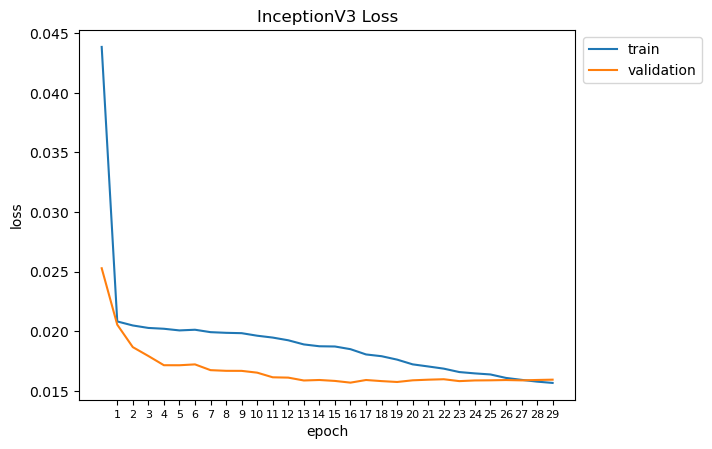

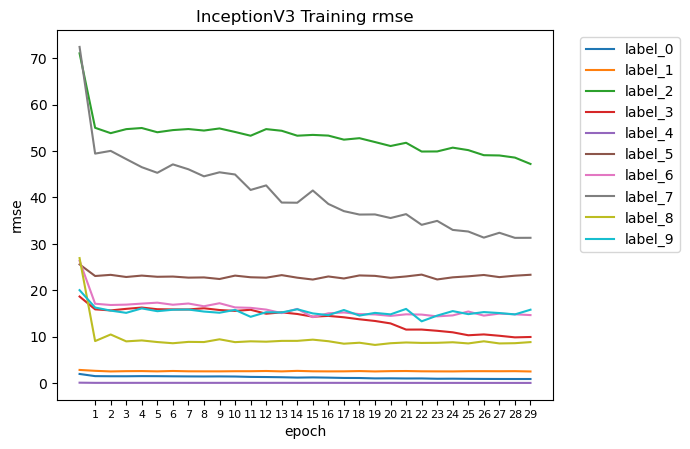

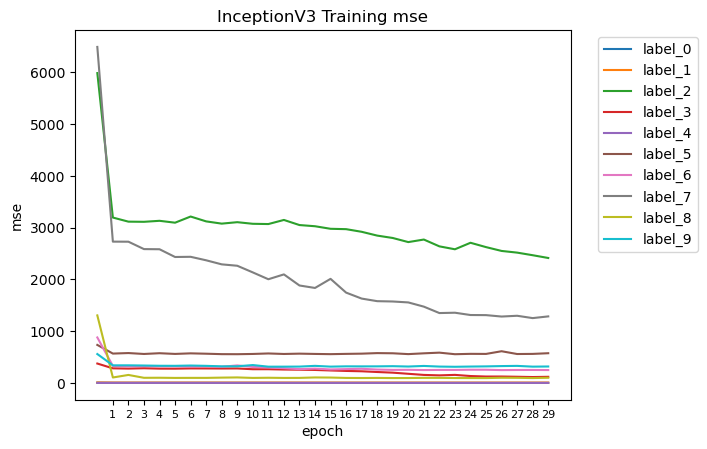

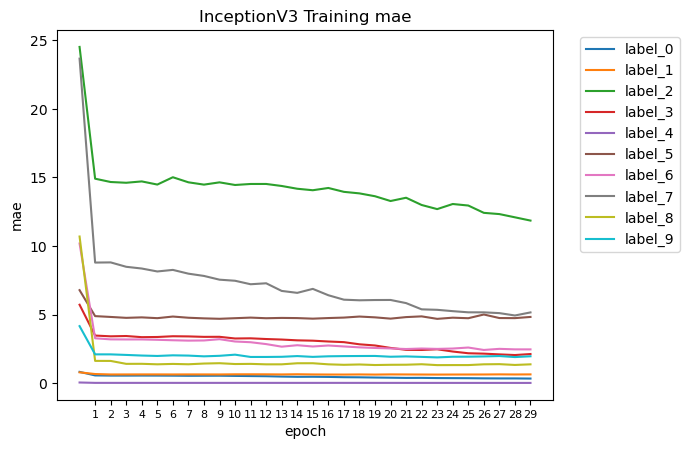

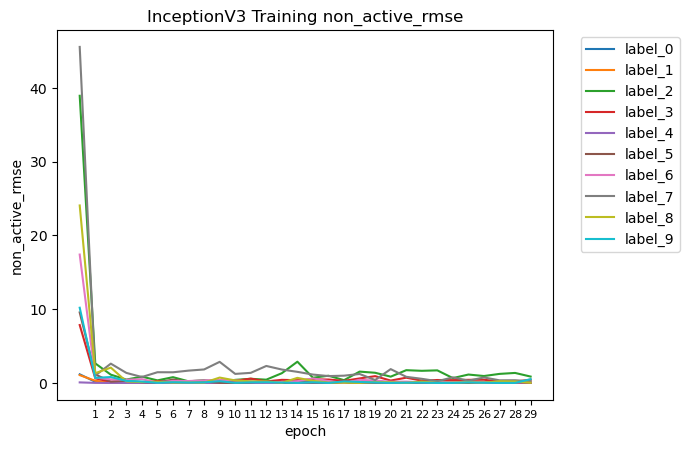

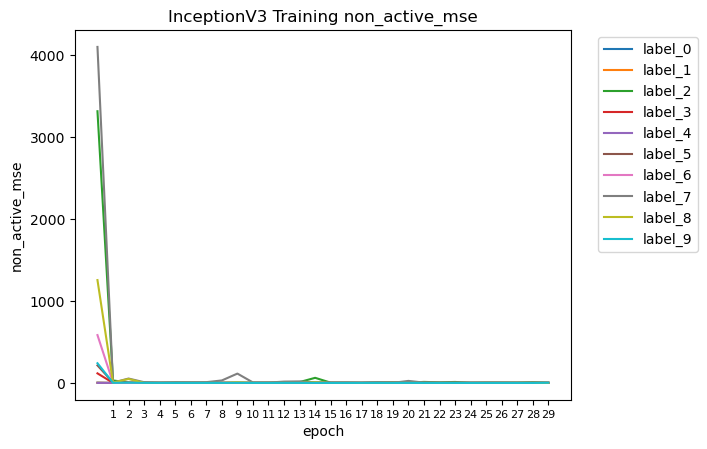

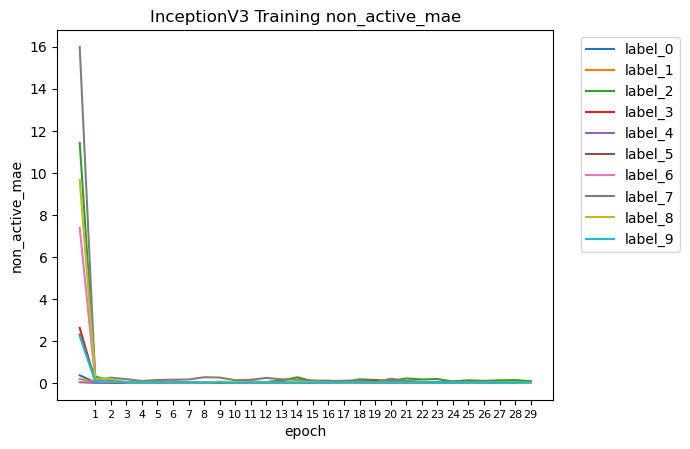

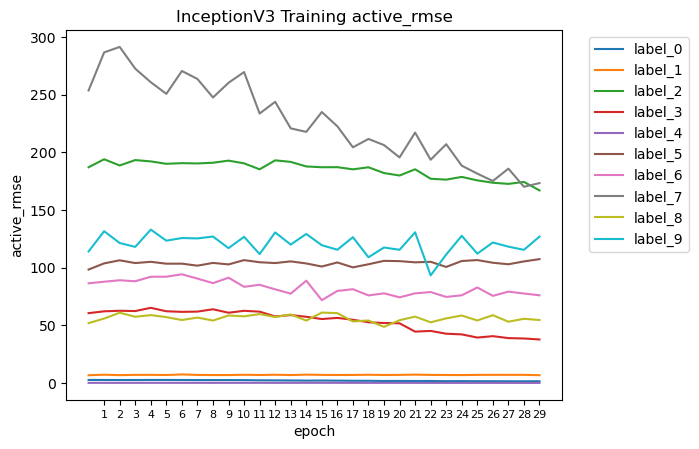

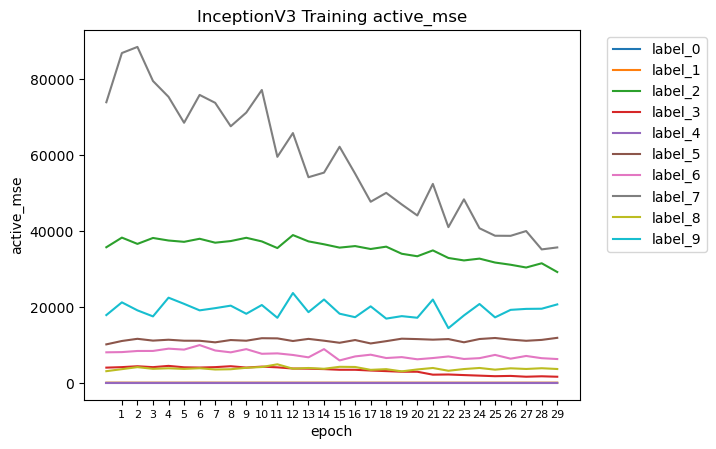

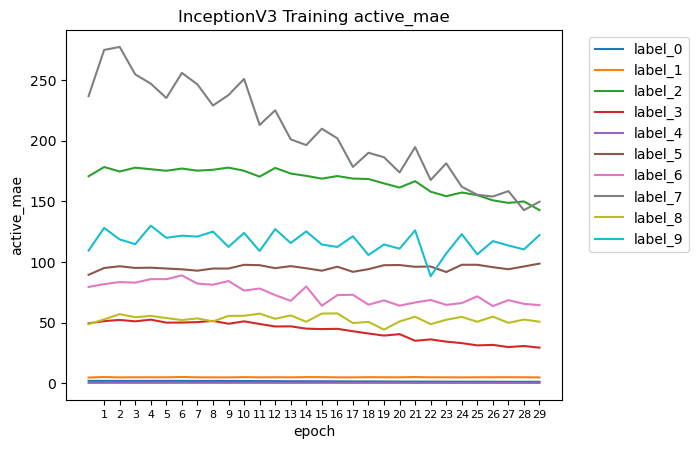

In [ ]:
plot('InceptionV3', history2, num_of_preds, data = '', num_of_batches = len(train_ds))

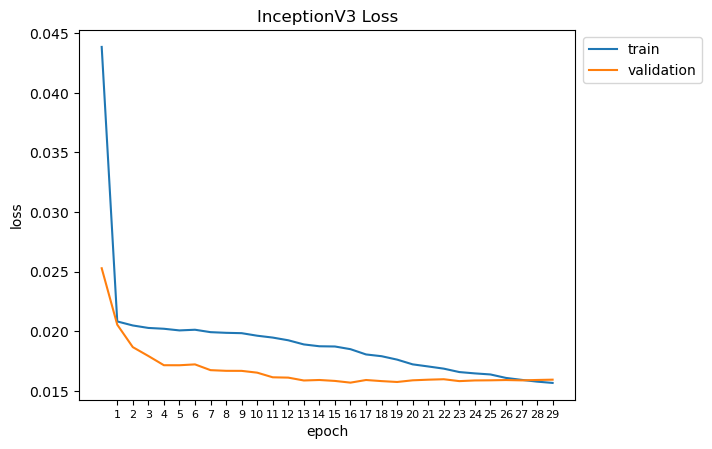

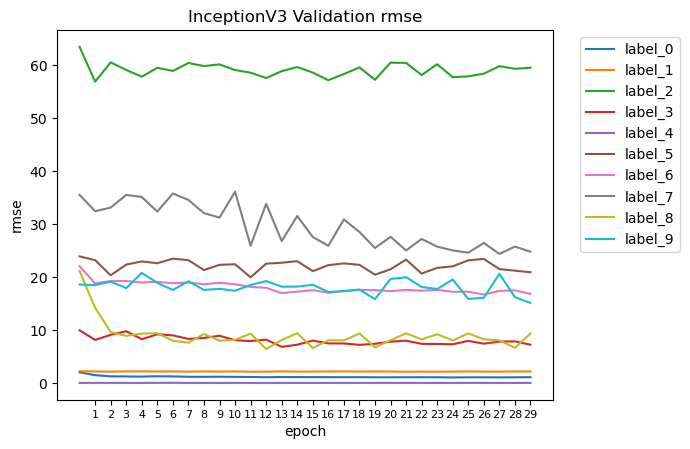

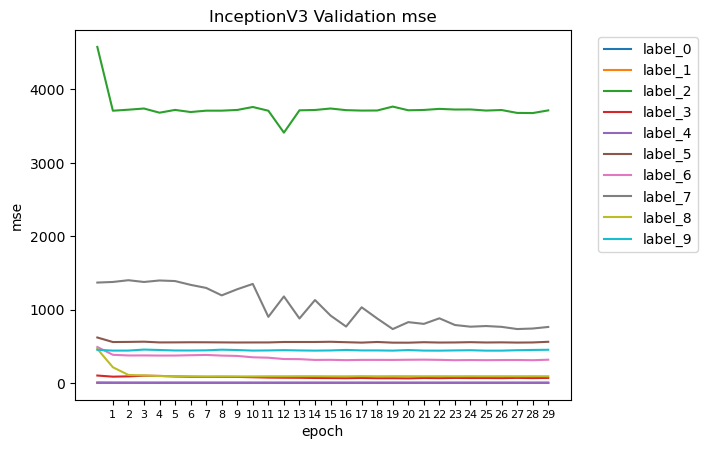

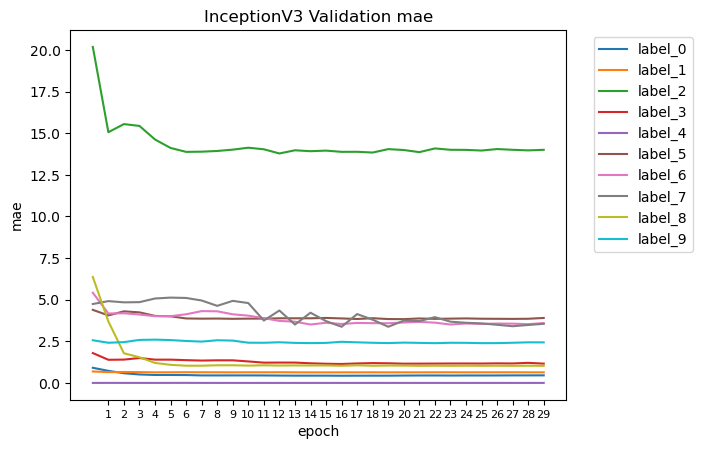

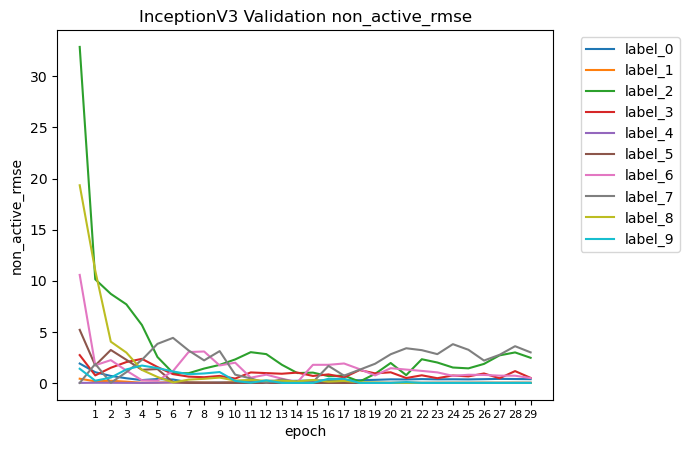

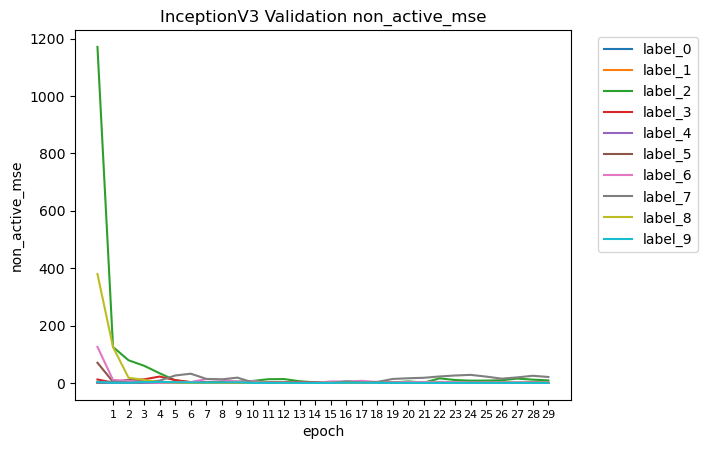

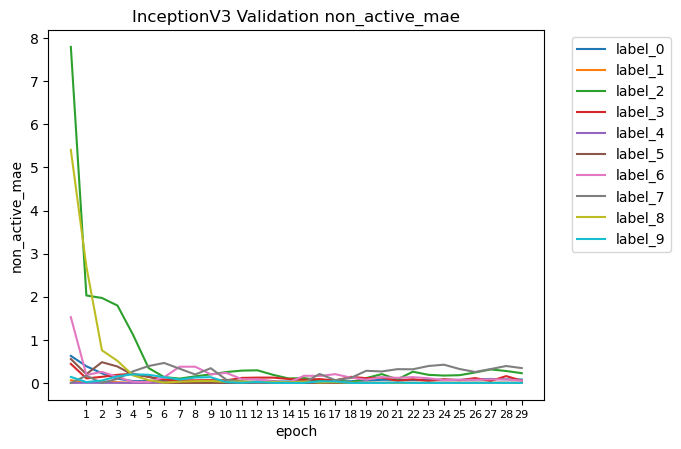

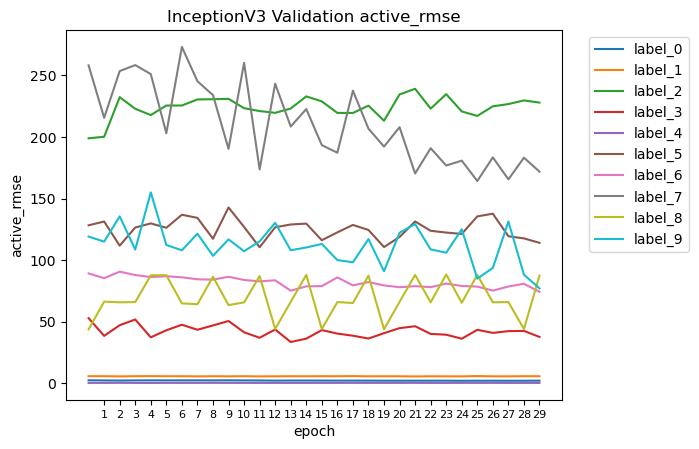

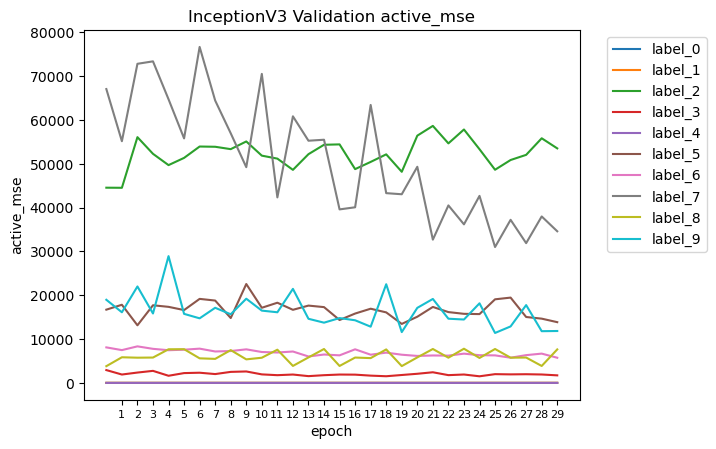

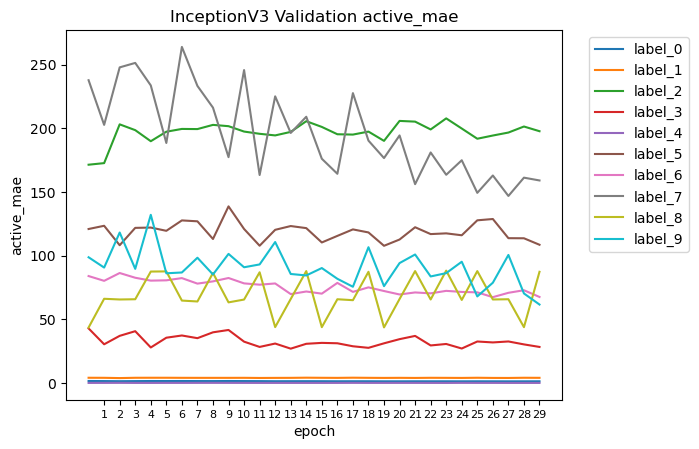

In [ ]:
plot('InceptionV3', history2, num_of_preds, data = 'val_', num_of_batches = len(val_ds)) 

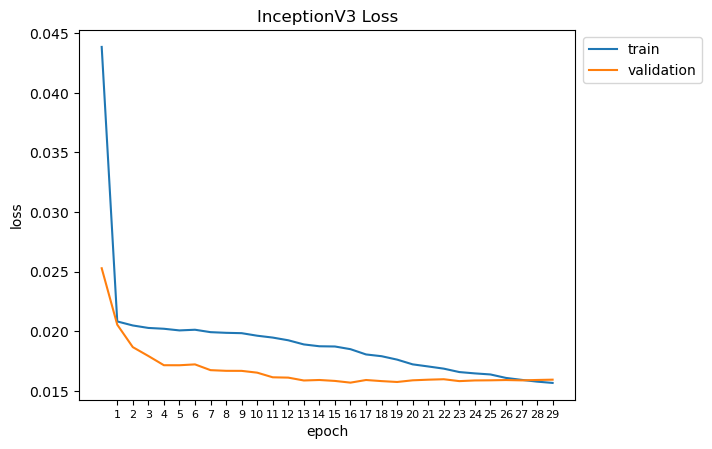

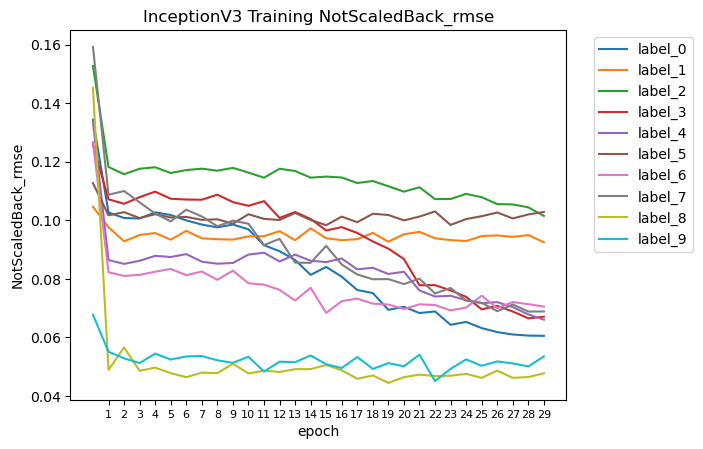

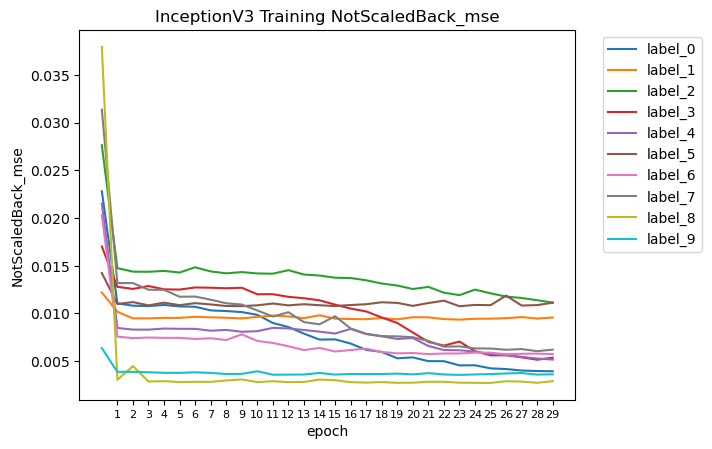

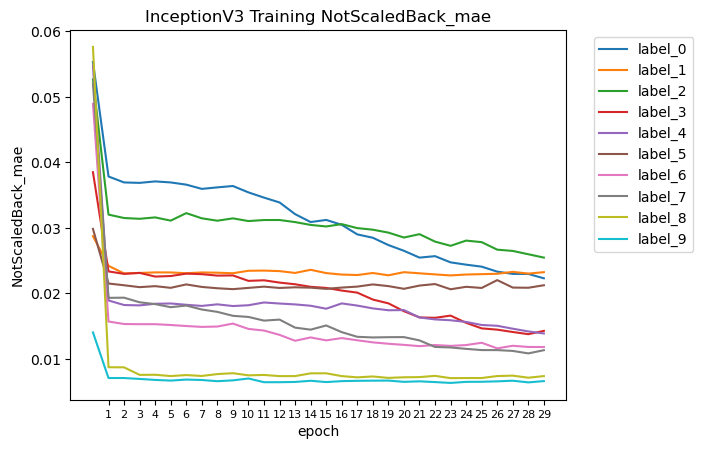

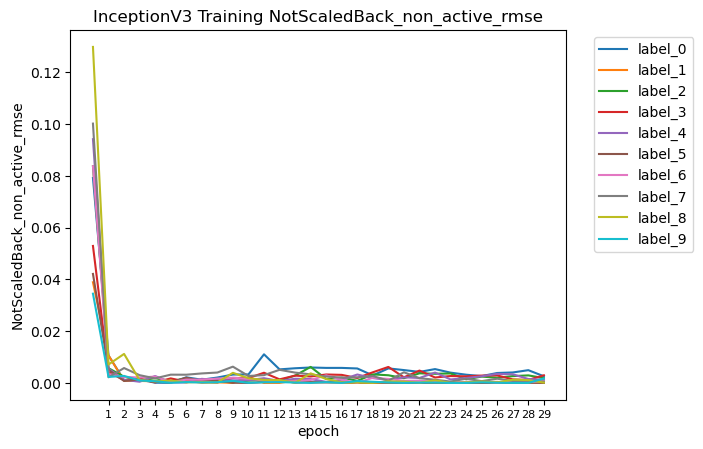

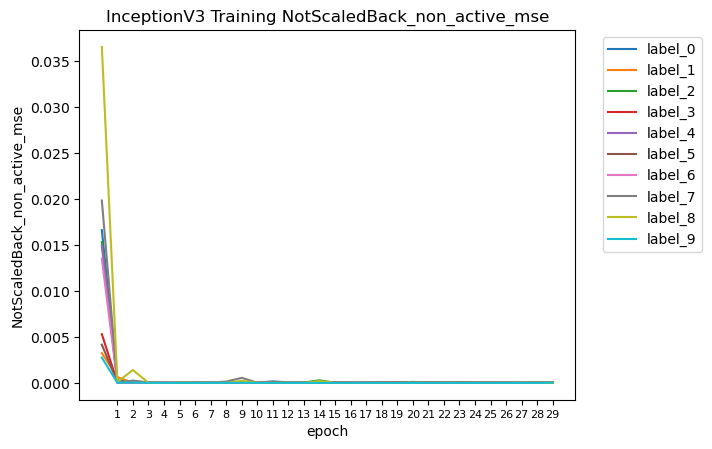

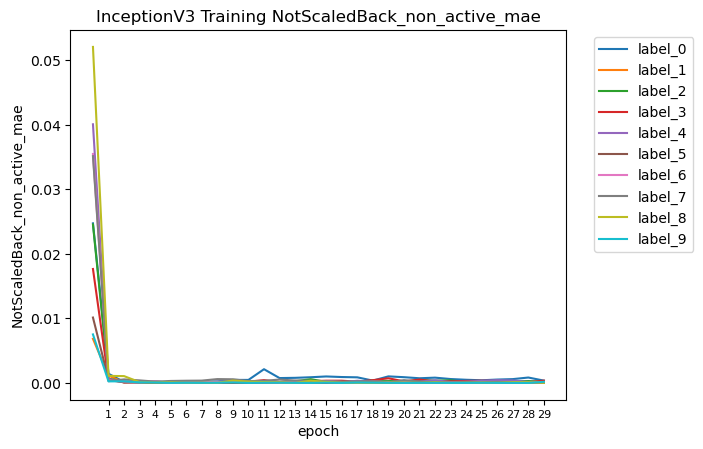

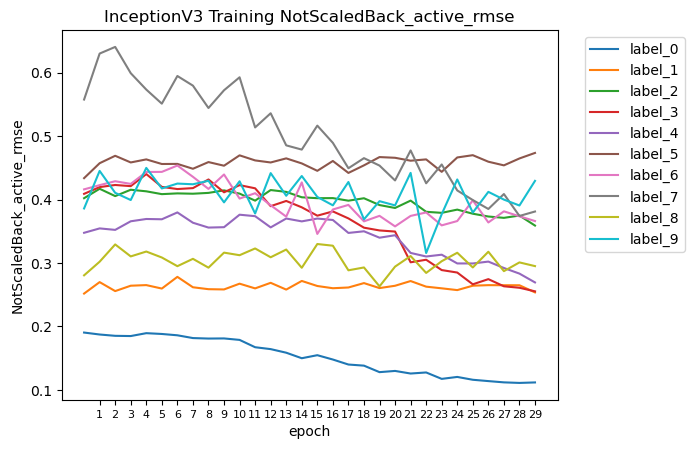

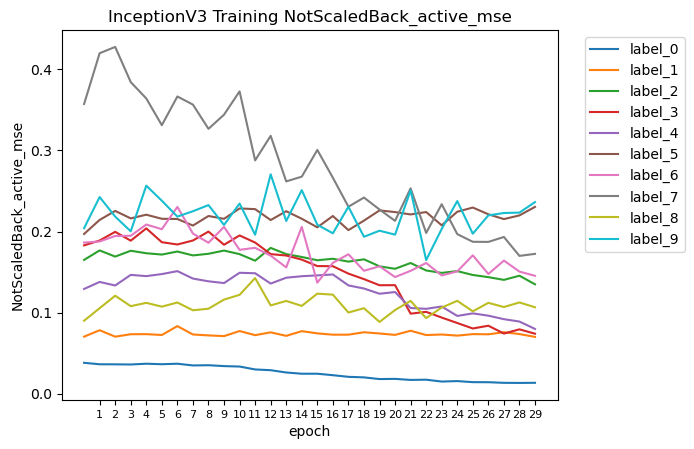

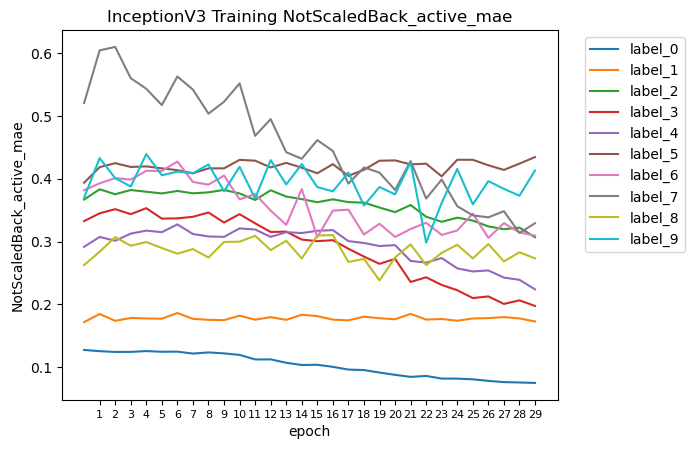

In [ ]:
plot('InceptionV3', history2, num_of_preds, data = '', num_of_batches = len(train_ds), NotScaledBack = True)

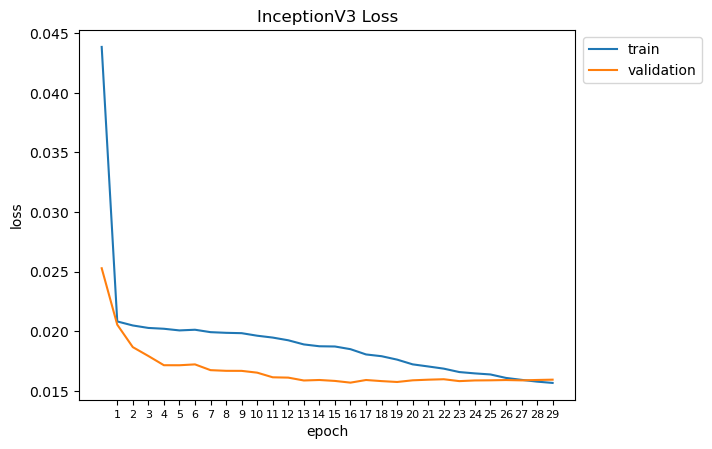

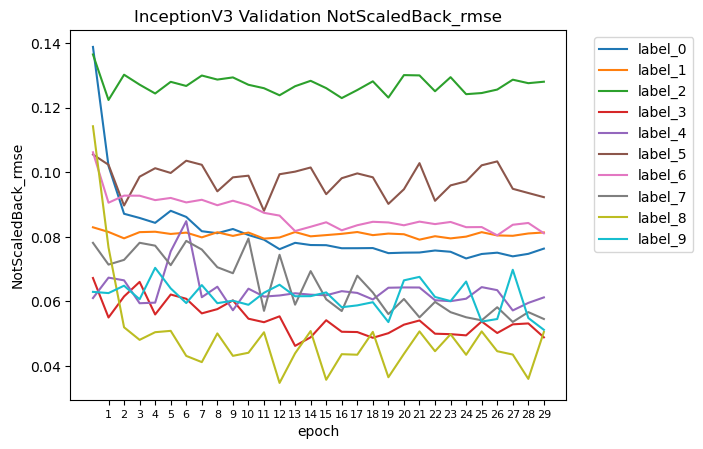

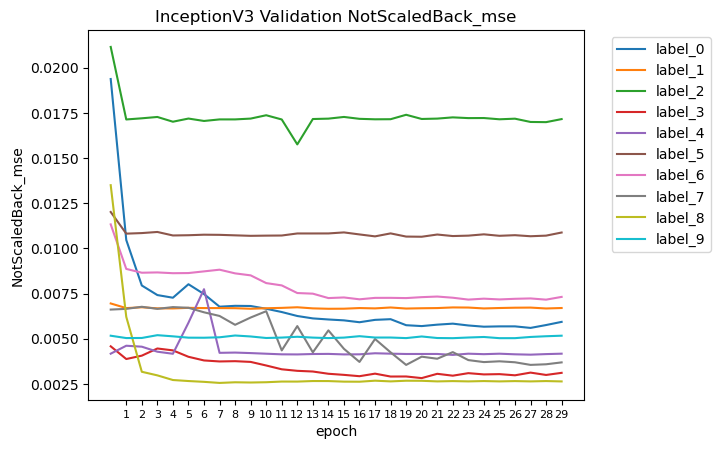

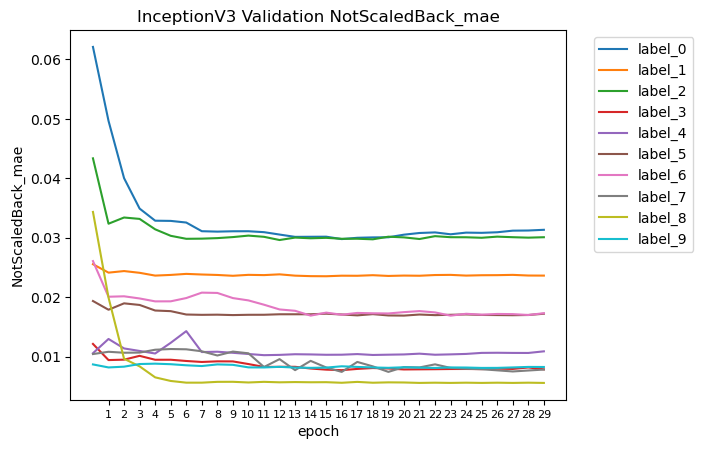

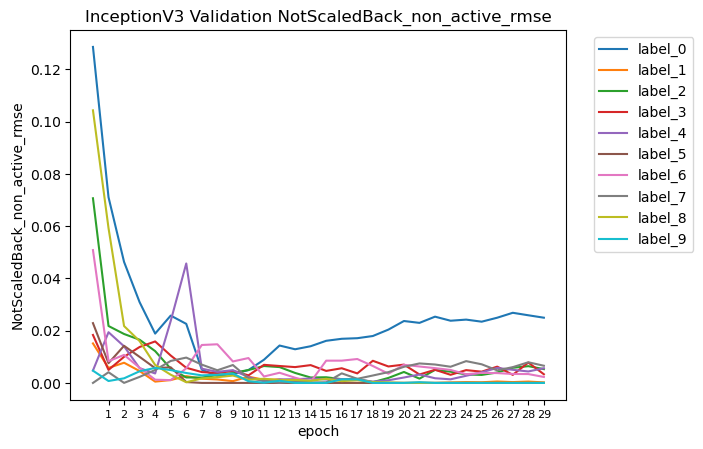

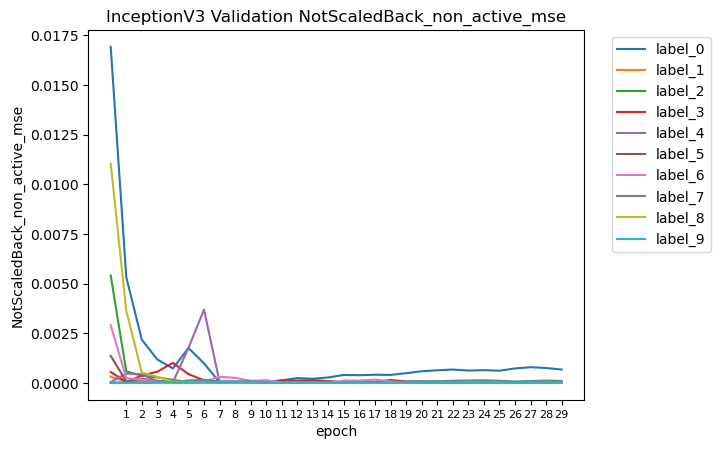

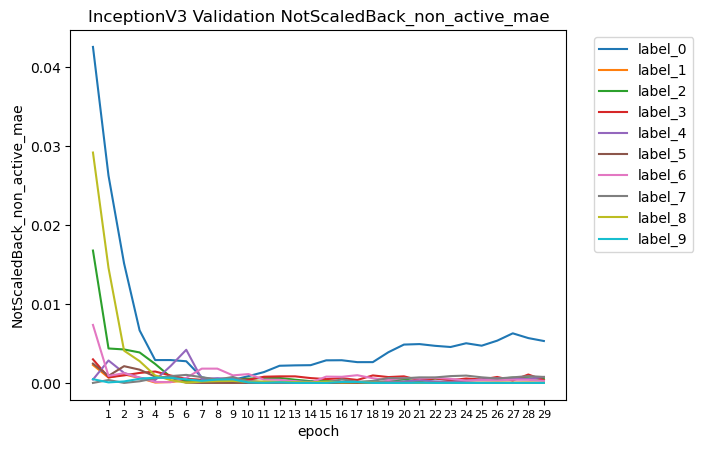

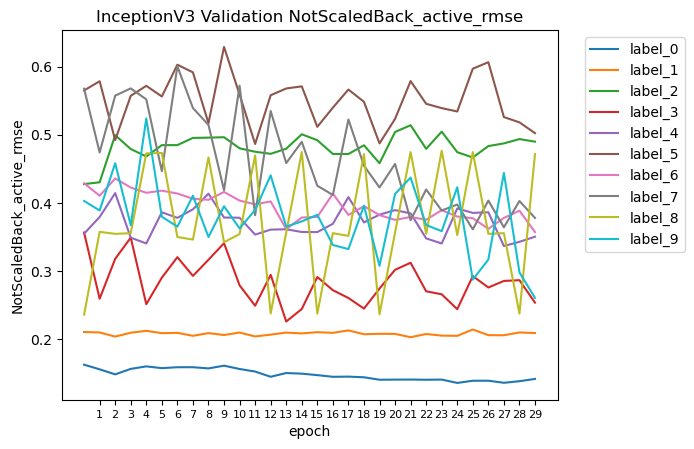

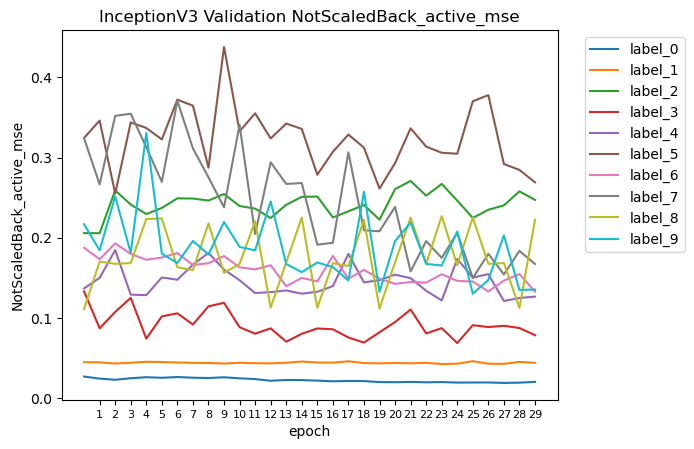

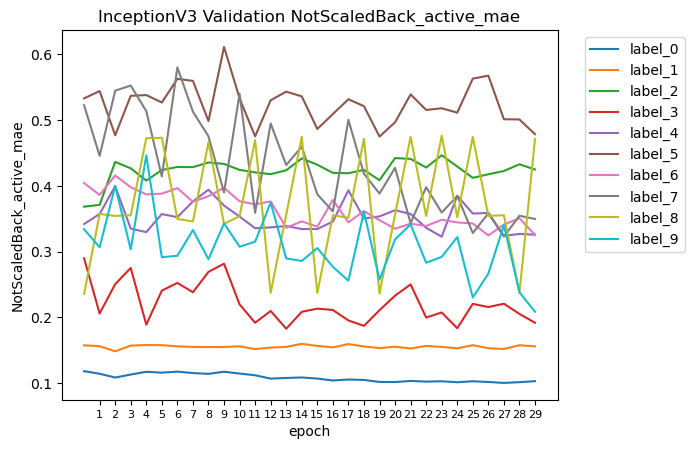

In [ ]:
plot('InceptionV3', history2, num_of_preds, data = 'val_', num_of_batches = len(val_ds), NotScaledBack = True)

**MSE**

In [ ]:
# cosine decay learning rate
lr_decayed_fn = tf.keras.experimental.CosineDecay(initial_learning_rate=0.0001, decay_steps=1000)
optimizer_adam_cos_decay = tf.keras.optimizers.Adam(learning_rate=lr_decayed_fn)

tf.keras.backend.clear_session()
    
model4 = tf.keras.models.Sequential([
            InceptionV3(input_shape = input_shape, include_top=False, weights='imagenet',  pooling = "avg"),
            tf.keras.layers.Dense(num_of_preds, activation = 'relu')
        ])    

model4.compile(
            loss = tf.keras.losses.MeanSquaredError(tf.keras.losses.Reduction.SUM_OVER_BATCH_SIZE), #mean mse per sample
            optimizer = optimizer_adam_cos_decay,
            metrics = [[self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all',name = 'rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', name = 'mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', name = 'mae_' + str(i)) for i in range(10)],                
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', name = 'non_active_mae_' + str(i)) for i in range(10)],
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', name = 'active_mae_' + str(i)) for i in range(10)], 
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False,name = 'NotScaledBack_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False, name = 'NotScaledBack_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'all', scale=False, name = 'NotScaledBack_mae_' + str(i)) for i in range(10)],                
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'zero', scale=False, name = 'NotScaledBack_non_active_mae_' + str(i)) for i in range(10)],
                [self_RMSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_rmse_' + str(i)) for i in range(10)],
                [self_MSE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_mse_' + str(i)) for i in range(10)],
                [self_MAE(class_id = i, std_by_label = std_by_label, mean_by_label = mean_by_label, value = 'positive', scale=False, name = 'NotScaledBack_active_mae_' + str(i)) for i in range(10)]], 
            run_eagerly=True)

start_time = time.time()
history4 = model4.fit(train_ds, validation_data = val_ds, epochs=EPOCHS)
end_time = time.time()
print('Time takes to train:'.format(EPOCHS), end_time - start_time)

Epoch 1/30
22/22 [==============================] - 62s 3s/step - loss: 0.0189 - rmse_0: 40.4496 - rmse_1: 77.3129 - rmse_2: 1275.3499 - rmse_3: 428.2629 - rmse_4: 2.7822 - rmse_5: 672.3398 - rmse_6: 415.9411 - rmse_7: 1153.0817 - rmse_8: 437.5413 - rmse_9: 587.8911 - mse_0: 83.1968 - mse_1: 315.6155 - mse_2: 78424.6094 - mse_3: 9061.1299 - mse_4: 0.5398 - mse_5: 22755.6289 - mse_6: 8441.4033 - mse_7: 68369.5469 - mse_8: 13822.0088 - mse_9: 19661.1465 - mae_0: 18.3880 - mae_1: 29.7153 - mae_2: 384.4308 - mae_3: 144.5138 - mae_4: 1.3539 - mae_5: 241.1213 - mae_6: 104.3287 - mae_7: 242.0484 - mae_8: 184.9480 - mae_9: 170.0341 - non_active_rmse_0: 23.5746 - non_active_rmse_1: 49.2533 - non_active_rmse_2: 415.4458 - non_active_rmse_3: 223.9302 - non_active_rmse_4: 2.1714 - non_active_rmse_5: 438.1316 - non_active_rmse_6: 170.9829 - non_active_rmse_7: 345.7426 - non_active_rmse_8: 366.7448 - non_active_rmse_9: 434.9429 - non_active_mse_0: 43.9778 - non_active_mse_1: 198.9314 - non_active_ms

Epoch 2/30
22/22 [==============================] - 61s 3s/step - loss: 0.0096 - rmse_0: 32.8393 - rmse_1: 57.0842 - rmse_2: 1216.0465 - rmse_3: 336.0594 - rmse_4: 1.4245 - rmse_5: 509.0174 - rmse_6: 385.1191 - rmse_7: 1109.7311 - rmse_8: 215.0038 - rmse_9: 388.6451 - mse_0: 52.7028 - mse_1: 159.9238 - mse_2: 70293.0156 - mse_3: 5928.6719 - mse_4: 0.1054 - mse_5: 12624.4561 - mse_6: 7230.9707 - mse_7: 59558.5508 - mse_8: 2461.2017 - mse_9: 8232.5977 - mae_0: 12.3814 - mae_1: 15.3594 - mae_2: 340.1227 - mae_3: 86.7648 - mae_4: 0.3322 - mae_5: 123.6802 - mae_6: 75.8502 - mae_7: 191.6032 - mae_8: 42.4788 - mae_9: 62.2965 - non_active_rmse_0: 4.3855 - non_active_rmse_1: 9.4110 - non_active_rmse_2: 111.2016 - non_active_rmse_3: 80.3002 - non_active_rmse_4: 0.2225 - non_active_rmse_5: 104.8178 - non_active_rmse_6: 60.1025 - non_active_rmse_7: 58.7767 - non_active_rmse_8: 56.5708 - non_active_rmse_9: 103.7020 - non_active_mse_0: 1.7906 - non_active_mse_1: 8.0131 - non_active_mse_2: 745.3267 -

Epoch 3/30
22/22 [==============================] - 62s 3s/step - loss: 0.0092 - rmse_0: 33.2462 - rmse_1: 56.2482 - rmse_2: 1194.2430 - rmse_3: 326.8395 - rmse_4: 1.4645 - rmse_5: 502.3328 - rmse_6: 371.6370 - rmse_7: 1097.6815 - rmse_8: 201.5670 - rmse_9: 358.4667 - mse_0: 52.3803 - mse_1: 151.7644 - mse_2: 68665.8281 - mse_3: 5264.1182 - mse_4: 0.1062 - mse_5: 12499.6211 - mse_6: 7577.8008 - mse_7: 58264.2070 - mse_8: 2202.2000 - mse_9: 7391.3208 - mae_0: 12.2848 - mae_1: 14.2348 - mae_2: 334.0890 - mae_3: 83.0561 - mae_4: 0.3562 - mae_5: 114.2274 - mae_6: 76.2036 - mae_7: 187.9832 - mae_8: 34.6712 - mae_9: 47.2405 - non_active_rmse_0: 2.4152 - non_active_rmse_1: 4.4067 - non_active_rmse_2: 108.0560 - non_active_rmse_3: 85.0129 - non_active_rmse_4: 0.2691 - non_active_rmse_5: 65.6081 - non_active_rmse_6: 34.6163 - non_active_rmse_7: 43.1126 - non_active_rmse_8: 33.8307 - non_active_rmse_9: 28.7975 - non_active_mse_0: 0.4575 - non_active_mse_1: 1.7641 - non_active_mse_2: 860.3056 - n

Epoch 4/30
22/22 [==============================] - 61s 3s/step - loss: 0.0089 - rmse_0: 32.3422 - rmse_1: 55.6610 - rmse_2: 1211.5670 - rmse_3: 297.5933 - rmse_4: 1.4606 - rmse_5: 494.0341 - rmse_6: 365.4810 - rmse_7: 1087.5814 - rmse_8: 198.0770 - rmse_9: 337.3008 - mse_0: 51.3739 - mse_1: 154.8407 - mse_2: 68530.9219 - mse_3: 4445.2622 - mse_4: 0.1043 - mse_5: 11918.5273 - mse_6: 7065.5645 - mse_7: 57403.5039 - mse_8: 2177.7275 - mse_9: 7434.8306 - mae_0: 12.1259 - mae_1: 14.6956 - mae_2: 326.5095 - mae_3: 81.3086 - mae_4: 0.3729 - mae_5: 114.4241 - mae_6: 72.6006 - mae_7: 184.6203 - mae_8: 35.6043 - mae_9: 48.0755 - non_active_rmse_0: 2.4120 - non_active_rmse_1: 5.9415 - non_active_rmse_2: 45.1783 - non_active_rmse_3: 106.1267 - non_active_rmse_4: 0.3206 - non_active_rmse_5: 64.9436 - non_active_rmse_6: 29.2332 - non_active_rmse_7: 19.0882 - non_active_rmse_8: 39.2650 - non_active_rmse_9: 41.8940 - non_active_mse_0: 0.4771 - non_active_mse_1: 2.1776 - non_active_mse_2: 181.3440 - n

Epoch 5/30
22/22 [==============================] - 61s 3s/step - loss: 0.0086 - rmse_0: 32.8149 - rmse_1: 56.5773 - rmse_2: 1186.9092 - rmse_3: 269.4833 - rmse_4: 1.4643 - rmse_5: 480.4247 - rmse_6: 362.5507 - rmse_7: 1033.4169 - rmse_8: 206.8229 - rmse_9: 355.0710 - mse_0: 52.8121 - mse_1: 157.3801 - mse_2: 67312.7812 - mse_3: 3570.0706 - mse_4: 0.1060 - mse_5: 11528.8984 - mse_6: 7312.1221 - mse_7: 57635.3047 - mse_8: 2158.2117 - mse_9: 7631.5430 - mae_0: 12.2077 - mae_1: 15.2317 - mae_2: 322.7526 - mae_3: 68.3834 - mae_4: 0.3405 - mae_5: 119.9352 - mae_6: 74.3432 - mae_7: 189.8567 - mae_8: 32.9695 - mae_9: 47.8338 - non_active_rmse_0: 3.0126 - non_active_rmse_1: 8.9149 - non_active_rmse_2: 59.2326 - non_active_rmse_3: 88.4241 - non_active_rmse_4: 0.2124 - non_active_rmse_5: 90.3528 - non_active_rmse_6: 23.2433 - non_active_rmse_7: 61.3706 - non_active_rmse_8: 25.1093 - non_active_rmse_9: 24.8530 - non_active_mse_0: 0.6280 - non_active_mse_1: 4.3641 - non_active_mse_2: 312.0798 - no

Epoch 6/30
22/22 [==============================] - 61s 3s/step - loss: 0.0084 - rmse_0: 33.3040 - rmse_1: 53.9891 - rmse_2: 1202.8582 - rmse_3: 235.8010 - rmse_4: 1.4160 - rmse_5: 472.4030 - rmse_6: 370.4125 - rmse_7: 1063.3483 - rmse_8: 198.3831 - rmse_9: 336.6614 - mse_0: 52.7071 - mse_1: 144.8183 - mse_2: 68654.7266 - mse_3: 2763.8508 - mse_4: 0.0999 - mse_5: 11086.9141 - mse_6: 6938.1074 - mse_7: 55796.4219 - mse_8: 2189.4243 - mse_9: 7300.3384 - mae_0: 12.3719 - mae_1: 14.5940 - mae_2: 331.9527 - mae_3: 63.8042 - mae_4: 0.3798 - mae_5: 106.6879 - mae_6: 70.9569 - mae_7: 183.7387 - mae_8: 32.1596 - mae_9: 45.1697 - non_active_rmse_0: 3.5574 - non_active_rmse_1: 9.6890 - non_active_rmse_2: 100.2033 - non_active_rmse_3: 87.0309 - non_active_rmse_4: 0.3757 - non_active_rmse_5: 57.7524 - non_active_rmse_6: 24.0498 - non_active_rmse_7: 35.0243 - non_active_rmse_8: 16.9059 - non_active_rmse_9: 20.9699 - non_active_mse_0: 1.0916 - non_active_mse_1: 5.4623 - non_active_mse_2: 647.7670 - n

Epoch 7/30
22/22 [==============================] - 61s 3s/step - loss: 0.0080 - rmse_0: 32.1064 - rmse_1: 53.8302 - rmse_2: 1167.5718 - rmse_3: 206.0288 - rmse_4: 1.3824 - rmse_5: 474.3143 - rmse_6: 368.6104 - rmse_7: 1070.3298 - rmse_8: 201.4855 - rmse_9: 350.0775 - mse_0: 49.0330 - mse_1: 137.0328 - mse_2: 65584.5703 - mse_3: 2061.9834 - mse_4: 0.0941 - mse_5: 11204.6836 - mse_6: 6928.2515 - mse_7: 58082.9062 - mse_8: 2174.3542 - mse_9: 7350.2012 - mae_0: 12.0785 - mae_1: 14.5415 - mae_2: 328.0690 - mae_3: 53.0670 - mae_4: 0.3286 - mae_5: 113.7563 - mae_6: 73.8204 - mae_7: 193.2730 - mae_8: 32.1083 - mae_9: 46.5196 - non_active_rmse_0: 5.2270 - non_active_rmse_1: 10.8563 - non_active_rmse_2: 125.9516 - non_active_rmse_3: 67.8410 - non_active_rmse_4: 0.2304 - non_active_rmse_5: 90.0723 - non_active_rmse_6: 50.1978 - non_active_rmse_7: 56.1334 - non_active_rmse_8: 21.6592 - non_active_rmse_9: 28.0194 - non_active_mse_0: 1.6636 - non_active_mse_1: 5.9590 - non_active_mse_2: 1095.4116 -

Epoch 8/30
22/22 [==============================] - 62s 3s/step - loss: 0.0078 - rmse_0: 31.4802 - rmse_1: 51.4749 - rmse_2: 1178.0576 - rmse_3: 204.2883 - rmse_4: 1.3129 - rmse_5: 469.3636 - rmse_6: 365.0029 - rmse_7: 997.1251 - rmse_8: 214.1658 - rmse_9: 352.7835 - mse_0: 47.1789 - mse_1: 129.2645 - mse_2: 65496.6719 - mse_3: 1968.0112 - mse_4: 0.0861 - mse_5: 10908.3525 - mse_6: 6633.4111 - mse_7: 55978.9570 - mse_8: 2253.7349 - mse_9: 7665.8687 - mae_0: 12.2703 - mae_1: 13.7844 - mae_2: 326.1114 - mae_3: 50.8037 - mae_4: 0.3428 - mae_5: 110.9193 - mae_6: 69.1502 - mae_7: 190.9800 - mae_8: 33.5519 - mae_9: 48.7389 - non_active_rmse_0: 7.2652 - non_active_rmse_1: 10.0209 - non_active_rmse_2: 133.5025 - non_active_rmse_3: 55.0312 - non_active_rmse_4: 0.3222 - non_active_rmse_5: 94.8206 - non_active_rmse_6: 25.3089 - non_active_rmse_7: 77.0012 - non_active_rmse_8: 21.3159 - non_active_rmse_9: 34.2844 - non_active_mse_0: 2.8857 - non_active_mse_1: 5.6823 - non_active_mse_2: 1341.3701 - 

Epoch 9/30
22/22 [==============================] - 61s 3s/step - loss: 0.0076 - rmse_0: 31.4589 - rmse_1: 51.2121 - rmse_2: 1161.7439 - rmse_3: 202.3503 - rmse_4: 1.2878 - rmse_5: 456.5096 - rmse_6: 354.9874 - rmse_7: 991.6921 - rmse_8: 202.6072 - rmse_9: 363.7758 - mse_0: 47.1076 - mse_1: 128.4402 - mse_2: 64041.2266 - mse_3: 1975.4656 - mse_4: 0.0831 - mse_5: 10358.5889 - mse_6: 6444.6616 - mse_7: 53235.9688 - mse_8: 2230.4622 - mse_9: 7377.2891 - mae_0: 12.0967 - mae_1: 13.8163 - mae_2: 319.6047 - mae_3: 50.2568 - mae_4: 0.3111 - mae_5: 106.7339 - mae_6: 68.5352 - mae_7: 183.8172 - mae_8: 33.7286 - mae_9: 48.1556 - non_active_rmse_0: 6.7440 - non_active_rmse_1: 10.3368 - non_active_rmse_2: 110.5785 - non_active_rmse_3: 50.6666 - non_active_rmse_4: 0.2700 - non_active_rmse_5: 83.0172 - non_active_rmse_6: 23.5378 - non_active_rmse_7: 73.2410 - non_active_rmse_8: 20.0510 - non_active_rmse_9: 40.4577 - non_active_mse_0: 2.6058 - non_active_mse_1: 6.8711 - non_active_mse_2: 720.4429 - n

Epoch 10/30
22/22 [==============================] - 61s 3s/step - loss: 0.0073 - rmse_0: 29.6963 - rmse_1: 49.3448 - rmse_2: 1151.7980 - rmse_3: 194.4762 - rmse_4: 1.2344 - rmse_5: 433.2384 - rmse_6: 352.3882 - rmse_7: 1009.5682 - rmse_8: 198.3246 - rmse_9: 352.7204 - mse_0: 42.6449 - mse_1: 117.3818 - mse_2: 62876.1094 - mse_3: 1795.2893 - mse_4: 0.0774 - mse_5: 9860.6768 - mse_6: 6147.2930 - mse_7: 53919.4141 - mse_8: 2164.1987 - mse_9: 7281.6733 - mae_0: 11.8475 - mae_1: 13.1832 - mae_2: 330.8901 - mae_3: 46.5313 - mae_4: 0.3294 - mae_5: 100.2329 - mae_6: 67.4545 - mae_7: 181.3161 - mae_8: 32.4689 - mae_9: 44.5891 - non_active_rmse_0: 7.9430 - non_active_rmse_1: 10.7016 - non_active_rmse_2: 209.7030 - non_active_rmse_3: 36.8358 - non_active_rmse_4: 0.3814 - non_active_rmse_5: 75.3782 - non_active_rmse_6: 30.1153 - non_active_rmse_7: 62.7645 - non_active_rmse_8: 21.9768 - non_active_rmse_9: 17.1075 - non_active_mse_0: 3.2133 - non_active_mse_1: 6.3115 - non_active_mse_2: 3294.1699 -

Epoch 11/30
22/22 [==============================] - 61s 3s/step - loss: 0.0069 - rmse_0: 29.3779 - rmse_1: 48.9768 - rmse_2: 1073.5540 - rmse_3: 181.1892 - rmse_4: 1.2147 - rmse_5: 452.1681 - rmse_6: 359.8667 - rmse_7: 1029.3920 - rmse_8: 195.2266 - rmse_9: 343.5272 - mse_0: 42.5906 - mse_1: 113.1709 - mse_2: 55535.0312 - mse_3: 1554.9473 - mse_4: 0.0737 - mse_5: 10005.6338 - mse_6: 6204.8750 - mse_7: 52664.8438 - mse_8: 2157.3047 - mse_9: 7834.9761 - mae_0: 11.5637 - mae_1: 13.3404 - mae_2: 314.9626 - mae_3: 43.4949 - mae_4: 0.2880 - mae_5: 96.1223 - mae_6: 70.2789 - mae_7: 178.4748 - mae_8: 32.0080 - mae_9: 47.6856 - non_active_rmse_0: 6.4427 - non_active_rmse_1: 11.6722 - non_active_rmse_2: 233.9418 - non_active_rmse_3: 39.9260 - non_active_rmse_4: 0.2237 - non_active_rmse_5: 48.7694 - non_active_rmse_6: 43.6367 - non_active_rmse_7: 50.0711 - non_active_rmse_8: 16.7888 - non_active_rmse_9: 16.3187 - non_active_mse_0: 2.4327 - non_active_mse_1: 8.0804 - non_active_mse_2: 2909.4927 -

Epoch 12/30
22/22 [==============================] - 62s 3s/step - loss: 0.0066 - rmse_0: 28.0576 - rmse_1: 46.1858 - rmse_2: 1028.1569 - rmse_3: 188.3030 - rmse_4: 1.1572 - rmse_5: 444.5637 - rmse_6: 336.5916 - rmse_7: 987.8536 - rmse_8: 200.9483 - rmse_9: 333.7260 - mse_0: 38.9817 - mse_1: 101.7387 - mse_2: 52155.4180 - mse_3: 1739.1562 - mse_4: 0.0680 - mse_5: 9475.6270 - mse_6: 5789.7783 - mse_7: 49716.2656 - mse_8: 2113.8564 - mse_9: 7534.9976 - mae_0: 11.2107 - mae_1: 13.0364 - mae_2: 308.2947 - mae_3: 45.3522 - mae_4: 0.2890 - mae_5: 98.2389 - mae_6: 63.8416 - mae_7: 180.3531 - mae_8: 30.4046 - mae_9: 45.5895 - non_active_rmse_0: 7.1623 - non_active_rmse_1: 11.1483 - non_active_rmse_2: 243.1143 - non_active_rmse_3: 54.5504 - non_active_rmse_4: 0.3160 - non_active_rmse_5: 76.7376 - non_active_rmse_6: 22.3261 - non_active_rmse_7: 113.1535 - non_active_rmse_8: 7.6417 - non_active_rmse_9: 12.4813 - non_active_mse_0: 2.8171 - non_active_mse_1: 7.9564 - non_active_mse_2: 3105.2742 - n

Epoch 13/30
22/22 [==============================] - 61s 3s/step - loss: 0.0063 - rmse_0: 27.3758 - rmse_1: 42.6847 - rmse_2: 966.8032 - rmse_3: 176.7684 - rmse_4: 1.1316 - rmse_5: 424.6426 - rmse_6: 333.9516 - rmse_7: 933.5905 - rmse_8: 196.9075 - rmse_9: 366.6547 - mse_0: 36.5425 - mse_1: 90.4000 - mse_2: 47009.0195 - mse_3: 1545.4006 - mse_4: 0.0668 - mse_5: 9155.1387 - mse_6: 5749.2012 - mse_7: 47090.4336 - mse_8: 2115.2896 - mse_9: 7283.6538 - mae_0: 10.9914 - mae_1: 11.5151 - mae_2: 287.3458 - mae_3: 41.5530 - mae_4: 0.2804 - mae_5: 93.8544 - mae_6: 63.1199 - mae_7: 175.7099 - mae_8: 30.5155 - mae_9: 44.7026 - non_active_rmse_0: 6.9405 - non_active_rmse_1: 9.1840 - non_active_rmse_2: 242.2547 - non_active_rmse_3: 26.0592 - non_active_rmse_4: 0.3003 - non_active_rmse_5: 73.3704 - non_active_rmse_6: 17.3971 - non_active_rmse_7: 114.6300 - non_active_rmse_8: 10.8820 - non_active_rmse_9: 15.4591 - non_active_mse_0: 3.2803 - non_active_mse_1: 5.4210 - non_active_mse_2: 3016.3733 - non

Epoch 14/30
22/22 [==============================] - 61s 3s/step - loss: 0.0059 - rmse_0: 26.2897 - rmse_1: 41.3374 - rmse_2: 946.4488 - rmse_3: 170.2445 - rmse_4: 1.0739 - rmse_5: 415.7115 - rmse_6: 347.5487 - rmse_7: 945.3425 - rmse_8: 186.3073 - rmse_9: 328.6500 - mse_0: 33.4683 - mse_1: 85.3111 - mse_2: 43853.8359 - mse_3: 1513.7238 - mse_4: 0.0554 - mse_5: 8551.6865 - mse_6: 5825.6313 - mse_7: 44524.7266 - mse_8: 2098.5198 - mse_9: 7302.4194 - mae_0: 10.5980 - mae_1: 11.3019 - mae_2: 269.2988 - mae_3: 41.1039 - mae_4: 0.2523 - mae_5: 92.1418 - mae_6: 63.7166 - mae_7: 169.3684 - mae_8: 30.7897 - mae_9: 44.8174 - non_active_rmse_0: 6.5987 - non_active_rmse_1: 9.4486 - non_active_rmse_2: 204.3579 - non_active_rmse_3: 41.2697 - non_active_rmse_4: 0.2966 - non_active_rmse_5: 77.2432 - non_active_rmse_6: 17.2382 - non_active_rmse_7: 114.4900 - non_active_rmse_8: 12.5318 - non_active_rmse_9: 14.9372 - non_active_mse_0: 2.4283 - non_active_mse_1: 5.8730 - non_active_mse_2: 2204.6274 - non

Epoch 15/30
22/22 [==============================] - 59s 3s/step - loss: 0.0057 - rmse_0: 25.4661 - rmse_1: 40.0654 - rmse_2: 914.8242 - rmse_3: 169.5777 - rmse_4: 1.0611 - rmse_5: 398.0652 - rmse_6: 332.2585 - rmse_7: 931.0329 - rmse_8: 207.5703 - rmse_9: 354.6128 - mse_0: 31.8833 - mse_1: 78.2645 - mse_2: 40453.5938 - mse_3: 1422.3580 - mse_4: 0.0578 - mse_5: 7994.2280 - mse_6: 5720.6851 - mse_7: 45872.6641 - mse_8: 2156.0649 - mse_9: 7314.5957 - mae_0: 10.0577 - mae_1: 10.9168 - mae_2: 262.8546 - mae_3: 40.3818 - mae_4: 0.2700 - mae_5: 85.8799 - mae_6: 63.6546 - mae_7: 169.4036 - mae_8: 31.3655 - mae_9: 44.9820 - non_active_rmse_0: 5.2597 - non_active_rmse_1: 9.9270 - non_active_rmse_2: 233.6788 - non_active_rmse_3: 35.9319 - non_active_rmse_4: 0.3508 - non_active_rmse_5: 62.1358 - non_active_rmse_6: 23.7266 - non_active_rmse_7: 83.3701 - non_active_rmse_8: 8.8542 - non_active_rmse_9: 16.9512 - non_active_mse_0: 1.5079 - non_active_mse_1: 5.9158 - non_active_mse_2: 3013.0916 - non_a

Epoch 16/30
22/22 [==============================] - 58s 3s/step - loss: 0.0053 - rmse_0: 24.2107 - rmse_1: 37.0071 - rmse_2: 877.7225 - rmse_3: 164.9696 - rmse_4: 0.9755 - rmse_5: 392.3419 - rmse_6: 343.7218 - rmse_7: 896.5918 - rmse_8: 187.0866 - rmse_9: 336.8055 - mse_0: 28.3758 - mse_1: 67.0283 - mse_2: 37144.2070 - mse_3: 1344.8456 - mse_4: 0.0477 - mse_5: 7928.1274 - mse_6: 5907.1860 - mse_7: 41604.6641 - mse_8: 2059.8506 - mse_9: 8201.1875 - mae_0: 9.5726 - mae_1: 9.9851 - mae_2: 246.9438 - mae_3: 38.2742 - mae_4: 0.2256 - mae_5: 88.5264 - mae_6: 63.9823 - mae_7: 153.2433 - mae_8: 29.5820 - mae_9: 49.2693 - non_active_rmse_0: 5.0015 - non_active_rmse_1: 9.0859 - non_active_rmse_2: 209.9005 - non_active_rmse_3: 30.1994 - non_active_rmse_4: 0.2351 - non_active_rmse_5: 95.2906 - non_active_rmse_6: 20.2443 - non_active_rmse_7: 65.2209 - non_active_rmse_8: 7.1753 - non_active_rmse_9: 24.5022 - non_active_mse_0: 1.3711 - non_active_mse_1: 4.6139 - non_active_mse_2: 2564.0996 - non_act

Epoch 17/30
22/22 [==============================] - 58s 3s/step - loss: 0.0051 - rmse_0: 23.3599 - rmse_1: 36.1457 - rmse_2: 811.1476 - rmse_3: 158.1508 - rmse_4: 0.9594 - rmse_5: 384.6669 - rmse_6: 329.9630 - rmse_7: 892.2936 - rmse_8: 199.4754 - rmse_9: 356.6070 - mse_0: 26.9654 - mse_1: 64.3749 - mse_2: 32519.6738 - mse_3: 1279.9877 - mse_4: 0.0487 - mse_5: 7616.1738 - mse_6: 5583.9492 - mse_7: 40085.9219 - mse_8: 2154.3992 - mse_9: 7703.2495 - mae_0: 9.3642 - mae_1: 9.2895 - mae_2: 219.6322 - mae_3: 36.8218 - mae_4: 0.2184 - mae_5: 79.2996 - mae_6: 62.3839 - mae_7: 156.6406 - mae_8: 30.9411 - mae_9: 47.3662 - non_active_rmse_0: 4.3491 - non_active_rmse_1: 6.2306 - non_active_rmse_2: 188.8536 - non_active_rmse_3: 29.5076 - non_active_rmse_4: 0.1482 - non_active_rmse_5: 36.4034 - non_active_rmse_6: 23.4649 - non_active_rmse_7: 113.7079 - non_active_rmse_8: 9.5625 - non_active_rmse_9: 20.7015 - non_active_mse_0: 1.0259 - non_active_mse_1: 2.7382 - non_active_mse_2: 2066.3757 - non_ac

Epoch 18/30
22/22 [==============================] - 58s 3s/step - loss: 0.0050 - rmse_0: 23.9353 - rmse_1: 35.7906 - rmse_2: 807.8701 - rmse_3: 159.5315 - rmse_4: 0.9578 - rmse_5: 392.9672 - rmse_6: 342.8696 - rmse_7: 857.3347 - rmse_8: 194.9080 - rmse_9: 351.3336 - mse_0: 28.9962 - mse_1: 62.0011 - mse_2: 32307.5820 - mse_3: 1242.7753 - mse_4: 0.0490 - mse_5: 7585.1309 - mse_6: 5729.7725 - mse_7: 38260.5938 - mse_8: 2085.6230 - mse_9: 7214.4404 - mae_0: 9.4273 - mae_1: 9.4583 - mae_2: 222.5134 - mae_3: 35.6878 - mae_4: 0.2181 - mae_5: 79.3401 - mae_6: 64.7048 - mae_7: 139.4715 - mae_8: 30.7532 - mae_9: 43.5568 - non_active_rmse_0: 5.7693 - non_active_rmse_1: 8.8134 - non_active_rmse_2: 214.7858 - non_active_rmse_3: 25.4266 - non_active_rmse_4: 0.2012 - non_active_rmse_5: 43.5919 - non_active_rmse_6: 27.3730 - non_active_rmse_7: 40.8988 - non_active_rmse_8: 11.9372 - non_active_rmse_9: 10.8821 - non_active_mse_0: 2.0299 - non_active_mse_1: 5.2159 - non_active_mse_2: 2439.8677 - non_ac

Epoch 19/30
22/22 [==============================] - 58s 3s/step - loss: 0.0048 - rmse_0: 22.9215 - rmse_1: 34.9776 - rmse_2: 767.1581 - rmse_3: 161.2281 - rmse_4: 0.9005 - rmse_5: 392.0284 - rmse_6: 327.3661 - rmse_7: 846.9127 - rmse_8: 199.7056 - rmse_9: 350.7240 - mse_0: 24.8390 - mse_1: 61.1150 - mse_2: 29029.8496 - mse_3: 1299.5208 - mse_4: 0.0403 - mse_5: 7584.3096 - mse_6: 5501.8335 - mse_7: 36919.2461 - mse_8: 2109.4636 - mse_9: 7279.3599 - mae_0: 9.0003 - mae_1: 9.1169 - mae_2: 198.6999 - mae_3: 36.8469 - mae_4: 0.2131 - mae_5: 83.7899 - mae_6: 62.2826 - mae_7: 137.5754 - mae_8: 32.1441 - mae_9: 43.9144 - non_active_rmse_0: 4.5965 - non_active_rmse_1: 6.6133 - non_active_rmse_2: 169.6952 - non_active_rmse_3: 28.9872 - non_active_rmse_4: 0.2269 - non_active_rmse_5: 61.9819 - non_active_rmse_6: 27.5370 - non_active_rmse_7: 52.2483 - non_active_rmse_8: 23.5486 - non_active_rmse_9: 8.0012 - non_active_mse_0: 1.3626 - non_active_mse_1: 3.1226 - non_active_mse_2: 1537.1925 - non_act

Epoch 20/30
22/22 [==============================] - 59s 3s/step - loss: 0.0046 - rmse_0: 22.2962 - rmse_1: 34.6173 - rmse_2: 739.4684 - rmse_3: 158.2973 - rmse_4: 0.8910 - rmse_5: 373.2957 - rmse_6: 320.5933 - rmse_7: 821.0733 - rmse_8: 192.1364 - rmse_9: 346.8447 - mse_0: 24.5787 - mse_1: 59.6224 - mse_2: 27782.8281 - mse_3: 1284.1064 - mse_4: 0.0396 - mse_5: 7003.0508 - mse_6: 5170.9551 - mse_7: 35358.3828 - mse_8: 2066.4246 - mse_9: 7362.9727 - mae_0: 8.9913 - mae_1: 9.0715 - mae_2: 195.0608 - mae_3: 35.4200 - mae_4: 0.2012 - mae_5: 75.2373 - mae_6: 60.8585 - mae_7: 135.1704 - mae_8: 30.5656 - mae_9: 44.8964 - non_active_rmse_0: 5.1381 - non_active_rmse_1: 6.8352 - non_active_rmse_2: 178.9099 - non_active_rmse_3: 21.4885 - non_active_rmse_4: 0.2059 - non_active_rmse_5: 37.2619 - non_active_rmse_6: 34.0047 - non_active_rmse_7: 51.9468 - non_active_rmse_8: 13.5975 - non_active_rmse_9: 15.8694 - non_active_mse_0: 1.5047 - non_active_mse_1: 3.0210 - non_active_mse_2: 1841.9075 - non_ac

Epoch 21/30
22/22 [==============================] - 58s 3s/step - loss: 0.0045 - rmse_0: 21.2656 - rmse_1: 32.5401 - rmse_2: 754.8649 - rmse_3: 145.9597 - rmse_4: 0.8994 - rmse_5: 371.3035 - rmse_6: 327.8171 - rmse_7: 846.8181 - rmse_8: 189.3783 - rmse_9: 338.2073 - mse_0: 22.7380 - mse_1: 53.2872 - mse_2: 28160.1387 - mse_3: 1110.2855 - mse_4: 0.0407 - mse_5: 7120.6392 - mse_6: 5052.4893 - mse_7: 35817.0508 - mse_8: 2085.1965 - mse_9: 7220.3271 - mae_0: 8.6036 - mae_1: 8.1548 - mae_2: 191.6637 - mae_3: 32.2713 - mae_4: 0.2015 - mae_5: 77.7699 - mae_6: 59.3792 - mae_7: 133.2085 - mae_8: 29.6371 - mae_9: 42.6866 - non_active_rmse_0: 4.6307 - non_active_rmse_1: 4.9207 - non_active_rmse_2: 144.6985 - non_active_rmse_3: 21.0823 - non_active_rmse_4: 0.1560 - non_active_rmse_5: 53.8443 - non_active_rmse_6: 25.8609 - non_active_rmse_7: 57.0876 - non_active_rmse_8: 4.7060 - non_active_rmse_9: 1.7118 - non_active_mse_0: 1.2884 - non_active_mse_1: 1.6551 - non_active_mse_2: 1242.6367 - non_acti

Epoch 22/30
22/22 [==============================] - 58s 3s/step - loss: 0.0044 - rmse_0: 20.4783 - rmse_1: 32.5141 - rmse_2: 709.4158 - rmse_3: 143.2718 - rmse_4: 0.8650 - rmse_5: 360.9903 - rmse_6: 300.6837 - rmse_7: 760.9292 - rmse_8: 193.3755 - rmse_9: 344.6124 - mse_0: 20.9472 - mse_1: 52.7153 - mse_2: 25325.7480 - mse_3: 1101.9083 - mse_4: 0.0375 - mse_5: 6787.4717 - mse_6: 4754.2915 - mse_7: 34779.0352 - mse_8: 2103.7241 - mse_9: 7213.2935 - mae_0: 8.3673 - mae_1: 8.2162 - mae_2: 182.6004 - mae_3: 32.6898 - mae_4: 0.1924 - mae_5: 73.0616 - mae_6: 56.3580 - mae_7: 132.6799 - mae_8: 30.3738 - mae_9: 43.0051 - non_active_rmse_0: 4.1895 - non_active_rmse_1: 4.7305 - non_active_rmse_2: 168.8689 - non_active_rmse_3: 20.7045 - non_active_rmse_4: 0.1400 - non_active_rmse_5: 37.3837 - non_active_rmse_6: 16.9217 - non_active_rmse_7: 32.6339 - non_active_rmse_8: 13.0005 - non_active_rmse_9: 3.5413 - non_active_mse_0: 1.1489 - non_active_mse_1: 1.4767 - non_active_mse_2: 1638.6196 - non_act

Epoch 23/30
22/22 [==============================] - 58s 3s/step - loss: 0.0043 - rmse_0: 20.2429 - rmse_1: 30.9399 - rmse_2: 706.9221 - rmse_3: 146.8917 - rmse_4: 0.7733 - rmse_5: 361.0149 - rmse_6: 308.6985 - rmse_7: 811.8553 - rmse_8: 193.7668 - rmse_9: 342.2514 - mse_0: 19.8488 - mse_1: 49.0153 - mse_2: 25106.7520 - mse_3: 1149.0513 - mse_4: 0.0319 - mse_5: 6727.2983 - mse_6: 4753.8560 - mse_7: 34879.9258 - mse_8: 2021.6304 - mse_9: 7277.1431 - mae_0: 7.9926 - mae_1: 7.8621 - mae_2: 172.7128 - mae_3: 33.0795 - mae_4: 0.1712 - mae_5: 73.0662 - mae_6: 57.5061 - mae_7: 130.0748 - mae_8: 29.2141 - mae_9: 43.3018 - non_active_rmse_0: 4.6840 - non_active_rmse_1: 6.4410 - non_active_rmse_2: 145.4370 - non_active_rmse_3: 19.4696 - non_active_rmse_4: 0.1325 - non_active_rmse_5: 48.5235 - non_active_rmse_6: 22.0234 - non_active_rmse_7: 45.5172 - non_active_rmse_8: 9.1434 - non_active_rmse_9: 0.0000e+00 - non_active_mse_0: 1.3188 - non_active_mse_1: 2.4363 - non_active_mse_2: 1246.4487 - non_

Epoch 24/30
22/22 [==============================] - 58s 3s/step - loss: 0.0042 - rmse_0: 19.8734 - rmse_1: 30.7919 - rmse_2: 674.9858 - rmse_3: 150.0618 - rmse_4: 0.7981 - rmse_5: 361.1934 - rmse_6: 304.7430 - rmse_7: 787.7681 - rmse_8: 199.6267 - rmse_9: 352.6595 - mse_0: 19.4148 - mse_1: 48.8952 - mse_2: 23664.1230 - mse_3: 1169.3724 - mse_4: 0.0319 - mse_5: 6607.9683 - mse_6: 4605.0371 - mse_7: 34933.4219 - mse_8: 2154.8979 - mse_9: 7383.9951 - mae_0: 8.0238 - mae_1: 7.8513 - mae_2: 161.7677 - mae_3: 33.0261 - mae_4: 0.1751 - mae_5: 72.9778 - mae_6: 56.7537 - mae_7: 131.7065 - mae_8: 30.5343 - mae_9: 45.0998 - non_active_rmse_0: 4.0083 - non_active_rmse_1: 5.6124 - non_active_rmse_2: 125.8675 - non_active_rmse_3: 17.7994 - non_active_rmse_4: 0.1692 - non_active_rmse_5: 45.5856 - non_active_rmse_6: 26.4233 - non_active_rmse_7: 46.0176 - non_active_rmse_8: 6.1234 - non_active_rmse_9: 7.0165 - non_active_mse_0: 0.9365 - non_active_mse_1: 1.8744 - non_active_mse_2: 1009.6865 - non_acti

Epoch 25/30
22/22 [==============================] - 58s 3s/step - loss: 0.0041 - rmse_0: 19.1667 - rmse_1: 30.8943 - rmse_2: 685.9138 - rmse_3: 149.3810 - rmse_4: 0.7697 - rmse_5: 366.7975 - rmse_6: 288.6631 - rmse_7: 776.6862 - rmse_8: 192.7529 - rmse_9: 300.3920 - mse_0: 17.9128 - mse_1: 49.3987 - mse_2: 23383.3359 - mse_3: 1212.1639 - mse_4: 0.0311 - mse_5: 6599.8418 - mse_6: 4353.5010 - mse_7: 35855.6406 - mse_8: 2079.4976 - mse_9: 7178.0869 - mae_0: 7.7595 - mae_1: 8.0057 - mae_2: 170.7871 - mae_3: 34.0959 - mae_4: 0.1689 - mae_5: 75.6864 - mae_6: 54.3615 - mae_7: 130.7517 - mae_8: 29.9981 - mae_9: 42.3007 - non_active_rmse_0: 3.7138 - non_active_rmse_1: 6.7577 - non_active_rmse_2: 175.1557 - non_active_rmse_3: 27.3024 - non_active_rmse_4: 0.1204 - non_active_rmse_5: 65.9817 - non_active_rmse_6: 23.0066 - non_active_rmse_7: 50.0322 - non_active_rmse_8: 8.4548 - non_active_rmse_9: 1.9037 - non_active_mse_0: 0.8821 - non_active_mse_1: 2.7186 - non_active_mse_2: 1801.1125 - non_acti

Epoch 26/30
22/22 [==============================] - 59s 3s/step - loss: 0.0040 - rmse_0: 18.7431 - rmse_1: 30.5549 - rmse_2: 646.8410 - rmse_3: 149.5259 - rmse_4: 0.7746 - rmse_5: 346.8777 - rmse_6: 301.7082 - rmse_7: 801.5695 - rmse_8: 195.1252 - rmse_9: 354.2137 - mse_0: 17.4392 - mse_1: 46.9130 - mse_2: 20965.7695 - mse_3: 1117.5771 - mse_4: 0.0316 - mse_5: 6299.2290 - mse_6: 4376.5508 - mse_7: 34871.5234 - mse_8: 2005.3779 - mse_9: 7276.3062 - mae_0: 7.5928 - mae_1: 7.4983 - mae_2: 147.7520 - mae_3: 31.7690 - mae_4: 0.1779 - mae_5: 72.4885 - mae_6: 53.9451 - mae_7: 131.2514 - mae_8: 28.3164 - mae_9: 43.7742 - non_active_rmse_0: 3.3742 - non_active_rmse_1: 3.8102 - non_active_rmse_2: 87.3029 - non_active_rmse_3: 16.8820 - non_active_rmse_4: 0.1544 - non_active_rmse_5: 61.6739 - non_active_rmse_6: 16.2974 - non_active_rmse_7: 58.4195 - non_active_rmse_8: 1.2666 - non_active_rmse_9: 6.3659 - non_active_mse_0: 0.7326 - non_active_mse_1: 1.1043 - non_active_mse_2: 505.7782 - non_active

Epoch 27/30
22/22 [==============================] - 58s 3s/step - loss: 0.0039 - rmse_0: 18.8194 - rmse_1: 29.4506 - rmse_2: 626.9031 - rmse_3: 149.9499 - rmse_4: 0.7714 - rmse_5: 338.4911 - rmse_6: 295.0346 - rmse_7: 802.4587 - rmse_8: 189.1581 - rmse_9: 334.0965 - mse_0: 17.3220 - mse_1: 44.8611 - mse_2: 21214.3320 - mse_3: 1136.6187 - mse_4: 0.0310 - mse_5: 6065.7700 - mse_6: 4462.1641 - mse_7: 34211.4258 - mse_8: 2009.1384 - mse_9: 7199.1157 - mae_0: 7.7672 - mae_1: 7.1648 - mae_2: 153.6470 - mae_3: 32.2183 - mae_4: 0.1636 - mae_5: 66.1919 - mae_6: 55.2702 - mae_7: 124.3148 - mae_8: 28.8284 - mae_9: 43.0457 - non_active_rmse_0: 3.8206 - non_active_rmse_1: 4.2393 - non_active_rmse_2: 137.5946 - non_active_rmse_3: 21.5187 - non_active_rmse_4: 0.1312 - non_active_rmse_5: 37.7552 - non_active_rmse_6: 16.2806 - non_active_rmse_7: 21.8946 - non_active_rmse_8: 7.5213 - non_active_rmse_9: 7.5677 - non_active_mse_0: 0.8746 - non_active_mse_1: 1.3759 - non_active_mse_2: 1058.9556 - non_acti

Epoch 28/30
22/22 [==============================] - 58s 3s/step - loss: 0.0039 - rmse_0: 18.4509 - rmse_1: 29.7558 - rmse_2: 624.7872 - rmse_3: 148.5269 - rmse_4: 0.7992 - rmse_5: 326.7644 - rmse_6: 304.0729 - rmse_7: 777.7527 - rmse_8: 190.9692 - rmse_9: 334.4887 - mse_0: 16.7962 - mse_1: 46.2787 - mse_2: 20329.0625 - mse_3: 1084.8657 - mse_4: 0.0319 - mse_5: 5727.3198 - mse_6: 4615.6899 - mse_7: 33889.4961 - mse_8: 2027.6909 - mse_9: 7177.8213 - mae_0: 7.5943 - mae_1: 7.4829 - mae_2: 145.0741 - mae_3: 31.3554 - mae_4: 0.1694 - mae_5: 65.6726 - mae_6: 55.4343 - mae_7: 125.9792 - mae_8: 29.7891 - mae_9: 43.4532 - non_active_rmse_0: 4.1580 - non_active_rmse_1: 4.5732 - non_active_rmse_2: 111.9620 - non_active_rmse_3: 15.9158 - non_active_rmse_4: 0.1484 - non_active_rmse_5: 43.6904 - non_active_rmse_6: 20.9544 - non_active_rmse_7: 24.8968 - non_active_rmse_8: 7.1506 - non_active_rmse_9: 9.7747 - non_active_mse_0: 1.0431 - non_active_mse_1: 1.5390 - non_active_mse_2: 848.4037 - non_activ

Epoch 29/30
22/22 [==============================] - 61s 3s/step - loss: 0.0039 - rmse_0: 18.1885 - rmse_1: 29.6441 - rmse_2: 612.9836 - rmse_3: 144.1392 - rmse_4: 0.7705 - rmse_5: 336.8715 - rmse_6: 291.2919 - rmse_7: 785.8018 - rmse_8: 177.0941 - rmse_9: 302.1262 - mse_0: 16.1059 - mse_1: 47.4947 - mse_2: 20028.4141 - mse_3: 1085.7706 - mse_4: 0.0296 - mse_5: 5818.3765 - mse_6: 4291.4360 - mse_7: 34353.5625 - mse_8: 2014.4156 - mse_9: 7182.7295 - mae_0: 7.4410 - mae_1: 7.4805 - mae_2: 152.5436 - mae_3: 32.5851 - mae_4: 0.1579 - mae_5: 67.0998 - mae_6: 52.5438 - mae_7: 125.8879 - mae_8: 28.8048 - mae_9: 42.4984 - non_active_rmse_0: 4.1632 - non_active_rmse_1: 3.4510 - non_active_rmse_2: 151.8638 - non_active_rmse_3: 22.1961 - non_active_rmse_4: 0.1000 - non_active_rmse_5: 43.8551 - non_active_rmse_6: 18.4783 - non_active_rmse_7: 25.9038 - non_active_rmse_8: 3.3476 - non_active_rmse_9: 2.9737 - non_active_mse_0: 1.0404 - non_active_mse_1: 0.8052 - non_active_mse_2: 1399.2717 - non_acti

Epoch 30/30
22/22 [==============================] - 61s 3s/step - loss: 0.0038 - rmse_0: 17.5940 - rmse_1: 29.5154 - rmse_2: 601.7313 - rmse_3: 153.4903 - rmse_4: 0.7384 - rmse_5: 325.1128 - rmse_6: 286.3320 - rmse_7: 810.6475 - rmse_8: 190.6974 - rmse_9: 344.9891 - mse_0: 15.4528 - mse_1: 45.0701 - mse_2: 19318.8262 - mse_3: 1161.8169 - mse_4: 0.0298 - mse_5: 5717.8623 - mse_6: 4336.5703 - mse_7: 34127.5664 - mse_8: 2072.2239 - mse_9: 7785.1191 - mae_0: 7.0776 - mae_1: 7.3442 - mae_2: 139.2673 - mae_3: 33.6883 - mae_4: 0.1611 - mae_5: 66.3223 - mae_6: 52.1461 - mae_7: 128.6913 - mae_8: 28.8482 - mae_9: 45.6318 - non_active_rmse_0: 2.9154 - non_active_rmse_1: 4.3578 - non_active_rmse_2: 109.6783 - non_active_rmse_3: 20.8350 - non_active_rmse_4: 0.1342 - non_active_rmse_5: 49.1620 - non_active_rmse_6: 5.8149 - non_active_rmse_7: 42.4128 - non_active_rmse_8: 3.3200 - non_active_rmse_9: 5.6369 - non_active_mse_0: 0.5983 - non_active_mse_1: 1.1816 - non_active_mse_2: 859.8911 - non_active

Time takes to train: 1792.3087937831879


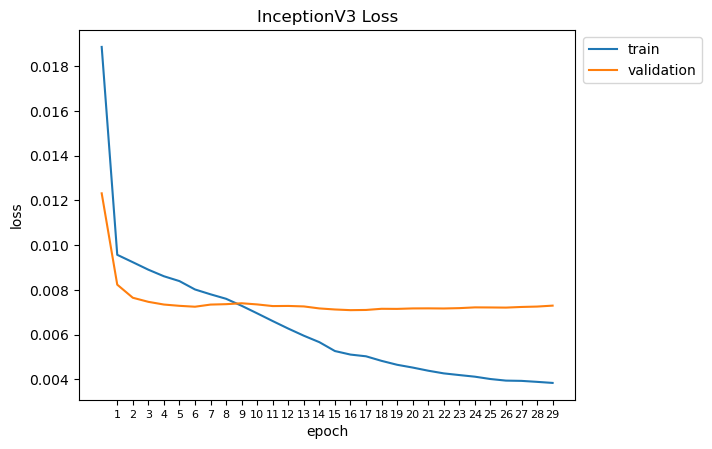

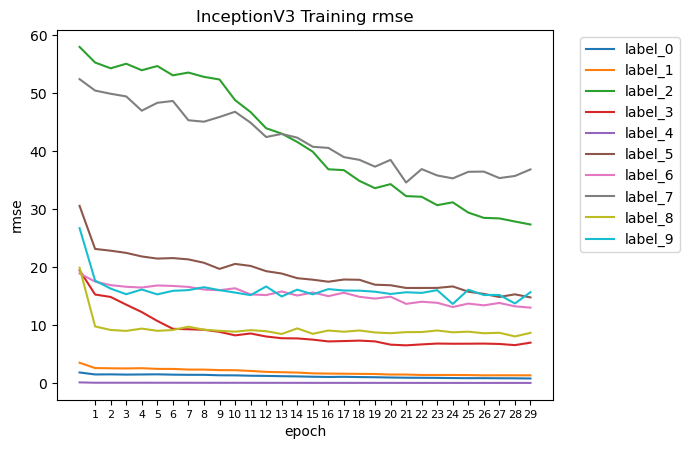

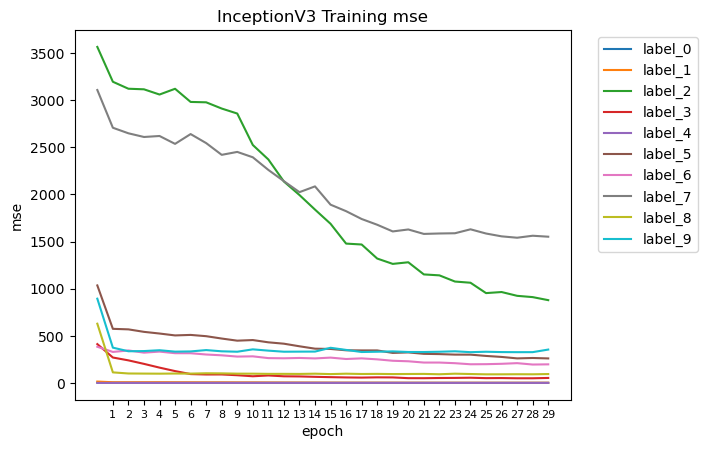

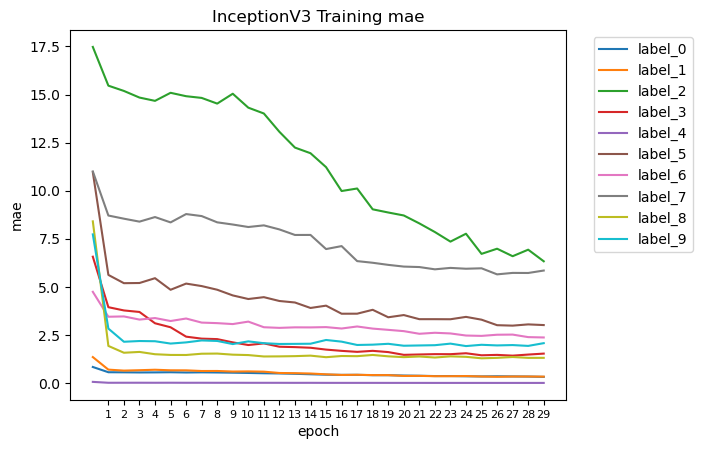

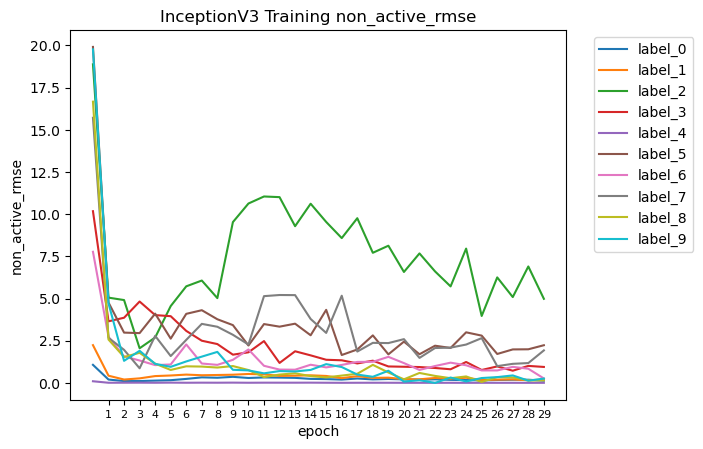

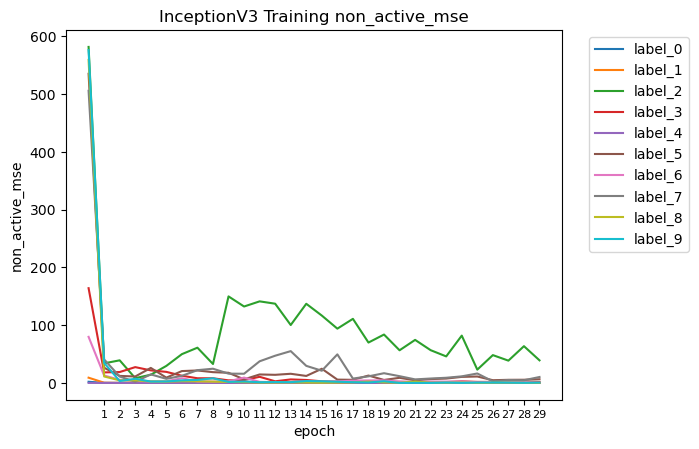

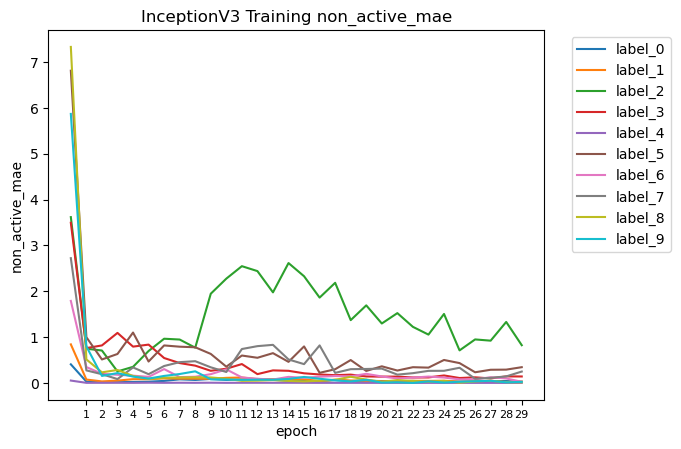

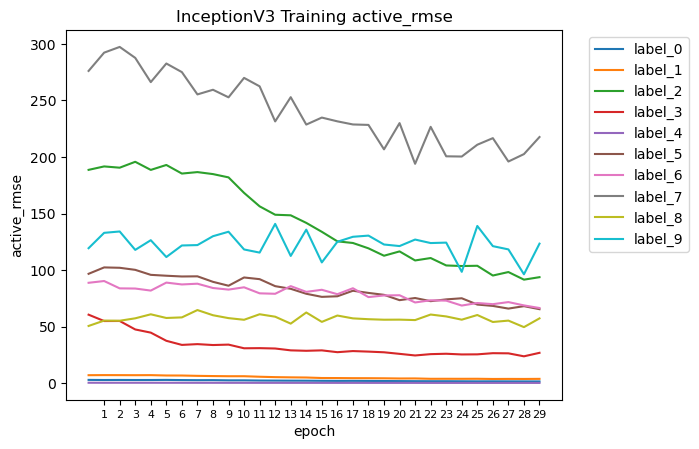

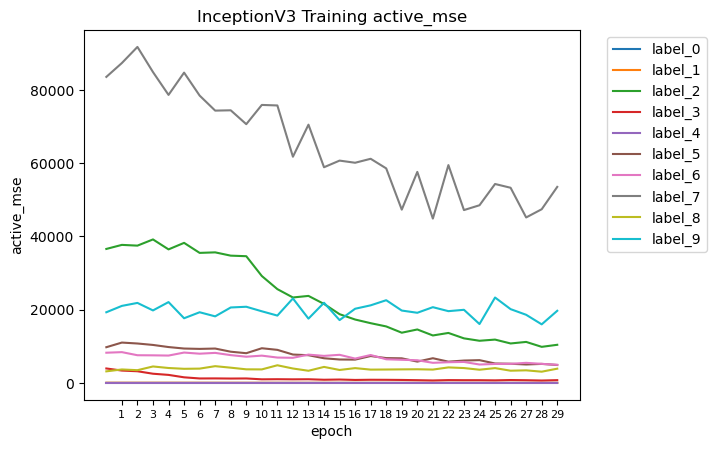

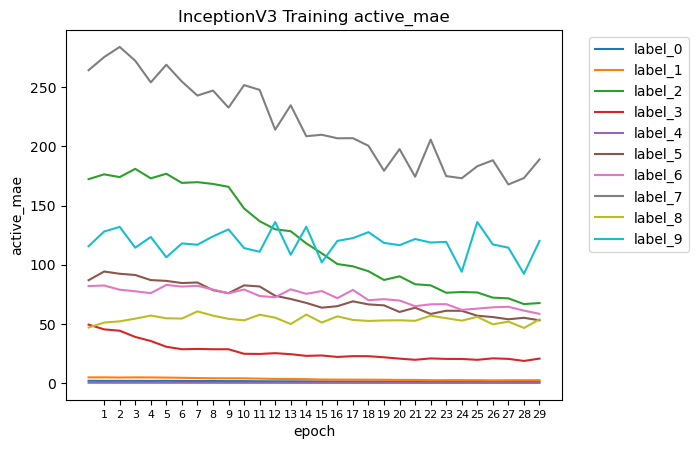

In [ ]:
plot('InceptionV3', history4, num_of_preds, data = '', num_of_batches = len(train_ds))

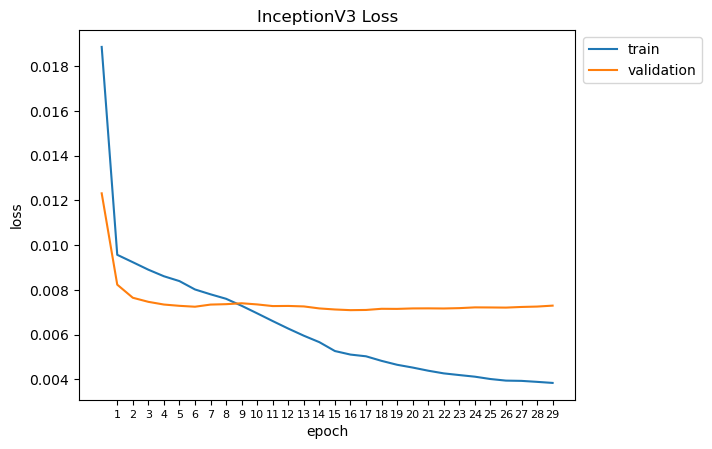

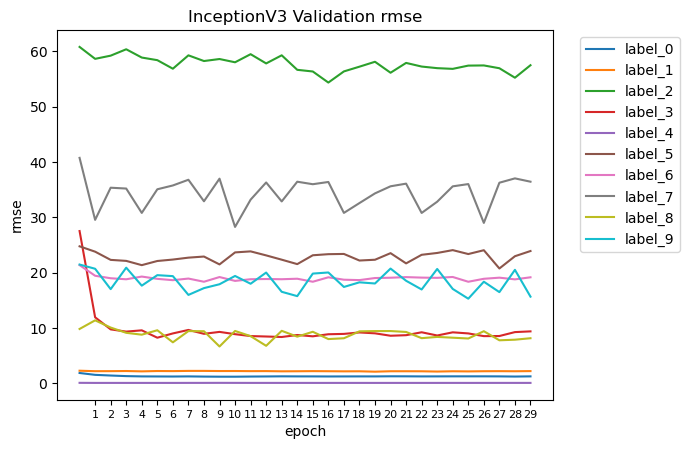

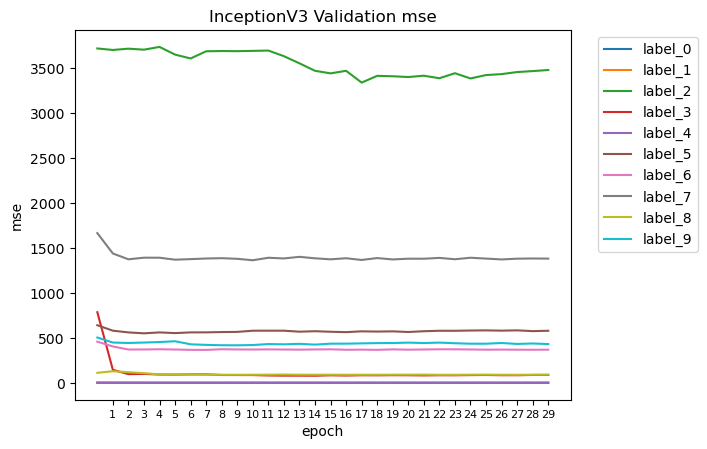

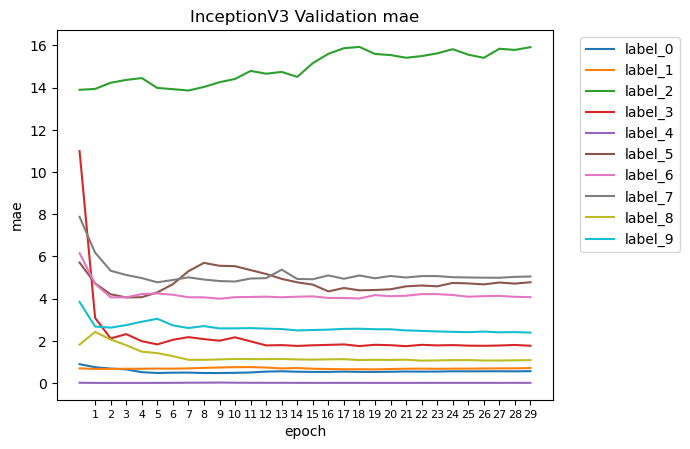

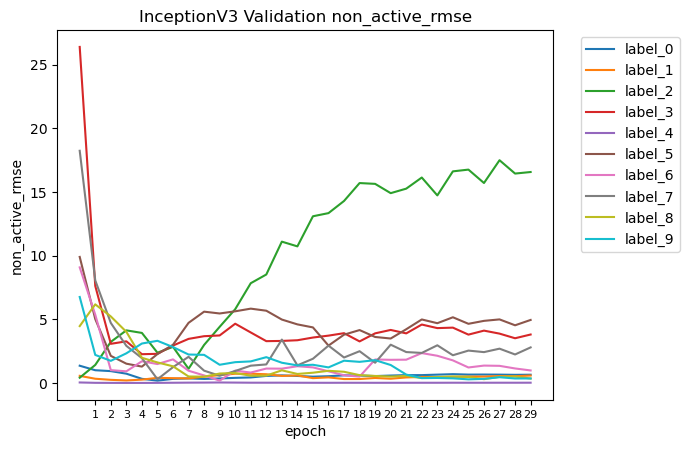

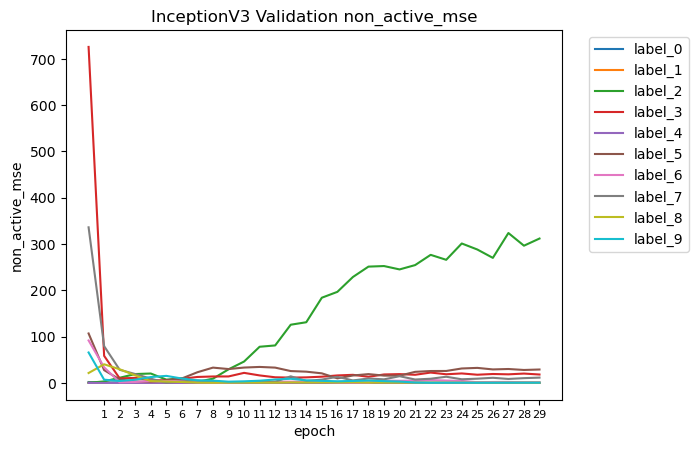

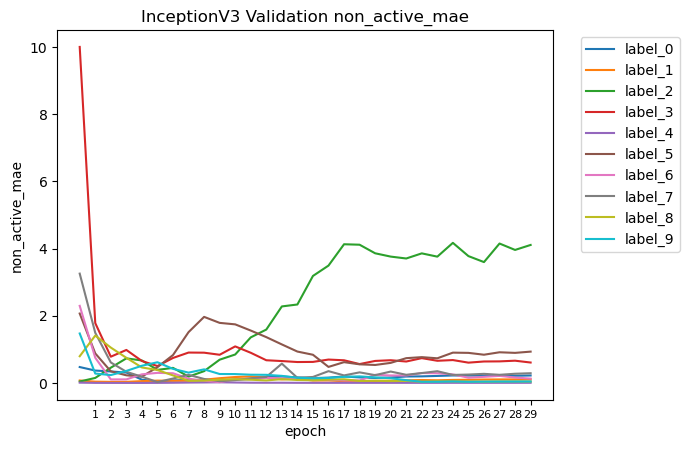

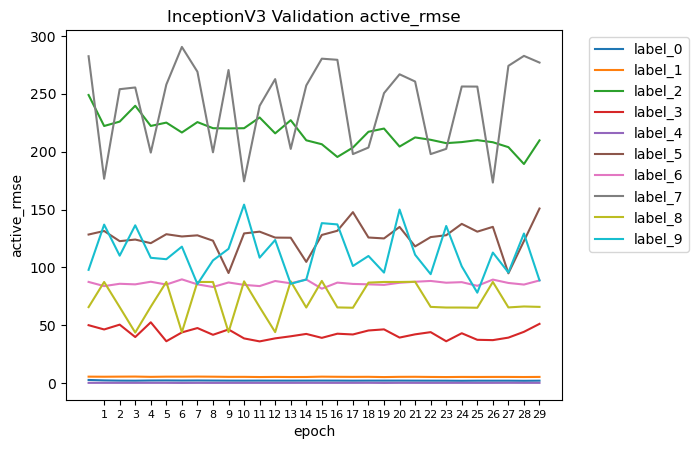

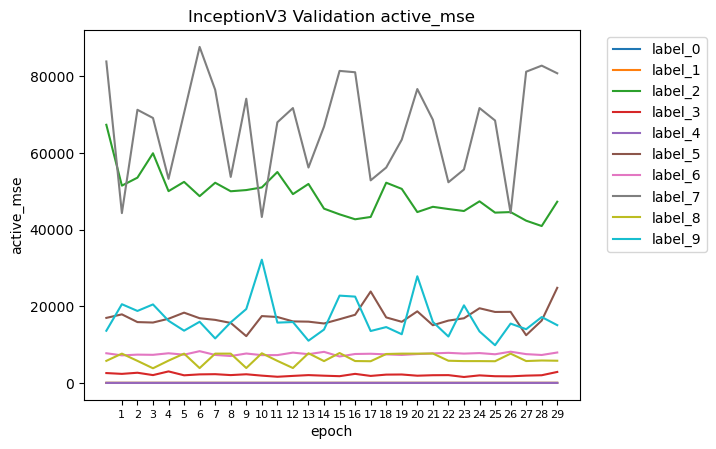

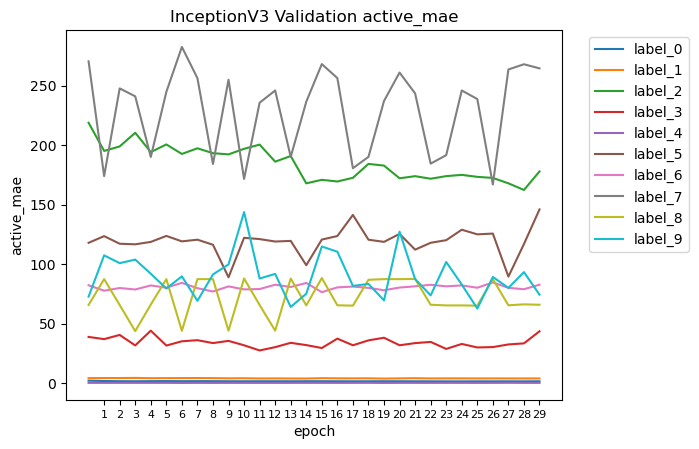

In [ ]:
plot('InceptionV3', history4, num_of_preds, data = 'val_', num_of_batches = len(val_ds)) 

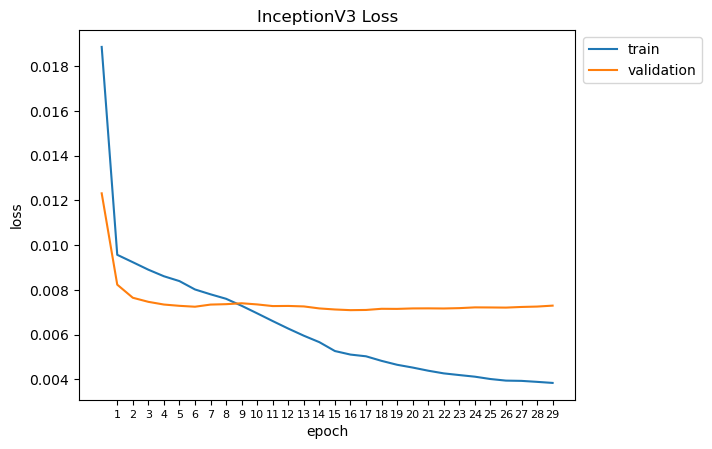

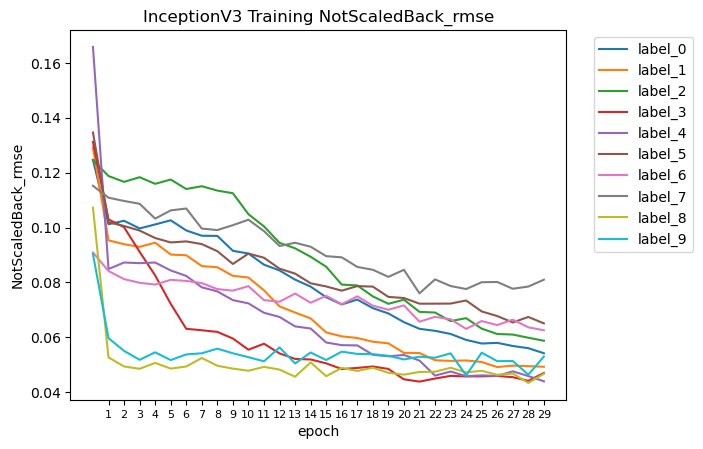

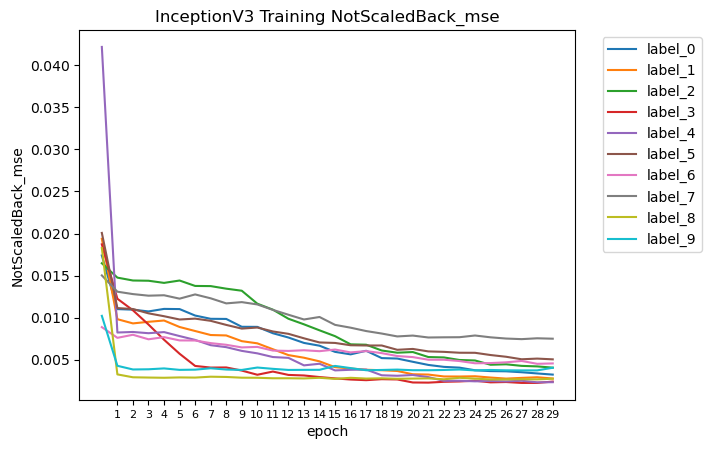

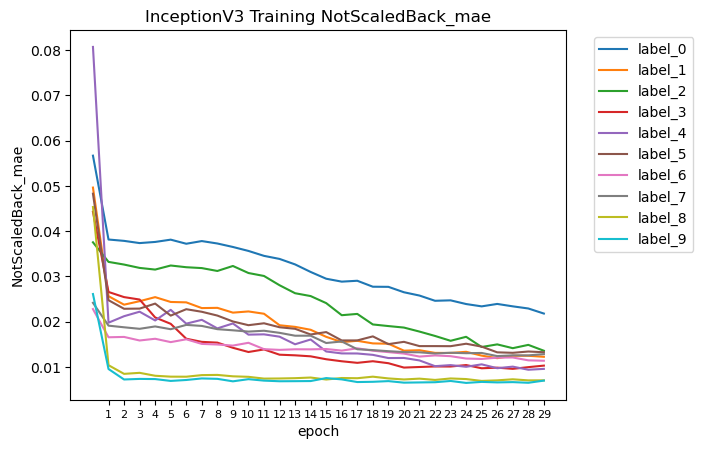

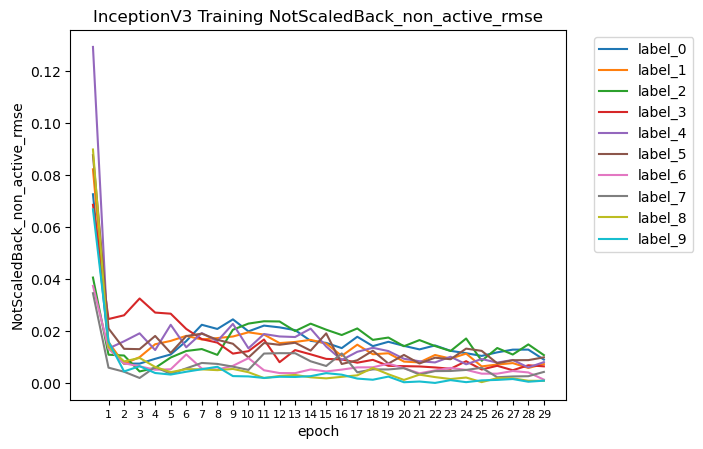

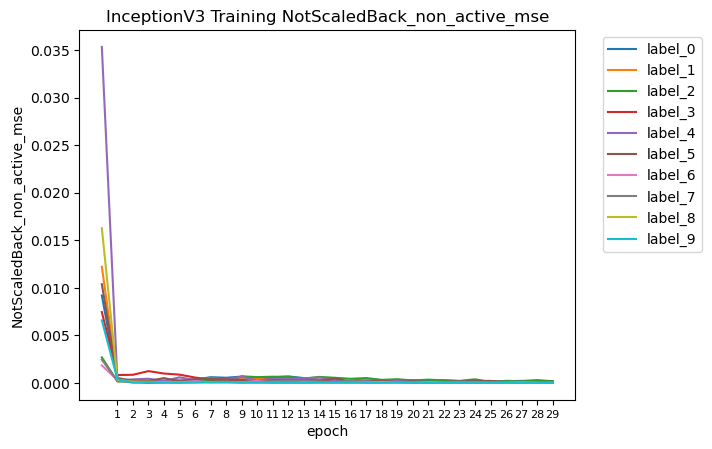

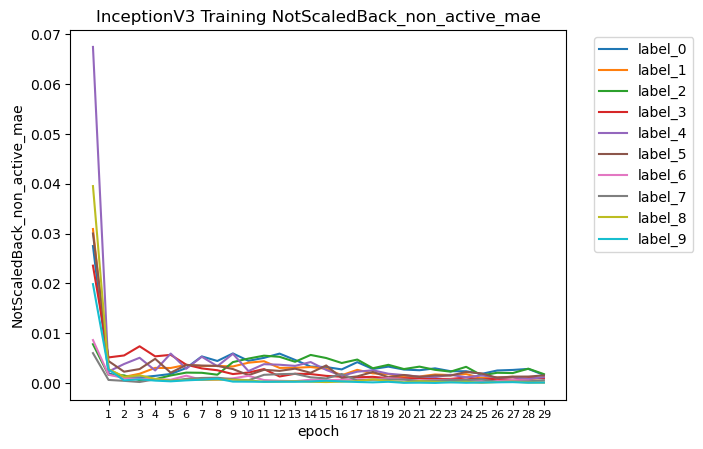

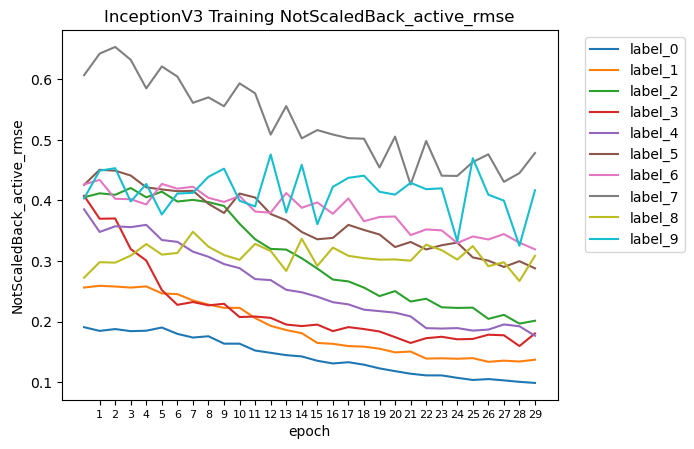

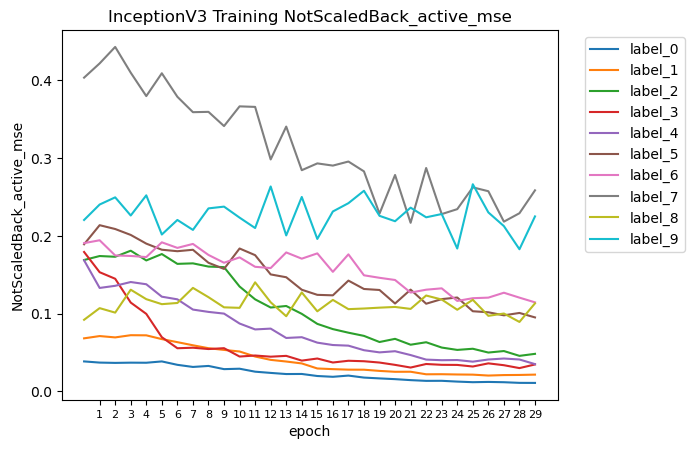

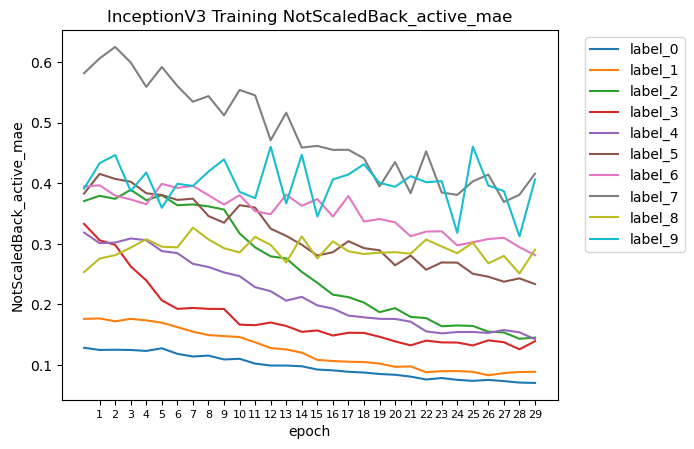

In [ ]:
plot('InceptionV3', history4, num_of_preds, data = '', num_of_batches = len(train_ds), NotScaledBack = True)

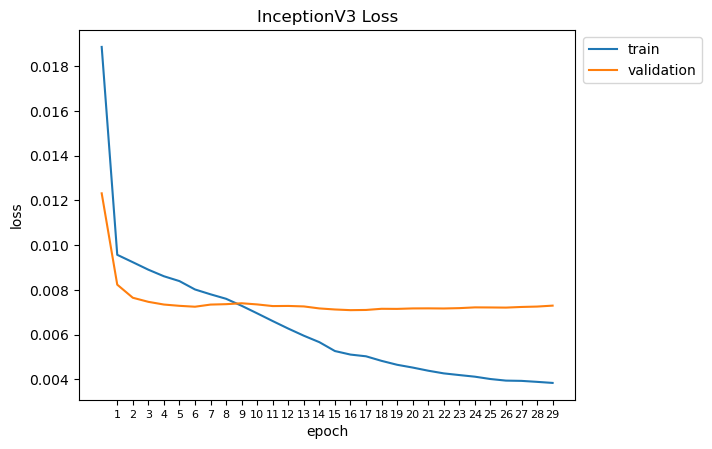

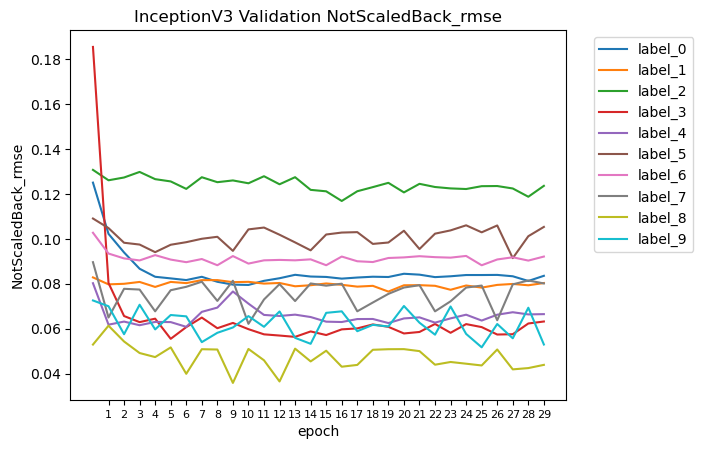

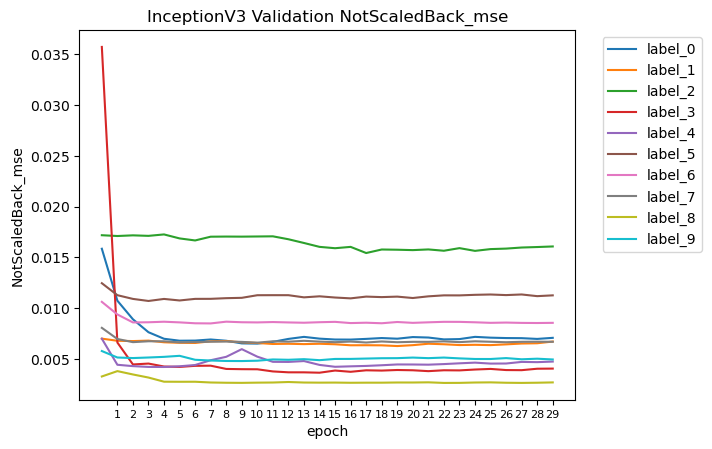

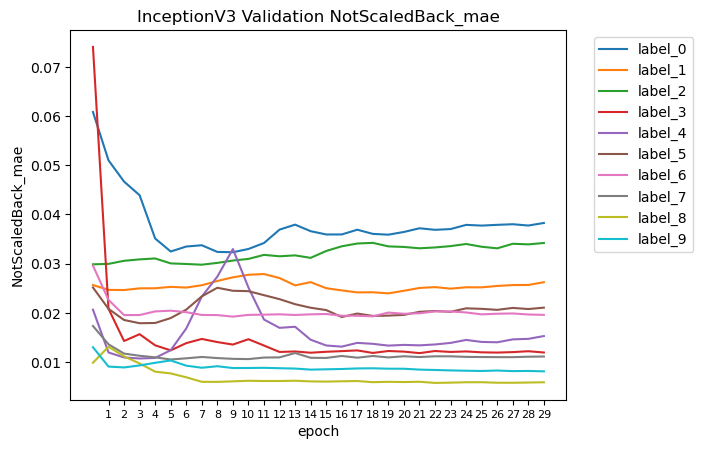

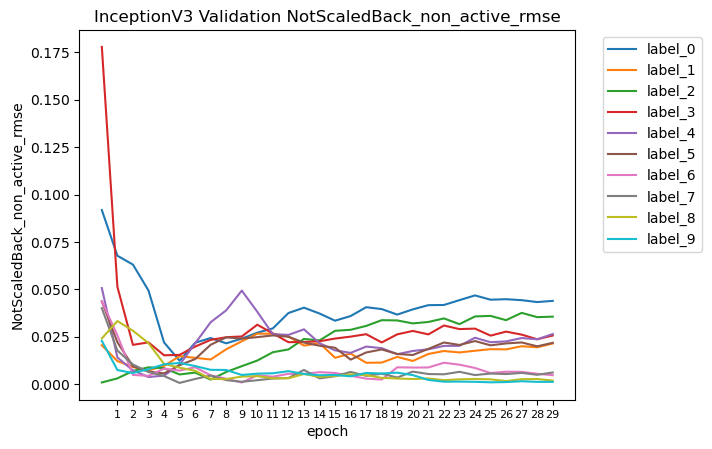

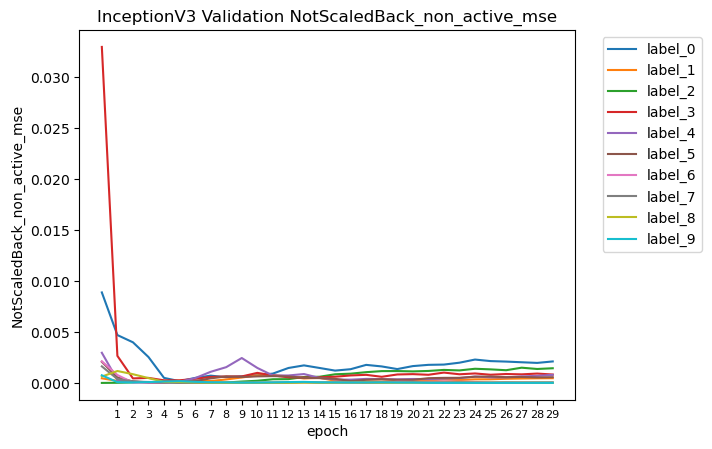

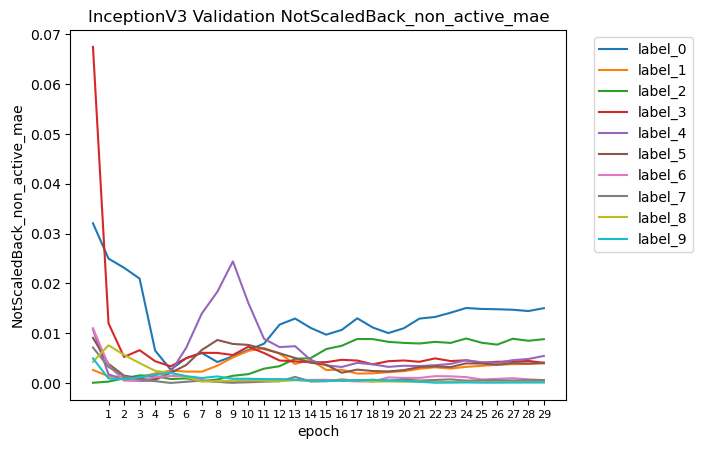

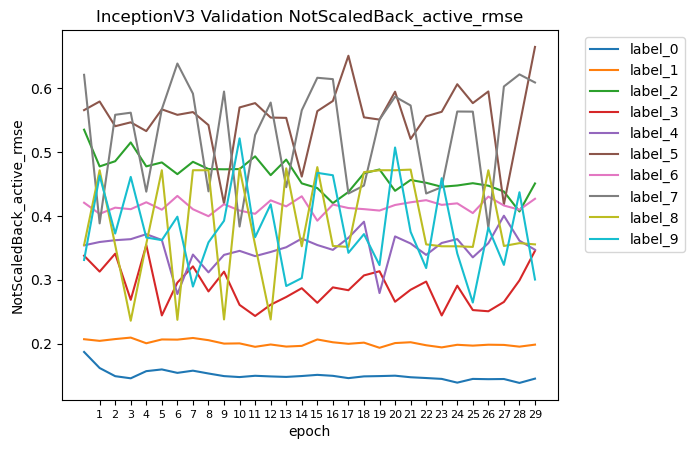

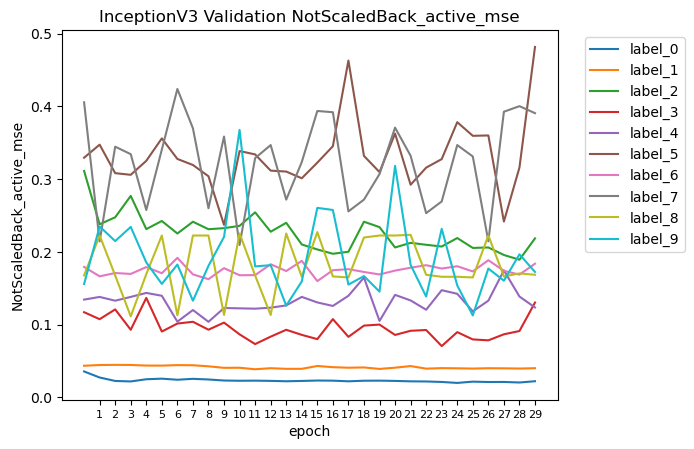

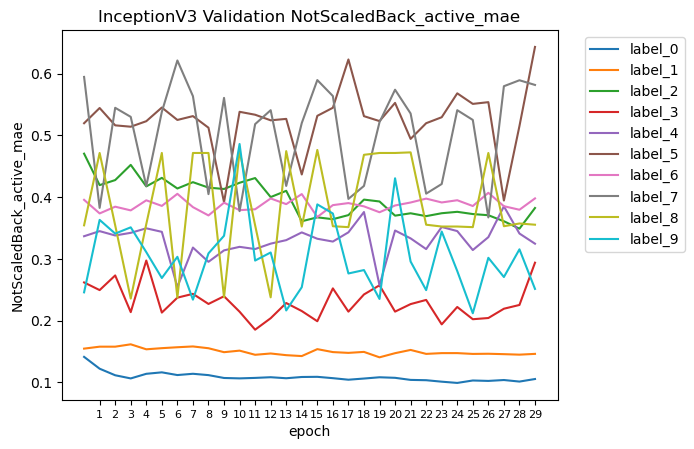

In [ ]:
plot('InceptionV3', history4, num_of_preds, data = 'val_', num_of_batches = len(val_ds), NotScaledBack = True)

# Save the history to json file

In [ ]:
with open("mae_standarization_inception_history.json", "w") as outfile:
    json.dump(history.history, outfile)
with open("mae_min_max_inception_history.json", "w") as outfile:
    json.dump(history2.history, outfile)
with open("mse_standarization_inception_history.json", "w") as outfile:
    json.dump(history3.history, outfile)
with open("mse_min_max_inception_history.json", "w") as outfile:
    json.dump(history4.history, outfile)

In [ ]:
history.history

{'loss': [0.3840101659297943,
  0.2834252715110779,
  0.26314547657966614,
  0.25197863578796387,
  0.24124424159526825,
  0.2362125664949417,
  0.23867003619670868,
  0.23253825306892395,
  0.2290612906217575,
  0.22530728578567505,
  0.22414347529411316,
  0.2219497710466385,
  0.22176752984523773,
  0.2201409786939621,
  0.21947523951530457,
  0.21710820496082306,
  0.2156880795955658,
  0.216258704662323,
  0.21400286257266998,
  0.21243329346179962,
  0.2106121927499771,
  0.21075662970542908,
  0.2078205794095993,
  0.20665478706359863,
  0.2051808089017868,
  0.20504848659038544,
  0.20546546578407288,
  0.20320358872413635,
  0.2015787810087204,
  0.19967103004455566],
 'rmse_0': [32.60466384887695,
  32.7699089050293,
  33.17162322998047,
  32.212501525878906,
  32.9659423828125,
  32.939693450927734,
  32.42433547973633,
  32.87214660644531,
  31.98211097717285,
  33.02569580078125,
  32.85260772705078,
  32.422515869140625,
  31.90731430053711,
  31.212982177734375,
  31.956

# Model-wise comparison

#### MAE:

history Std

history2 MIN-MAX

#### MSE:

history3 Std

history4 MIN-MAX

In [ ]:
len(val_ds)

4

In [ ]:
val_last_epoch_performance = []
for h in [history,history2,history3,history4]:
    for metric in h.history:
        if metric[:3] == 'val':
            val_last_epoch_performance.append(str((metric,round(h.history[metric][-1]/4,2))))

In [ ]:
val_last_epoch_performance

In [ ]:
file = open('val_last_epoch_performance.txt','w')

for item in val_last_epoch_performance:
    file.write(item+"\n")
file.close()

# Bimodal network

In [24]:
# Prepare train dataset
print("Creating train data...")
filepath = './data/Nutrition5k/dish_ids/splits/rgb_train_ids.txt' # directory to rgb_train_ids.txt
src = './data/Nutrition5k/realsense_overhead'                     # directory to images 
dest = './data/Nutrition5k/train_rgb'                             # directory to train_rgb folder
prepare_data(filepath, src, dest)

# Prepare test dataset
print("Creating test data...")
filepath = './data/Nutrition5k/dish_ids/splits/rgb_test_ids.txt' # directory to rgb_test_ids.txt
src = './data/Nutrition5k/realsense_overhead'                    # directory to images 
dest = './data/Nutrition5k/test_rgb'                             # directory to test_rgb folder
prepare_data(filepath, src, dest)

# read specified labels
labels = pd.read_csv('./data/Nutrition5k/nutrition5k_10_visible_ingr_calorie.csv')#.iloc[: , 1:]
labels['dish_id'] = labels['dish_id'] + '.png'
ingred = labels.iloc[: , 1:].columns

Creating train data...
Copying Done!
Creating test data...
Copying Done!


In [25]:
def add_binary_labels(ds):
  ds.columns = ['dish_id', 'garlic_calories', 'spinach (raw)_calories', 'cheese pizza_calories', 'olives_calories',\
       'cilantro_calories', 'roasted potatoes_calories', 'corn on the cob_calories', 'sausage_calories', 'tofu_calories',\
       'chicken breast_calories']
  ingredients = ['garlic', 'spinach (raw)', 'cheese pizza', 'olives',\
       'cilantro', 'roasted potatoes', 'corn on the cob', 'sausage', 'tofu',\
       'chicken breast']
  for i in ingredients: 
    col_name = f'{i}_calories'
    binary_col_name = f'{i}_binary'
    threshold = 0 # Change this to your desired threshold
    ds[binary_col_name] = (ds[col_name] > threshold).astype(int)
  return ds

In [26]:
labels_bin = add_binary_labels(labels)

In [27]:
labels_bin

,dish_id,garlic_calories,spinach (raw)_calories,cheese pizza_calories,olives_calories,cilantro_calories,roasted potatoes_calories,corn on the cob_calories,sausage_calories,tofu_calories,...,garlic_binary,spinach (raw)_binary,cheese pizza_binary,olives_binary,cilantro_binary,roasted potatoes_binary,corn on the cob_binary,sausage_binary,tofu_binary,chicken breast_binary
0,dish_1561662216.png,3.164916,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,0,0,0,0,0,0,0,0,0
1,dish_1561662054.png,4.480668,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,0,0,0,0,0,0,0,0,0
2,dish_1562008979.png,2.300097,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,0,0,0,0,0,0,0,0,0
3,dish_1560455030.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,dish_1558372433.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3257,dish_1563295334.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3258,dish_1566329234.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3259,dish_1562691737.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3260,dish_1558458496.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [28]:
# split dataset into train and val
train_dest = './data/Nutrition5k/train_rgb'
test_dest = './data/Nutrition5k/test_rgb'

X_train = [os.path.join(train_dest, img) for img in os.listdir(train_dest)]
X_val = [os.path.join(test_dest, img) for img in os.listdir(test_dest)]

y_train = labels_bin.loc[labels_bin.dish_id.isin(os.listdir(train_dest))]\
                .set_index('dish_id').reindex(os.listdir(train_dest))\
                .to_numpy().tolist()

y_val = labels_bin.loc[labels_bin.dish_id.isin(os.listdir(test_dest))]\
                .set_index('dish_id').reindex(os.listdir(test_dest))\
                .to_numpy().tolist()
arr_y_val = np.array(y_val)

In [ ]:
# scale labels by std and mean of training ingredients
std_by_label = pd.DataFrame(y_train).describe().iloc[2]
print(std_by_label)
mean_by_label = pd.DataFrame(y_train).describe().iloc[1]
print(mean_by_label)
for idx,i in enumerate(labels_bin.columns[1:11]):
    labels_bin[i] = labels_bin[i].apply(lambda x: (x - mean_by_label[idx]) / std_by_label[idx])

In [13]:
labels_bin

,dish_id,garlic_calories,spinach (raw)_calories,cheese pizza_calories,olives_calories,cilantro_calories,roasted potatoes_calories,corn on the cob_calories,sausage_calories,tofu_calories,...,garlic_binary,spinach (raw)_binary,cheese pizza_binary,olives_binary,cilantro_binary,roasted potatoes_binary,corn on the cob_binary,sausage_binary,tofu_binary,chicken breast_binary
0,dish_1561662216.png,1.805860,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,...,1,0,0,0,0,0,0,0,0,0
1,dish_1561662054.png,2.714584,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,...,1,0,0,0,0,0,0,0,0,0
2,dish_1562008979.png,1.208572,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,...,1,0,0,0,0,0,0,0,0,0
3,dish_1560455030.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,...,0,0,0,0,0,0,0,0,0,0
4,dish_1558372433.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3257,dish_1563295334.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,...,0,0,0,0,0,0,0,0,0,0
3258,dish_1566329234.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,...,0,0,0,0,0,0,0,0,0,0
3259,dish_1562691737.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,...,0,0,0,0,0,0,0,0,0,0
3260,dish_1558458496.png,-0.379990,-0.243677,-0.27137,-0.208655,-0.204242,-0.204758,-0.177946,-0.165719,-0.140757,...,0,0,0,0,0,0,0,0,0,0


In [29]:
# min-max normalization
max_by_label = pd.DataFrame(y_train).describe().iloc[-1]
#print(max_by_label)
min_by_label = pd.DataFrame(y_train).describe().iloc[3]
#print(min_by_label)
for idx,i in enumerate(labels_bin.columns[1:11]):
    labels_bin[i] = labels_bin[i].apply(lambda x: (x - min_by_label[idx]) / (max_by_label[idx] - min_by_label[idx]))

In [30]:
labels_bin

,dish_id,garlic_calories,spinach (raw)_calories,cheese pizza_calories,olives_calories,cilantro_calories,roasted potatoes_calories,corn on the cob_calories,sausage_calories,tofu_calories,...,garlic_binary,spinach (raw)_binary,cheese pizza_binary,olives_binary,cilantro_binary,roasted potatoes_binary,corn on the cob_binary,sausage_binary,tofu_binary,chicken breast_binary
0,dish_1561662216.png,0.214619,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,0,0,0,0,0,0,0,0,0
1,dish_1561662054.png,0.303843,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,0,0,0,0,0,0,0,0,0
2,dish_1562008979.png,0.155974,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,0,0,0,0,0,0,0,0,0
3,dish_1560455030.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,dish_1558372433.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3257,dish_1563295334.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3258,dish_1566329234.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3259,dish_1562691737.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3260,dish_1558458496.png,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [22]:
labels_bin.to_csv("nutrition5k_10label_calories_and_binarylabel.csv")

In [31]:
# split dataset into train and val
train_dest = './data/Nutrition5k/train_rgb'
test_dest = './data/Nutrition5k/test_rgb'

X_train = [os.path.join(train_dest, img) for img in os.listdir(train_dest)]
X_val = [os.path.join(test_dest, img) for img in os.listdir(test_dest)]

y_train = labels_bin.loc[labels_bin.dish_id.isin(os.listdir(train_dest))]\
                .set_index('dish_id').reindex(os.listdir(train_dest))\
                .to_numpy().tolist()

y_val = labels_bin.loc[labels_bin.dish_id.isin(os.listdir(test_dest))]\
                .set_index('dish_id').reindex(os.listdir(test_dest))\
                .to_numpy().tolist()
arr_y_val = np.array(y_val)

nobs = 8 # Maximum number of images to display
ncols = 4 # Number of columns in display
nrows = nobs//ncols # Number of rows in display

# define some params
IMG_SIZE = 224 # Specify height and width of image to match the input format of the model
CHANNELS = 3 # Keep RGB color channels to match the input format of the model
BATCH_SIZE = 64
AUTOTUNE = tf.data.experimental.AUTOTUNE # Adapt preprocessing and prefetching dynamically
SHUFFLE_BUFFER_SIZE = 1024 # Shuffle the training data by a chunck of 1024 observations

# create datasets
train_ds = create_dataset(X_train, y_train, is_training=True,
                          img_size = IMG_SIZE, channels = CHANNELS,
                          batch_size = BATCH_SIZE, buffer_size = SHUFFLE_BUFFER_SIZE)

val_ds = create_dataset(X_val, y_val,
                        img_size = IMG_SIZE, channels = CHANNELS,
                        batch_size = BATCH_SIZE, buffer_size = SHUFFLE_BUFFER_SIZE)

for f, l in train_ds.take(1):
    print("Shape of features array:", f.numpy().shape)
    print("Shape of labels array:", l.numpy().shape)

Shape of features array: (64, 224, 224, 3)
Shape of labels array: (64, 20)


In [ ]:
y_train

In [33]:
train_ds = train_ds.map(lambda x,y: (tf.image.resize(x, (75,75)),y))
val_ds = val_ds.map(lambda x,y: (tf.image.resize(x, (75,75)),y))

In [34]:
class self_Accuracy(tf.keras.metrics.Metric):

    def __init__(self, label, name='accuracy_by_label_'):
        super(self_Accuracy, self).__init__(name=name)
        self.label = label
        self.correct = self.add_weight(name='correct', initializer='zeros')
        self.total = self.add_weight(name='total', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        """
        Called at the end of each batch:
        calculates number of correct prediction and total number of predictions
        """
        # number of correct predictions
        y_true_bin = y_true[:, y_true.shape[1]//2:]
        y_pred_logit = y_pred[:, y_true.shape[1]//2:]
        y_pred_prob = tf.nn.sigmoid(y_pred_logit)
        y_pred_bin = tf.where(y_pred_prob>0.5,1,0)
        self.correct.assign_add(tf.keras.metrics.binary_accuracy(tf.cast(y_true_bin[:,self.label],tf.float32), 
                                tf.cast(y_pred_bin[:,self.label],tf.float32)) 
                                * tf.cast(tf.size(y_pred_bin),tf.float32))
        # total number of predictions 
        self.total.assign_add(tf.cast(tf.size(y_pred_bin),tf.float32))
        
    def result(self):
        return self.correct / self.total
    
    def reset_state(self):
        """
        reset variables between epochs
        """
        self.correct.assign(0)
        self.total.assign(0)

class self_MSE(tf.keras.metrics.Metric):
    """
    Calculates total MSE for a label.
    NOTE: we need to calculate average later separately
          by dividing total MSE for a label by the number of batches

    """
    def __init__(self, class_id, name='mse_by_label_', **kwargs):
        super(self_MSE, self).__init__(name=name, **kwargs)
        self.class_id = class_id
        self.mse = self.add_weight(name='mse', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true_bin = y_true[:, y_true.shape[1]//2:]
        y_pred_logit = y_pred[:, y_true.shape[1]//2:]
        y_pred_prob = tf.nn.sigmoid(y_pred_logit)
        y_pred_bin = tf.where(y_pred_prob>0.5,1,0)
        # Extract calorie values from y_true
        z_true = y_true[:, :y_true.shape[1]//2]
        z_pred = y_pred[:, :y_true.shape[1]//2]

        z_true = tf.cast(z_true[:,self.class_id], tf.float32)
        z_pred = tf.cast(z_pred[:,self.class_id], tf.float32)
        y_true_bin = tf.cast(y_true_bin[:,self.class_id], tf.float32)
        regression_loss = y_true_bin * tf.square(z_true - z_pred)
        mse = tf.reduce_mean(regression_loss, axis=0)
        self.mse.assign_add(mse)

    def result(self):
        return self.mse

    def reset_state(self):
        self.mse.assign(0.)

class self_MAE(tf.keras.metrics.Metric):
    """
    Calculates total MAE for a label.
    NOTE: we need to calculate average later separately
          by dividing total MAE for a label by the number of batches

    """
    def __init__(self, class_id, name='mae_by_label_', **kwargs):
        super(self_MAE, self).__init__(name=name, **kwargs)
        self.class_id = class_id
        self.mae = self.add_weight(name='mae', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true_bin = y_true[:, y_true.shape[1]//2:]
        y_pred_logit = y_pred[:, y_true.shape[1]//2:]
        y_pred_prob = tf.nn.sigmoid(y_pred_logit)
        y_pred_bin = tf.where(y_pred_prob>0.5,1,0)
        # Extract calorie values from y_true
        z_true = y_true[:, :y_true.shape[1]//2]
        z_pred = y_pred[:, :y_true.shape[1]//2]

        z_true = tf.cast(z_true[:,self.class_id], tf.float32)
        z_pred = tf.cast(z_pred[:,self.class_id], tf.float32)
        y_true_bin = tf.cast(y_true_bin[:,self.class_id], tf.float32)
        regression_loss = y_true_bin * tf.abs(z_true - z_pred)
        mae = tf.reduce_mean(regression_loss, axis=0)
        self.mae.assign_add(mae)

    def result(self):
        return self.mae

    def reset_state(self):
        self.mae.assign(0.)

In [35]:
def combined_loss(y_true, y_pred):

  z_true = y_true[:, :y_true.shape[1]//2]
  z_pred = y_pred[:, :y_true.shape[1]//2]
  
  y_true_bin = y_true[:, y_true.shape[1]//2:]
  y_pred_logit = y_pred[:, y_true.shape[1]//2:]
  y_pred_prob = tf.nn.sigmoid(y_pred_logit)

    # Compute cross-entropy loss
  ce_loss = tf.keras.losses.binary_crossentropy(y_true_bin, y_pred_prob)

    # Compute regression loss only for active ingredients
  regression_loss = y_true_bin * tf.square(z_true - z_pred)
  reg_loss = tf.reduce_sum(regression_loss, axis=1)

    # Combine the losses
  loss = tf.reduce_mean(ce_loss) + tf.reduce_mean(reg_loss)
  return loss

input_shape = (75, 75, 3)
# Load the InceptionV3 model with pretrained weights
base_model = InceptionV3(weights='imagenet', input_shape = input_shape, include_top=False)

# Add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)

# Add a fully-connected layer for binary classification
binary_preds = Dense(10, name='binary_preds')(x)

# Add a fully-connected layer for regression
regression_preds = Dense(10, name='regression_preds')(x)

combined_preds = Concatenate(name='combined_preds')([binary_preds, regression_preds])

model = Model(inputs=base_model.input, outputs=combined_preds)

lr_decayed_fn = tf.keras.experimental.CosineDecay(initial_learning_rate=0.0001, decay_steps=1000)
optimizer_adam_cos_decay = tf.keras.optimizers.Adam(learning_rate=lr_decayed_fn)

#Compile the model
model.compile(optimizer=optimizer_adam_cos_decay, loss=combined_loss, metrics=[self_Accuracy(label = i, name='acc_{}'.format(i)) for i in range(10)]+
              [self_MSE(class_id = i, name='mse_{}'.format(i)) for i in range(10)]+
              [self_MAE(class_id = i, name='mae_{}'.format(i)) for i in range(10)])

EPOCHS = 30

#Train the model
history = model.fit(train_ds,
                    epochs=EPOCHS,
                    validation_data=val_ds,
                    verbose=1)

Epoch 1/30
44/44 [==============================] - 61s 326ms/step - loss: 0.7900 - acc_0: 0.6298 - acc_1: 0.8457 - acc_2: 0.7735 - acc_3: 0.6581 - acc_4: 0.6196 - acc_5: 0.8955 - acc_6: 0.6363 - acc_7: 0.6062 - acc_8: 0.8171 - acc_9: 0.8933 - mse_0: 2.2835 - mse_1: 1.1851 - mse_2: 3.4919 - mse_3: 0.4258 - mse_4: 0.4257 - mse_5: 0.6939 - mse_6: 0.4765 - mse_7: 0.4587 - mse_8: 0.1624 - mse_9: 0.1448 - mae_0: 3.5070 - mae_1: 1.8799 - mae_2: 1.5104 - mae_3: 0.8748 - mae_4: 0.7572 - mae_5: 0.9528 - mae_6: 0.6684 - mae_7: 0.5882 - mae_8: 0.3106 - mae_9: 0.2365 - val_loss: 0.7227 - val_acc_0: 0.7101 - val_acc_1: 0.6529 - val_acc_2: 0.6193 - val_acc_3: 0.9310 - val_acc_4: 0.8580 - val_acc_5: 0.9073 - val_acc_6: 0.6647 - val_acc_7: 0.7258 - val_acc_8: 0.8797 - val_acc_9: 0.6943 - val_mse_0: 0.1870 - val_mse_1: 0.2974 - val_mse_2: 0.1026 - val_mse_3: 0.1625 - val_mse_4: 0.0304 - val_mse_5: 0.1147 - val_mse_6: 0.0774 - val_mse_7: 0.0802 - val_mse_8: 0.0066 - val_mse_9: 0.0724 - val_mae_0: 0.4756

In [37]:
d = history.history
df = pd.DataFrame({'epoch':[],'accuracy_train':[],
                   'accuracy_val':[], 'mse_train':[],
                   'mse_val':[], 'mae_train':[],
                   'mae_val':[], 'loss': [], 'val_loss':[],
                    'label':[]})

for idx in range(10):
    for ep in range(EPOCHS):
        
        acc_train = d['acc_{}'.format(idx)][ep]
        mse_train = d['mse_{}'.format(idx)][ep]
        acc_val = d['val_acc_{}'.format(idx)][ep]
        mse_val = d['val_mse_{}'.format(idx)][ep]
        mae_train = d['mae_{}'.format(idx)][ep]
        mae_val = d['val_mae_{}'.format(idx)][ep]
        loss_train = d['loss'][ep]
        loss_val = d['val_loss'][ep]

        temp = pd.DataFrame({'epoch':[ep+1],'accuracy_train':[acc_train],
                             'accuracy_val':[acc_val], 'mse_train':[mse_train],
                             'mse_val':[mse_val], 'mae_train':[mae_train],
                             'mae_val':[mae_val], 'loss': [loss_train], 'val_loss':[loss_val],
                             'label':[idx+1]})
        df = df.append(temp, ignore_index=True)

df.label = df.label.astype(str)

<ipython-input-37-3d31bc006bdc>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(temp, ignore_index=True)
<ipython-input-37-3d31bc006bdc>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(temp, ignore_index=True)
<ipython-input-37-3d31bc006bdc>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(temp, ignore_index=True)
<ipython-input-37-3d31bc006bdc>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(temp, ignore_index=True)
<ipython-input-37-3d31bc006bdc>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

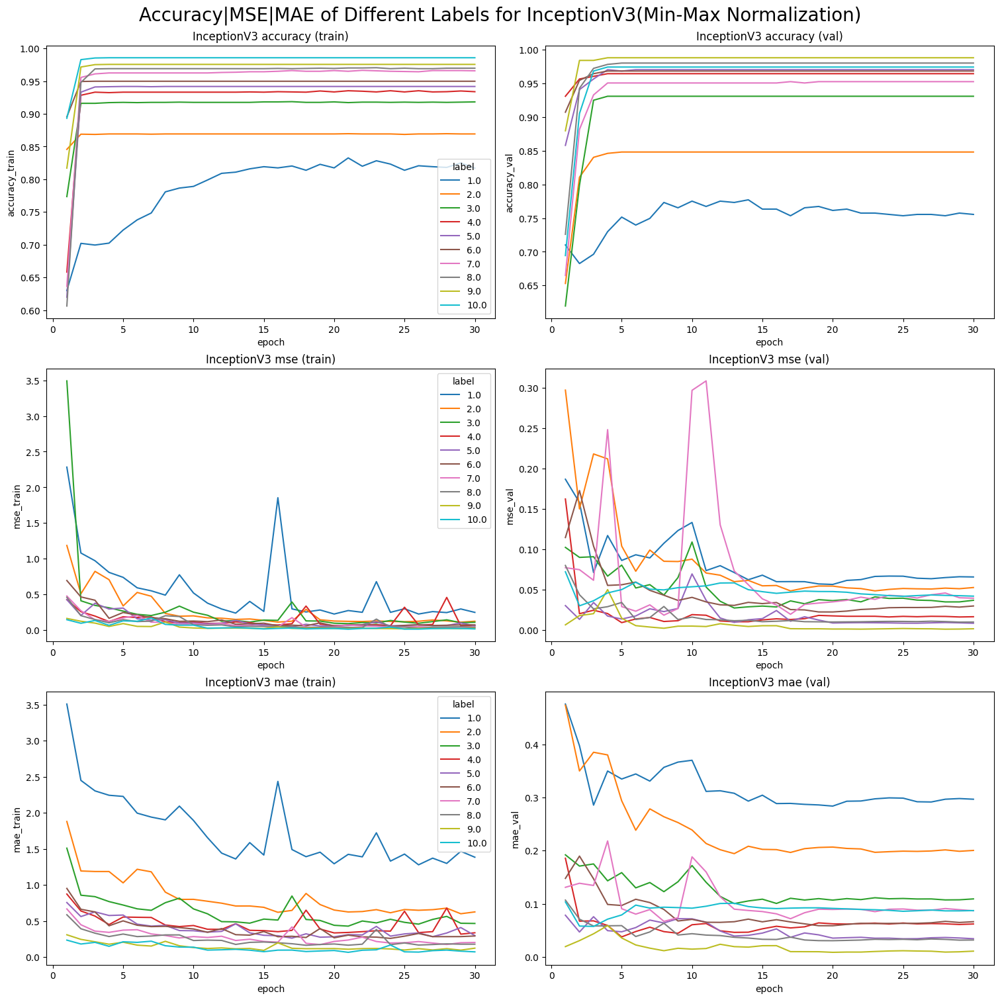

In [38]:
import seaborn as sns
fig, axis = plt.subplots(3, 2, figsize=(15, 15), constrained_layout = True)
metrics = ['accuracy', "mse", "mae"]
datasets = ['train', 'val']
for i in range(3):
    for j in range(2):
        if j == 1:
            sns.lineplot(data=df, x="epoch", y="{}_{}".format(metrics[i], datasets[j]), legend=False, hue="label", ax=axis[i,j])\
                .set(title='InceptionV3 {} ({})'.format(metrics[i], datasets[j]))
        else:
            sns.lineplot(data=df, x="epoch", y="{}_{}".format(metrics[i], datasets[j]), legend=True, hue="label", ax=axis[i,j])\
                .set(title='InceptionV3 {} ({})'.format(metrics[i], datasets[j]))

fig.suptitle('Accuracy|MSE|MAE of Different Labels for InceptionV3(Min-Max Normalization)', fontsize=20);

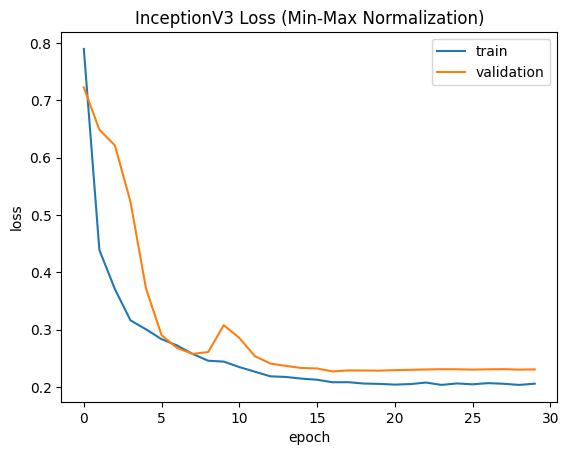

In [39]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('InceptionV3 Loss (Min-Max Normalization)')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

In [26]:
for x, y in val_ds.take(1):
    # Get the predicted output for the image
    y_pred = model.predict(x)
    # Print the predicted output
    print(y_pred)
    print(np.shape(y_pred))
    print(y)

2/2 [==============================] - 2s 229ms/step
[[ 0.5544425   0.38243556  0.45860034 ... -1.5795968  -1.0904589
   0.33747253]
 [ 0.2348217   0.23367967  0.42699963 ... -0.63303685  1.873337
   0.6066016 ]
 [ 0.52670074  0.40104195  0.7064242  ...  0.06986471 -0.68088746
   0.5943252 ]
 ...
 [ 0.5659273   0.5281987   0.5024824  ... -1.3015836   0.3707266
  -0.05521581]
 [ 0.494198    0.29996023  0.34766597 ... -0.26346672 -0.128138
   1.5347923 ]
 [ 0.24938565  0.10537895  0.6531076  ... -0.6315088  -0.18677866
   1.1629627 ]]
(64, 20)
tf.Tensor(
[[0.27754974 9.877201   0.         ... 1.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.5632692  0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        

In [ ]:
for f, l in train_ds.take(1):
  #print(l[:, :len(l)//2])
  #print(l.shape[1]//2)
  #print(l[:, len(l)//2:])
  c1 = l[:, :l.shape[1]//2]
  label1 = l[:, l.shape[1]//2:]
  c2 = l[:, :l.shape[1]//2]+0.5
  label2 = l[:, l.shape[1]//2:]
  print(tf.keras.losses.binary_crossentropy(label1, label1))

  regression_loss = label1 * tf.square(c1 - c2)
  print(regression_loss)
  reg_loss = tf.reduce_sum(regression_loss, axis=1)
  print(reg_loss)